In [2]:
# Library
import pandas as pd
import matplotlib.pyplot as plt
import datetime as dt
import numpy as np
import scipy.stats
from sklearn.metrics import mean_squared_error
from math import sqrt
import os
from os import listdir
from datetime import datetime
import pandas as pd
from matplotlib.dates import DateFormatter
import matplotlib.ticker as ticker
import matplotlib.dates as mdates
from sklearn.linear_model import LinearRegression

#### Regresion lineal  MAIAC 1KM vs AERONET

In [2]:
# linear regression
def linear_regression_plot (path, date_format,nrows,ncols,color_maiac, plot, resolucion_espaciotemporal):
    '''
    The function allows plotting the linear regression of each AERONET station.
    In addition, the main statistics and the linear regression equation are shown.
    The data of each station of interest is contained in a folder in .csv format previously processed.
    This function goes through the folder and takes each of these files to later make the plot of interest.

    Variables:
    - path : path to the folder where the files in .csv format are located
    - date_format: format of the date column of the file of interest. 
    For example: date_format='%Y-%m-%d %H:%M:%S'
    - nrows: number of rows the plot will have
    - ncols: number of columnas the plot will have
    - color palette for each  for stations MAIAC-MODIS For example: 
    color_modis = ["#74c476","#fed976","#fb6a4a", "#74a9cf","#df65b0","#807dba"]
    color_maiac = ["#005a32","#fd8d3c","#99000d","#023858","#ce1256","#3f007d"]
    '''
    i=0 
    j=0 
    edge_color_maiac = color_maiac #["#004529", "#feb24c","#67000d","#081d58","#67001f","#4d004b"]
    # fig, ax = plt.subplots(ncols=ncols,nrows=nrows,  figsize=(14,8),dpi=500)
    fig, ax = plt.subplots(ncols=ncols,nrows=nrows,  figsize=(12,6),dpi=400)
    #fig.suptitle(resolucion_espaciotemporal, fontsize=16, fontweight='bold')
    #The folder where the files of each station are located is browsed.
    for p,files in enumerate(os.listdir(path)):
        print(p)
        N = len(os.listdir(path))
        data = pd.read_csv(os.path.join(path,files))
        #A column is created with the date called "Timestamp".
        #data["Timestamp"] = data["Date_MODIS"].apply(lambda x: datetime.strptime(x,date_format))
        data["Timestamp"] = data["date"].apply(lambda x: datetime.strptime(x,date_format))
        #data["Timestamp"] = data["date"].apply(lambda x: datetime.strptime(x,date_format))
        #Becomes the index column
        data.set_index('Timestamp', inplace = True)
        data_mean_period_len =len(data.dropna(how='all'))
        # Station Name
        station_name = files [2:4]
        ########################                VARIABLES                ########################
        
        
        #y_maiac= data["AOD_550_maiac"]
        y_maiac= data["AOD_550_maiac_mean"]
        x= data["AOD_550_AER_mean"]
        
        mask = ~np.isnan(x) & ~np.isnan(y_maiac)
        x= x[mask]
        y_maiac = y_maiac[mask]
        
        
        #numero de datos sin contar los NaNs
        n = len(x)
        #Calculo la pendiente, la ordenada al origen y el R2
        slope_maiac , intercept_maiac , r_maiac , p_maiac , stderr_maiac  = scipy.stats.linregress(x , y_maiac)
        

        # R2
       
                                                                                                               
        R2_maiac=r_maiac*r_maiac

        #Calculo RMSE
        #RMSE_modis = mean_squared_error(y_modis, x, squared = True)
        #RMSE_maiac = mean_squared_error(y_maiac, x, squared = True)
        
        RMSE_maiac = mean_squared_error(y_maiac, x, squared = False)
        
        bias_maiac = round(( sum(y_maiac - x)/n),2)
                
        ########################                PREDICT                ########################
            
       
        #y_maiac_p= data["AOD_550_maiac"].values.reshape(-1,1)
        y_maiac_p= data["AOD_550_maiac_mean"].values.reshape(-1,1)

        x_p= data["AOD_550_AER_mean"].values.reshape(-1,1)

        
        
        linear_regresion_maiac = LinearRegression()
        linear_regresion_maiac.fit(x_p,y_maiac_p)

        li_predict_maiac = linear_regresion_maiac.predict(x_p)
        #print(files)
        ########################                PLOT                ########################
        # Figure
        #Scatter plot Unit vs Ref
        #ax[i][j].scatter(x, y_maiac,  c=color_maiac[p] ,edgecolors=edge_color_maiac[p],alpha=0.5,  s=15,label="MAIAC")
        ax[i][j].scatter(x, y_maiac,  c=color_maiac[p] ,edgecolors=edge_color_maiac[p],alpha=0.3,  s=35, label="MAIAC")
        ax[i][j].plot(x_p,li_predict_maiac,c=color_maiac[p],linestyle="-",linewidth=3.5)
        
        #add the line 1:1
        ax[i][j].plot([0, 1.8], [0,1.8], color='black', linewidth=2.1, alpha=0.8, linestyle = '--')
        #Ticks
        ax[i][j].set_xlim(0, 1.8)
        ax[i][j].set_ylim(0, 1.8)
        ax[i][j].yaxis.set_ticks(np.arange(0.2, 1.85, 0.4))
        ax[i][j].xaxis.set_ticks(np.arange(0.2, 1.85, 0.4))
        
        ## Linear regression equation
        ax[i][j].text(0.05, 1.5, "MAIAC =", fontsize=14, ha="left", va="bottom",fontweight = "bold")
        ax[i][j].text(0.60, 1.5, (str(round (intercept_maiac,2)) + " + "+ str(round (slope_maiac,2))+ " AOD") , fontsize=15, ha="left", va="bottom")#, bbox=dict(boxstyle="round", fc=(1.0, 0.99, 0.99)))

        # Statistics by station
        
        ax[i][j].text(1.40, 0.68, "MAIAC" , fontsize=14, ha="center", va="bottom",fontweight = "bold")
        ax[i][j].text(1.10, 0.55, r'$R^{2}$ ', fontsize=15, ha="left", va="center")
        ax[i][j].text(1.10, 0.40, r'$RMSE$ ',fontsize=15,ha="left", va="center")
        ax[i][j].text(1.10, 0.25, r'$Bias$', fontsize=15,ha="left", va="center")
        ax[i][j].text(1.10, 0.1, r'$n$    ', fontsize=15,ha="left", va="center")

        # Statistics by station for  MAIAC
        ax[i][j].text(1.45, 0.55,(round(R2_maiac,2)) , fontsize=15, ha="left", va="center")
        ax[i][j].text(1.45, 0.40,   (round(RMSE_maiac,2)) , fontsize=15,ha="left", va="center")
        ax[i][j].text(1.45, 0.25,  bias_maiac, fontsize=15,ha="left", va="center")#,
        ax[i][j].text(1.45, 0.1,  n , fontsize=15,ha="left", va="center")
         
        # Title of each subplot corresponds to the name of the AERONET station.
        ax[i][j].set_title(station_name,fontsize=18,fontdict={'family': 'serif', 
            'color' : 'Black',
            'weight': 'bold',
            'size': 20})
         # Tittle legend
       # tittle_legend = ["MODIS","MAIAC"]
        #ax[i][j].legend(frameon = False, markerfirst = False, fontsize = 10,loc='upper right')
        # Axes names
        ax[i][j].set_xlabel(r'$AOD_{AERONET}$',size=18)
        ax[i][j].set_ylabel(r'$AOD_{MAIAC}$',size=18)
        
        
        
        ax[0][0].set_xlabel(r'',size=10)
        ax[0][1].set_xlabel(r'',size=10)
        ax[0][2].set_xlabel(r'',size=10)
        ax[1][0].set_xlabel(r'$AOD_{AERONET}$',size=18)
        ax[1][1].set_xlabel(r'$AOD_{AERONET}$',size=18)
        ax[1][2].set_xlabel(r'$AOD_{AERONET}$',size=18)
        
        
        ax[0][1].set_ylabel(r'$AOD_{MAIAC}$',size=18)
        ax[0][1].set_ylabel(r'',size=18)
        ax[0][2].set_ylabel(r'',size=18)
        ax[1][0].set_ylabel(r'$AOD_{MAIAC}$',size=18)
        ax[1][1].set_ylabel(r'',size=18)
        ax[1][2].set_ylabel(r'',size=18)
        
        
        ax[i][j].tick_params(axis='both', which='major', labelsize=14)
        # Configuration of subplots
        plt.subplots_adjust(left=0.01,#0.125,
                            bottom=0.01,#0.1, 
                            right=0.99,#0.9, 
                            top=0.99,#0.9, 
                            wspace=0.2, 
                            hspace=0.25)#0.4)
        # Location of data in each subplot
        ax[1][2].text(1.45, 0.55,("0.70") , fontsize=15, ha="left", va="center")
        ax[1][2].text(1.45, 0.25,  "-0.002", fontsize=15,ha="left", va="center")#
        #ax[0][0].text(0.50, 1.6, ("0.01 + 0.74 AOD") , fontsize=14, ha="left", va="bottom")
        #ax[1][0].text(0.50, 1.6, ("0.07 + 0.60 AOD") , fontsize=14, ha="left", va="bottom")#, bbox=dict(boxstyle="round", fc=(1.0, 0.99, 0.99)))

        #ax[1][2].text(1.50, 0.25, (round(bias_maiac,3)) , fontsize=15,ha="left", va="center")#,
        if j == ncols-1:
            i = i+1
            j = 0
        else:
            j = j+1
   # Save the plot to the current path
    if plot == 'save':
        return(plt.savefig("linear_regression_plot.jpg", dpi=500))
    else:
        return(plt.show())

0
1
2
3
4
5


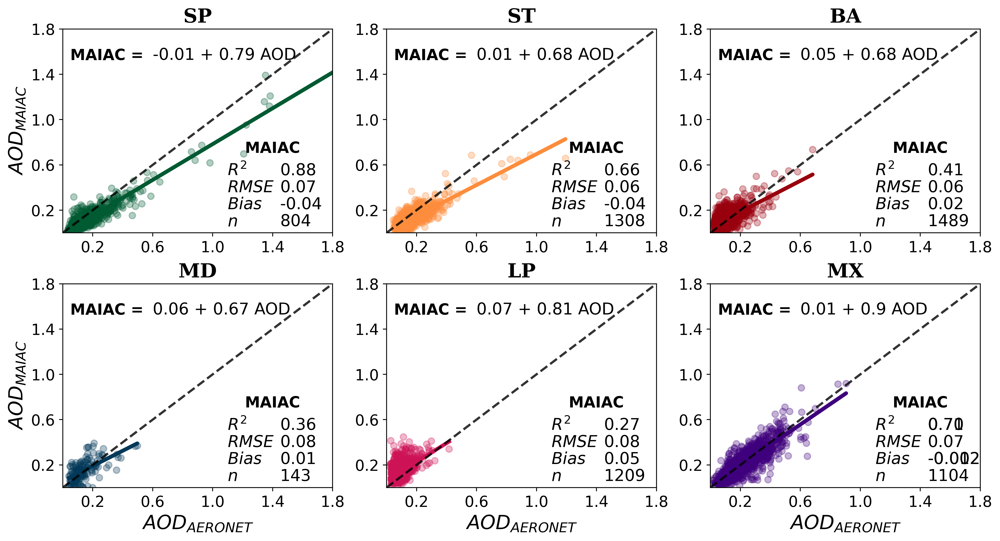

In [4]:

# TOTAL DATOS 1KM C6.1 version 01 diciembre 2023
color_maiac = ["#005a32","#fd8d3c","#99000d","#023858","#ce1256","#3f007d"] # CHILE "#fd8d3c"
resolucion_espaciotemporal = "1KM-60MIN-TOT"
dire = "D:/Josefina/paper_git/paper_maiac/datasets/V03/processed/merge_AER-MAIAC/Latam_C61/dia/1km/60mins"
# ante "D:/Josefina/paper_git/paper_maiac/datasets/V02/processed/Latam_C61/tot/1km/"
linear_regression_plot (resolucion_espaciotemporal = resolucion_espaciotemporal, path=dire,date_format='%d/%m/%Y',nrows=2,ncols=3,color_maiac =color_maiac ,plot='LALAL')

### Regresion lineal versiones MAIAC

In [25]:
#### Comparativa por buffer


def linear_regression_Versiones (path, date_format,nrows,ncols, plot, resolucion_espaciotemporal,color_maiac_61,color_maiac_60,edge_color_maiac_60,edge_color_maiac_61):
    '''
    The function allows plotting the linear regression of each AERONET station.
    In addition, the main statistics and the linear regression equation are shown.
    The data of each station of interest is contained in a folder in .csv format previously processed.
    This function goes through the folder and takes each of these files to later make the plot of interest.

    Variables:
    - path : path to the folder where the files in .csv format are located
    - date_format: format of the date column of the file of interest. 
    For example: date_format='%Y-%m-%d %H:%M:%S'
    - nrows: number of rows the plot will have
    - ncols: number of columnas the plot will have
    - color palette for each  for stations MAIAC-MODIS For example: 
    color_modis = ["#74c476","#fed976","#fb6a4a", "#74a9cf","#df65b0","#807dba"]
    color_maiac = ["#005a32","#fd8d3c","#99000d","#023858","#ce1256","#3f007d"]
    '''
    i=0 
    j=0 


    fig, ax = plt.subplots(ncols=ncols,nrows=nrows,  figsize=(14,8),dpi=500)
    
    #fig.suptitle(resolucion_espaciotemporal, fontsize=16, fontweight='bold')
    #The folder where the files of each station are located is browsed.
    for p,files in enumerate(os.listdir(path)):
        print(p)
        N = len(os.listdir(path))
        data = pd.read_csv(os.path.join(path,files))
        station_name = files [2:4]
#data = pd.read_csv("D:/Josefina/paper_git/paper_maiac/datasets/V02/processed/merge_BUFFER/Latam_C61/3_BA-1km-MAIAC-AER_MEAN-TotBuff_c61.csv")
#print(data.columns)
        #date_format='%Y-%m-%d'
        data["Timestamp"] = data["date"].apply(lambda x: datetime.strptime(x,date_format))
        #data["Timestamp"] = data["date"].apply(lambda x: datetime.strptime(x,date_format))
        #Becomes the index column
        data.set_index('Timestamp', inplace = True)
        data_mean_period_len =len(data.dropna(how='all'))
        # Station Name
        ########################                VARIABLES                ########################
        #Separates dataframe for na values
        df_60 = data[['date', 'AOD_550_maiac_mean_60', 'AOD_550_AER_mean_60']]
        y_maiac_60= df_60["AOD_550_maiac_mean_60"]
        x_aer_60 = df_60['AOD_550_AER_mean_60']
        ##
        df_61 = data[['date', 'AOD_550_maiac_mean_61', 'AOD_550_AER_mean_61']]
        y_maiac_61= df_61["AOD_550_maiac_mean_61"]
        x_aer_61 = df_61['AOD_550_AER_mean_61']
        #Mask for every dataset
        ##60
        mask_60 = ~np.isnan(x_aer_60) & ~np.isnan(y_maiac_60)
        x_aer_60 = x_aer_60[mask_60]
        y_maiac_60 = y_maiac_60[mask_60]

        ##61
        mask_61 = ~np.isnan(x_aer_61) & ~np.isnan(y_maiac_61)
        x_aer_61 = x_aer_61[mask_61]
        y_maiac_61 = y_maiac_61[mask_61]
        
       
        # #numero de datos sin contar los NaNs
        n_60 = len(x_aer_60)
        n_61 = len(x_aer_61)
        #e, la ordenada al origen y el R2
        slope_maiac_60 , intercept_maiac_60 , r_maiac_60 , p_maiac_60 , stderr_maiac_60  = scipy.stats.linregress(x_aer_60 , y_maiac_60)
        slope_maiac_61 , intercept_maiac_61 , r_maiac_61 , p_maiac_61 , stderr_maiac_61  = scipy.stats.linregress(x_aer_61 , y_maiac_61)
               
        # R2
        R2_maiac_60 =r_maiac_60*r_maiac_60
        R2_maiac_61 =r_maiac_61*r_maiac_61
        

        #Calculo RMSE
        RMSE_maiac_60= mean_squared_error(y_maiac_60, x_aer_60, squared = False)
        RMSE_maiac_61 = mean_squared_error(y_maiac_61, x_aer_61, squared = False)

        
        RMSE_maiac_normalize_60 = round(RMSE_maiac_60/(x_aer_60.mean()),3)
        RMSE_maiac_normalize_61 = round(RMSE_maiac_61/(x_aer_61.mean()),3)



        #Bias
        bias_maiac_60 = round(( sum(y_maiac_60 - x_aer_60)/n_60),3)
        bias_maiac_61 = round(( sum(y_maiac_61 - x_aer_61)/n_61),3)

        

        ########################                PREDICT                ########################
        
        # #y_maiac_p= data["AOD_550_maiac_mean"].values.reshape(-1,1)
        y_maiac_p_60 = y_maiac_60.values.reshape(-1,1)
        x_p_60 = x_aer_60.values.reshape(-1,1)
        ##
        y_maiac_p_61= y_maiac_61.values.reshape(-1,1)
        x_p_61 = x_aer_61.values.reshape(-1,1)
        

        ######
        linear_regresion_maiac_60 = LinearRegression()
        linear_regresion_maiac_60.fit(x_p_60,y_maiac_p_60)
        li_predict_maiac_60= linear_regresion_maiac_60.predict(x_p_60)
        ##
        linear_regresion_maiac_61 = LinearRegression()
        linear_regresion_maiac_61.fit(x_p_61,y_maiac_p_61)
        li_predict_maiac_61 = linear_regresion_maiac_61.predict(x_p_61)
        ##


        #### 
        #fig.suptitle(resolucion_espaciotemporal, fontsize=16, fontweight='bold')
         ########################                PLOT                ########################
                # Figure
                #Scatter plot Unit vs Ref

        
        ax[i][j].plot(x_p_60,li_predict_maiac_60,c=color_maiac_60[p],linestyle="-",linewidth=3)#azul
        ax[i][j].plot(x_p_61,li_predict_maiac_61,c=color_maiac_61[p],linestyle="-",linewidth=3)#verde
        ax[i][j].scatter(x_p_60, y_maiac_p_60,  c=color_maiac_60[p],edgecolors=edge_color_maiac_60[p] ,alpha=0.5,  s=35,label="C6.0")
        #
        ax[i][j].scatter(x_p_60, y_maiac_p_61,  c=color_maiac_61[p] ,edgecolors=edge_color_maiac_61[p] ,alpha=0.5,  s=35,label="C6.1")

        ax[i][j].set_xlim(0, 1.8)
        ax[i][j].set_ylim(0, 1.8)
        ax[i][j].yaxis.set_ticks(np.arange(0.2, 1.85, 0.4))
        ax[i][j].xaxis.set_ticks(np.arange(0.2, 1.85, 0.4))
       
         
#ax[i][j].text(0.05, 1.6, "C6.0 =" , fontsize=9, ha="left", va="bottom", fontweight = "bold")
#         ax[i][j].text(0.05, 1.45, "C6.1 =", fontsize=9, ha="left", va="bottom",fontweight = "bold")
#         ax[i][j].text(0.35, 1.6, (str(round (intercept_maiac_60,2)) + " + "+ str(round (slope_maiac_60,2)) + " AOD") , fontsize=9, ha="left", va="bottom")#, bbox=dict(boxstyle="round", fc=(1.0, 0.99, 0.99)))
#         ax[i][j].text(0.35, 1.45, (str(round (intercept_maiac_61,2)) + " + "+ str(round (slope_maiac_61,2))+ " AOD") , fontsize=9, ha="left", va="bottom")#, bbox=dict(boxstyle="round", fc=(1.0, 0.99, 0.99)))
#                 # Statistics by station
#         ax[i][j].text(1.38, 0.68, "C6.0" , fontsize=10, ha="center", va="bottom", fontweight = "bold")
#         ax[i][j].text(1.65, 0.68, "C6.1" , fontsize=10, ha="center", va="bottom",fontweight = "bold")
#         ax[i][j].text(1, 0.55, r'$R^{2}$ ', fontsize=10, ha="left", va="center")
#         ax[i][j].text(1, 0.40, r'$RMSE$ ',fontsize=10,ha="left", va="center")
#         ax[i][j].text(1, 0.25, r'$Bias$', fontsize=10,ha="left", va="center")
#         ax[i][j].text(1, 0.1, r'$n$    ', fontsize=10,ha="left", va="center")



        ax[i][j].text(0.03, 1.6, "C6.0 =" , fontsize=15, ha="left", va="bottom", fontweight = "bold")
        ax[i][j].text(0.03, 1.40, "C6.1 =", fontsize=15, ha="left", va="bottom",fontweight = "bold")
        ax[i][j].text(0.42, 1.6, (str(round (intercept_maiac_60,2)) + " + "+ str(round (slope_maiac_60,2)) + " AOD") , fontsize=15, ha="left", va="bottom")#, bbox=dict(boxstyle="round", fc=(1.0, 0.99, 0.99)))
        ax[i][j].text(0.42, 1.40, (str(round (intercept_maiac_61,2)) + " + "+ str(round (slope_maiac_61,2))+ " AOD") , fontsize=15, ha="left", va="bottom")#, bbox=dict(boxstyle="round", fc=(1.0, 0.99, 0.99)))
                # Statistics by station
        ax[i][j].text(1.27, 0.68, "C6.0" , fontsize=15, ha="center", va="bottom", fontweight = "bold")
        ax[i][j].text(1.60, 0.68, "C6.1" , fontsize=15, ha="center", va="bottom",fontweight = "bold")
        ax[i][j].text(0.82, 0.55, r'$R^{2}$ ', fontsize=15, ha="left", va="center")
        ax[i][j].text(0.82, 0.40, r'$RMSE$ ',fontsize=15,ha="left", va="center")
        ax[i][j].text(0.82, 0.25, r'$Bias$', fontsize=15,ha="left", va="center")
        ax[i][j].text(0.82, 0.1, r'$n$    ', fontsize=15,ha="left", va="center")

        #Statistics by station for MODIS
#         ax[i][j].text(1.3, 0.55,(round(R2_maiac_60,2)) , fontsize=10, ha="left", va="center")
#         ax[i][j].text(1.30, 0.40,  (round(RMSE_maiac_60,2)) , fontsize=10,ha="left", va="center")
#         ax[i][j].text(1.30, 0.25, (round(bias_maiac_60,2)) , fontsize=10,ha="left", va="center")#,
#         ax[i][j].text(1.30, 0.1, n_60 , fontsize=10,ha="left", va="center")

        # Statistics by station for  MAIAC
#         ax[i][j].text(1.55, 0.55,(round(R2_maiac_61,2)) , fontsize=10, ha="left", va="center")
#         ax[i][j].text(1.55, 0.40,   (round(RMSE_maiac_61,2)) , fontsize=10,ha="left", va="center")
#         ax[i][j].text(1.55, 0.25,  (round(bias_maiac_61,2)), fontsize=10,ha="left", va="center")#,
#         ax[i][j].text(1.55, 0.1,  n_61 , fontsize=10,ha="left", va="center")

#Statistics by station for MODIS
        ax[i][j].text(1.15, 0.55,(round(R2_maiac_60,2)) , fontsize=15, ha="left", va="center")
        ax[i][j].text(1.15, 0.40,  (round(RMSE_maiac_60,2)) , fontsize=15,ha="left", va="center")
        ax[i][j].text(1.15, 0.25, (round(bias_maiac_60,2)) , fontsize=15,ha="left", va="center")#,
        ax[i][j].text(1.15, 0.1, n_60 , fontsize=15,ha="left", va="center")
        
        # Statistics by station for  MAIAC
        ax[i][j].text(1.50, 0.55,(round(R2_maiac_61,2)) , fontsize=15, ha="left", va="center")
        ax[i][j].text(1.50, 0.40,   (round(RMSE_maiac_61,2)) , fontsize=15,ha="left", va="center")
        ax[i][j].text(1.50, 0.25,  (round(bias_maiac_61,2)), fontsize=15,ha="left", va="center")#,
        ax[i][j].text(1.50, 0.1,  n_61 , fontsize=15,ha="left", va="center")
        
        
        
        
        
        #Title of each subplot corresponds to the name of the AERONET station.
        ax[i][j].set_title(station_name,fontsize=18,fontdict={'family': 'serif', 
            'color' : 'Black',
            'weight': 'bold',
            'size': 20})
         # Tittle legend
       # tittle_legend = ["MODIS","MAIAC"]
        #ax[i][j].legend(frameon = False, markerfirst = False, fontsize = 10,loc='upper right')
        # Axes names
        ax[0][0].set_xlabel(r'',size=10)
        ax[0][1].set_xlabel(r'',size=10)
        ax[0][2].set_xlabel(r'',size=10)
        ax[1][0].set_xlabel(r'$AOD_{AERONET}$',size=18)
        ax[1][1].set_xlabel(r'$AOD_{AERONET}$',size=18)
        ax[1][2].set_xlabel(r'$AOD_{AERONET}$',size=18)
        
        
        ax[0][0].set_ylabel(r'$AOD_{SATELLITE}$',size=18)
        ax[0][1].set_ylabel(r'',size=17)
        ax[0][2].set_ylabel(r'',size=17)
        ax[1][0].set_ylabel(r'$AOD_{SATELLITE}$',size=18)
        ax[1][1].set_ylabel(r'',size=17)
        ax[1][2].set_ylabel(r'',size=17)
        
        print(f'{station_name} ==> R C60 =  {round(r_maiac_60,3)}, R C61 =  {round(r_maiac_61,3)}')
        


        
#         plt.subplots_adjust(left=0.125,
#                     bottom=0.1, 
#                     right=0.9, 
#                     top=0.9, 
#                     wspace=0.2, 
#                     hspace=0.4)
        plt.subplots_adjust(left=0.01,#0.125,
                            bottom=0.01,#0.1, 
                            right=0.99,#0.9, 
                            top=0.99,#0.9, 
                            wspace=0.2, 
                            hspace=0.25)#0.4)
        #ax[i][j].legend(frameon = True, markerfirst = False, fontsize = 10,loc='upper right')
        #ax[i][j].legend(bbox_to_anchor=(0.85, 1.03), loc='upper right', frameon=True, markerfirst=False, fontsize=10)
        ax[i][j].legend(frameon=True, 
                      markerfirst=True, 
                      fontsize=14, 
                      loc='upper right', 
                      borderpad=0.2,  # Reduce el tamaño del recuadro
                      borderaxespad=0.22)

                #Linea 1:1:
        x_linea11 = np.linspace(0, 5,10)  # Genera 100 puntos entre 0 y 10
        y_linea11 = x_linea11
        ax[i][j].plot(x_linea11,y_linea11,c="#636363",linestyle="--",linewidth=1.3)#azul
        ax[i][j].tick_params(axis='both', which='major', labelsize=14)  
        
        
        ax[0][1].text(1.50, 0.55,("0.70") , fontsize=15, ha="left", va="center")
        ax[1][1].text(1.50, 0.55,("0.30") , fontsize=15, ha="left", va="center")
        ax[1][2].text(1.15, 0.55,("0.60") , fontsize=15, ha="left", va="center")
        # Location of data in each subplot
        if j == ncols-1:
            i = i+1
            j = 0
        else:
            j = j+1
   # Save the plot to the current path
    if plot == 'save':
        return(plt.savefig("D:/Josefina/Congresos/EGU_2024/plots_02/linear_regression_plot_EU.jpg", dpi=500))
    else:
        return(plt.show())


0
SP ==> R C60 =  0.909, R C61 =  0.913
1
ST ==> R C60 =  0.81, R C61 =  0.835
2
BA ==> R C60 =  0.626, R C61 =  0.62
3
MD ==> R C60 =  0.718, R C61 =  0.581
4
LP ==> R C60 =  0.568, R C61 =  0.544
5
MX ==> R C60 =  0.777, R C61 =  0.832


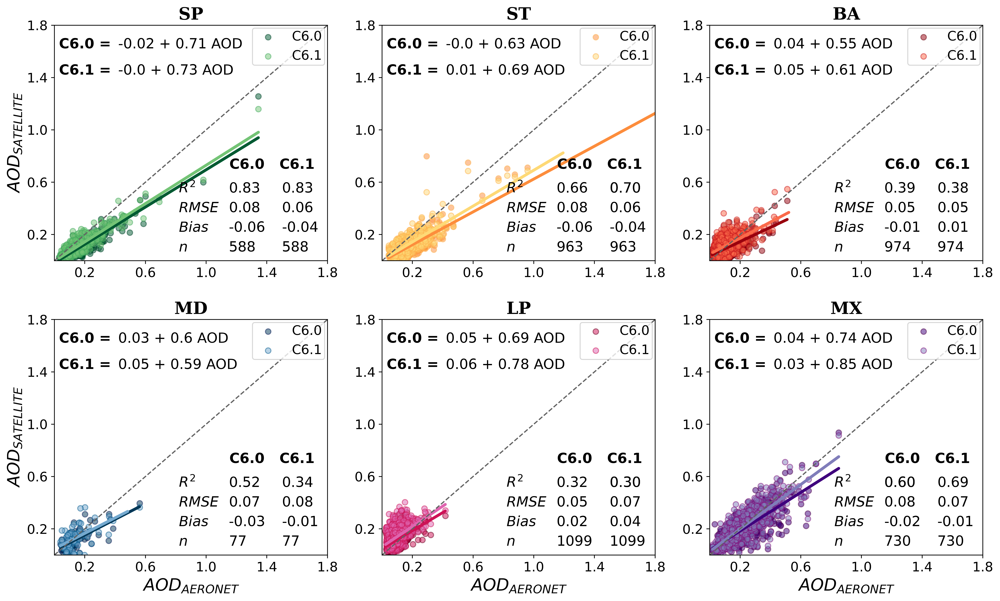

In [26]:
# Regrsion lineal C6
date_format='%d/%m/%Y'
nrows=2
ncols=3
plot='no'
### "Comparativa buffer 30min - Dia"
color_maiac_61 = ["#74c476","#fed976","#fb6a4a", "#74a9cf","#df65b0","#807dba"]
color_maiac_60 = ["#005a32","#fd8d3c","#99000d","#023858","#ce1256","#3f007d"] # CHILE "#fd8d3c"
edge_color_maiac_60 = ["#004529", "#feb24c","#67000d","#081d58","#67001f","#4d004b"]
edge_color_maiac_61 = ["#41ab5d","#feb24c","#cb181d","#045a8d","#ce1256","#810f7c"]
#resolucion_espaciotemporal = "Comparativa Collection 60min-1km - Dia Latam"
resolucion_espaciotemporal = ""
dir_path_latam ="D:/Josefina/paper_git/paper_maiac/datasets/V02/processed/merge_C60C61/Latam"
regresion = linear_regression_Versiones (resolucion_espaciotemporal = resolucion_espaciotemporal, path=dir_path_latam,date_format=date_format,nrows=nrows,ncols=ncols,plot=plot,color_maiac_61=color_maiac_61,color_maiac_60=color_maiac_60,edge_color_maiac_60=edge_color_maiac_60,edge_color_maiac_61=edge_color_maiac_61)


In [6]:
#### Comparativa por buffer


def linear_regression_plot_ModisMaiac (path, date_format,nrows,ncols, plot, resolucion_espaciotemporal,color_maiac_61,color_maiac_60,edge_color_maiac_60,edge_color_maiac_61):
    '''
    The function allows plotting the linear regression of each AERONET station.
    In addition, the main statistics and the linear regression equation are shown.
    The data of each station of interest is contained in a folder in .csv format previously processed.
    This function goes through the folder and takes each of these files to later make the plot of interest.

    Variables:
    - path : path to the folder where the files in .csv format are located
    - date_format: format of the date column of the file of interest. 
    For example: date_format='%Y-%m-%d %H:%M:%S'
    - nrows: number of rows the plot will have
    - ncols: number of columnas the plot will have
    - color palette for each  for stations MAIAC-MODIS For example: 
    color_modis = ["#74c476","#fed976","#fb6a4a", "#74a9cf","#df65b0","#807dba"]
    color_maiac = ["#005a32","#fd8d3c","#99000d","#023858","#ce1256","#3f007d"]
    '''
    i=0 
    j=0 


    fig, ax = plt.subplots(ncols=ncols,nrows=nrows,  figsize=(14,8),dpi=500)
    fig.suptitle(resolucion_espaciotemporal, fontsize=16, fontweight='bold')
    #The folder where the files of each station are located is browsed.
    for p,files in enumerate(os.listdir(path)):
        print(p)
        N = len(os.listdir(path))
        data = pd.read_csv(os.path.join(path,files))
        station_name = files [2:4]
#data = pd.read_csv("D:/Josefina/paper_git/paper_maiac/datasets/V02/processed/merge_BUFFER/Latam_C61/3_BA-1km-MAIAC-AER_MEAN-TotBuff_c61.csv")
#print(data.columns)
        #date_format='%Y-%m-%d'
        data["Timestamp"] = data["date"].apply(lambda x: datetime.strptime(x,date_format))
        #data["Timestamp"] = data["date"].apply(lambda x: datetime.strptime(x,date_format))
        #Becomes the index column
        data.set_index('Timestamp', inplace = True)
        data_mean_period_len =len(data.dropna(how='all'))
        # Station Name
        ########################                VARIABLES                ########################
        #########################     DF_60 MODIS         DF_61 MAIAC
        #Separates dataframe for na values
        df_60 = data[['date', 'AOD_modis', 'AOD_modis_AER']]
        y_maiac_60= df_60["AOD_modis"]
        x_aer_60 = df_60['AOD_modis_AER']
        ##
        df_61 = data[['date', 'AOD_maiac', 'AOD_maiac_AER']]
        y_maiac_61= df_61["AOD_maiac"]
        x_aer_61 = df_61['AOD_maiac_AER']
        #Mask for every dataset
        ##60
        mask_60 = ~np.isnan(x_aer_60) & ~np.isnan(y_maiac_60)
        x_aer_60 = x_aer_60[mask_60]
        y_maiac_60 = y_maiac_60[mask_60]

        ##61
        mask_61 = ~np.isnan(x_aer_61) & ~np.isnan(y_maiac_61)
        x_aer_61 = x_aer_61[mask_61]
        y_maiac_61 = y_maiac_61[mask_61]
        
       
        # #numero de datos sin contar los NaNs
        n_60 = len(x_aer_60)
        n_61 = len(x_aer_61)
        #e, la ordenada al origen y el R2
        slope_maiac_60 , intercept_maiac_60 , r_maiac_60 , p_maiac_60 , stderr_maiac_60  = scipy.stats.linregress(x_aer_60 , y_maiac_60)
        slope_maiac_61 , intercept_maiac_61 , r_maiac_61 , p_maiac_61 , stderr_maiac_61  = scipy.stats.linregress(x_aer_61 , y_maiac_61)
               
        # R2
        R2_maiac_60 =r_maiac_60*r_maiac_60
        R2_maiac_61 =r_maiac_61*r_maiac_61


        #Calculo RMSE
        RMSE_maiac_60= mean_squared_error(y_maiac_60, x_aer_60, squared = False)
        RMSE_maiac_61 = mean_squared_error(y_maiac_61, x_aer_61, squared = False)

        
        RMSE_maiac_normalize_60 = round(RMSE_maiac_60/(x_aer_60.mean()),3)
        RMSE_maiac_normalize_61 = round(RMSE_maiac_61/(x_aer_61.mean()),3)



        #Bias
        bias_maiac_60 = round(( sum(y_maiac_60 - x_aer_60)/n_60),3)
        bias_maiac_61 = round(( sum(y_maiac_61 - x_aer_61)/n_61),3)

        

        ########################                PREDICT                ########################
        
        # #y_maiac_p= data["AOD_550_maiac_mean"].values.reshape(-1,1)
        y_maiac_p_60 = y_maiac_60.values.reshape(-1,1)
        x_p_60 = x_aer_60.values.reshape(-1,1)
        ##
        y_maiac_p_61= y_maiac_61.values.reshape(-1,1)
        x_p_61 = x_aer_61.values.reshape(-1,1)


        ######
        linear_regresion_maiac_60 = LinearRegression()
        linear_regresion_maiac_60.fit(x_p_60,y_maiac_p_60)
        li_predict_maiac_60= linear_regresion_maiac_60.predict(x_p_60)
        ##
        linear_regresion_maiac_61 = LinearRegression()
        linear_regresion_maiac_61.fit(x_p_61,y_maiac_p_61)
        li_predict_maiac_61 = linear_regresion_maiac_61.predict(x_p_61)
        ##


        #### 
        #fig.suptitle(resolucion_espaciotemporal, fontsize=16, fontweight='bold')
         ########################                PLOT                ########################
                # Figure
                #Scatter plot Unit vs Ref

        
        ax[i][j].plot(x_p_60,li_predict_maiac_60,c=color_maiac_60[p],linestyle="-",linewidth=3.5)#azul
        ax[i][j].plot(x_p_61,li_predict_maiac_61,c=color_maiac_61[p],linestyle="-",linewidth=3.5)#verde
        ax[i][j].scatter(x_p_60, y_maiac_p_60,  c=color_maiac_60[p],edgecolors=edge_color_maiac_60[p] ,alpha=0.5,  s=35,label="MODIS")
        #
        ax[i][j].scatter(x_p_60, y_maiac_p_61,  c=color_maiac_61[p] ,edgecolors=edge_color_maiac_61[p] ,alpha=0.5,  s=35,label="MAIAC")

        ax[i][j].set_xlim(0, 1.8)
        ax[i][j].set_ylim(0, 1.8)
        ax[i][j].yaxis.set_ticks(np.arange(0.2, 1.85, 0.4))
        ax[i][j].xaxis.set_ticks(np.arange(0.2, 1.85, 0.4))
       
        ax[i][j].text(0.03, 1.6, "MODIS =" , fontsize=14, ha="left", va="bottom", fontweight = "bold")
        ax[i][j].text(0.03, 1.45, "MAIAC =", fontsize=14, ha="left", va="bottom",fontweight = "bold")
        ax[i][j].text(0.50, 1.6, (str(round (intercept_maiac_60,2)) + " + "+ str(round (slope_maiac_60,2)) + " AOD") , fontsize=14, ha="left", va="bottom")#, bbox=dict(boxstyle="round", fc=(1.0, 0.99, 0.99)))
        ax[i][j].text(0.50, 1.45, (str(round (intercept_maiac_61,2)) + " + "+ str(round (slope_maiac_61,2))+ " AOD") , fontsize=14, ha="left", va="bottom")#, bbox=dict(boxstyle="round", fc=(1.0, 0.99, 0.99)))
                # Statistics by station
        ax[i][j].text(1.27, 0.68, "MODIS" , fontsize=13, ha="center", va="bottom", fontweight = "bold")
        ax[i][j].text(1.60, 0.68, "MAIAC" , fontsize=13, ha="center", va="bottom",fontweight = "bold")
        ax[i][j].text(0.85, 0.55, r'$R^{2}$ ', fontsize=15, ha="left", va="center")
        ax[i][j].text(0.85, 0.40, r'$RMSE$ ',fontsize=15,ha="left", va="center")
        ax[i][j].text(0.85, 0.25, r'$Bias$', fontsize=15,ha="left", va="center")
        ax[i][j].text(0.85, 0.1, r'$n$    ', fontsize=15,ha="left", va="center")

        #Statistics by station for MODIS
        ax[i][j].text(1.15, 0.55,(round(R2_maiac_60,2)) , fontsize=15, ha="left", va="center")
        ax[i][j].text(1.15, 0.40,  (round(RMSE_maiac_60,2)) , fontsize=15,ha="left", va="center")
        ax[i][j].text(1.15, 0.25, (round(bias_maiac_60,2)) , fontsize=15,ha="left", va="center")#,
        ax[i][j].text(1.15, 0.1, n_60 , fontsize=15,ha="left", va="center")

        # Statistics by station for  MAIAC
        ax[i][j].text(1.50, 0.55,(round(R2_maiac_61,2)) , fontsize=15, ha="left", va="center")
        ax[i][j].text(1.50, 0.40,   (round(RMSE_maiac_61,2)) , fontsize=15,ha="left", va="center")
        ax[i][j].text(1.50, 0.25,  (round(bias_maiac_61,2)), fontsize=15,ha="left", va="center")#,
        ax[i][j].text(1.50, 0.1,  n_61 , fontsize=15,ha="left", va="center")
        
        #Title of each subplot corresponds to the name of the AERONET station.
        ax[i][j].set_title(station_name,fontsize=18,fontdict={'family': 'serif', 
            'color' : 'Black',
            'weight': 'bold',
            'size': 20})
         # Tittle legend
       # tittle_legend = ["MODIS","MAIAC"]
        #ax[i][j].legend(frameon = False, markerfirst = False, fontsize = 10,loc='upper right')
        # Axes names
        ax[0][0].set_xlabel(r'',size=12)
        ax[0][1].set_xlabel(r'',size=12)
        ax[0][2].set_xlabel(r'',size=12)
        ax[1][0].set_xlabel(r'$AOD_{AERONET}$',size=18)
        ax[1][1].set_xlabel(r'$AOD_{AERONET}$',size=18)
        ax[1][2].set_xlabel(r'$AOD_{AERONET}$',size=18)
        
        
        ax[0][1].set_ylabel(r'$AOD_{SATELLITE}$',size=18)
        ax[0][1].set_ylabel(r'',size=17)
        ax[0][2].set_ylabel(r'',size=17)
        ax[1][0].set_ylabel(r'$AOD_{SATELLITE}$',size=18)
        ax[1][1].set_ylabel(r'',size=17)
        ax[1][2].set_ylabel(r'',size=17)
        
            
        


        
        plt.subplots_adjust(left=0.01,#0.125,
                    bottom=0.01,#0.1, 
                    right=0.99,#0.9, 
                    top=0.99,#0.9, 
                    wspace=0.2, 
                    hspace=0.25)#0.4)
        #ax[i][j].legend(frameon = True, markerfirst = True, fontsize = 13,loc='upper right')
        ax[i][j].legend(frameon=True, 
              markerfirst=True, 
              fontsize=13, 
              loc='upper right', 
              borderpad=0.2,  # Reduce el tamaño del recuadro
              borderaxespad=0.22)  # Ajusta el espacio entre la leyenda y el gráfico
        #ax[i][j].legend(bbox_to_anchor=(0.85, 1.03), loc='upper right', frameon=True, markerfirst=False, fontsize=10)

        print(f'{station_name} ==> MODIS =  {round(R2_maiac_60,3)}, R MAIAC =  {round(R2_maiac_61,3)}')
                #Linea 1:1:
        x_linea11 = np.linspace(0, 5,10)  # Genera 100 puntos entre 0 y 10
        y_linea11 = x_linea11
        ax[i][j].plot(x_linea11,y_linea11,c="#636363",linestyle="--",linewidth=1.3)#azul
#         ax[0][0].text(1.15, 0.55,("0.85") , fontsize=14, ha="left", va="center")
#         ax[1][0].text(1.50, 0.55,("0.50") , fontsize=14, ha="left", va="center")
#         ax[1][0].text(1.15, 0.40,  ("0.10") , fontsize=14,ha="left", va="center")
#         ax[1][1].text(1.15, 0.40,  ("0.10") , fontsize=14,ha="left", va="center")
        ax[i][j].tick_params(axis='both', which='major', labelsize=14)  
        ax[0][0].text(1.15, 0.55,("0.85") , fontsize=15, ha="left", va="center")
        ax[1][0].text(1.15, 0.40,  ("0.10") , fontsize=15,ha="left", va="center")
        ax[1][1].text(1.15, 0.40,  ("0.10") , fontsize=15,ha="left", va="center")
        ax[1][0].text(1.50, 0.55,("0.50") , fontsize=15, ha="left", va="center")
        # Location of data in each subplot
        if j == ncols-1:
            i = i+1
            j = 0
        else:
            j = j+1
   # Save the plot to the current path
    if plot == 'save':
        return(plt.savefig("D:/Josefina/Congresos/EGU_2024/plots_02/linear_regression_plot_EU.jpg", dpi=500))
    else:
        return(plt.show())

FileNotFoundError: [WinError 3] El sistema no puede encontrar la ruta especificada: 'D:/Josefina/paper_git/paper_maiac/datasets/V03/processed/merge_AER-MAIAC-MODIS/Latam_C61'

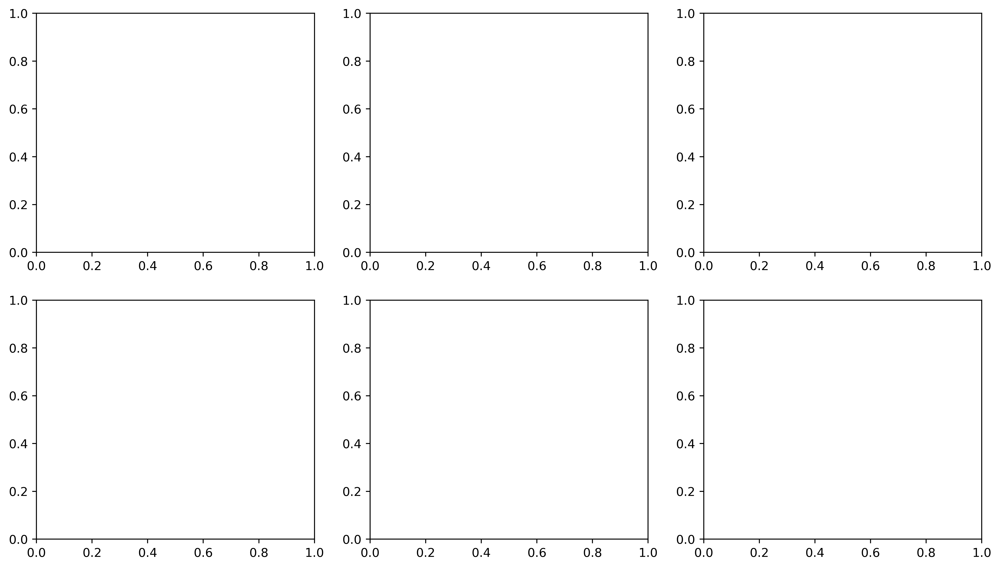

In [7]:


# Regrsion lineal C6
#date_format='%d/%m/%Y'
date_format='%Y-%m-%d'
nrows=2
ncols=3
plot='not'
### "Comparativa buffer 30min - Dia"

# edge_color_maiac_60 =["#238b45","#ae017e","#3f007d","#023858","#662506","#7f0000"]#######
# color_maiac_60 = ["#238b45","#ae017e","#54278f","#023858","#cc4c02","#b30000"]#########"

# edge_color_maiac_61 = ["#00441b","#dd3497","#807dba","#045a8d","#ec7014","#ef6548"]
# color_maiac_61 = ["#99d8c9","#f768a1","#bcbddc", "#a6bddb","#fec44f","#fc8d59"]





edge_color_maiac_60 =["#238b45","#fe9929","#7f0000","#023858","#ae017e","#3f007d"]#######
color_maiac_60 = ["#238b45","#cc4c02","#b30000","#023858","#ae017e","#54278f"]#########"

edge_color_maiac_61 = ["#00441b","#ec7014","#ef6548","#045a8d","#dd3497","#807dba"]
color_maiac_61 = ["#99d8c9","#fec44f","#fc8d59", "#a6bddb","#f768a1","#bcbddc"]






colors =["#99d8c9","#fa9fb5","#a6bddb","#756bb1","#fec44f","#fc9272"]
#resolucion_espaciotemporal = "Collection 60min-1km  USA"
resolucion_espaciotemporal = ""
dir_path_latam ="D:/Josefina/paper_git/paper_maiac/datasets/V03/processed/merge_AER-MAIAC-MODIS/Latam_C61"
regresion = linear_regression_plot_ModisMaiac (resolucion_espaciotemporal = resolucion_espaciotemporal, path=dir_path_latam,date_format=date_format,nrows=nrows,ncols=ncols,plot=plot,color_maiac_61=color_maiac_61,color_maiac_60=color_maiac_60,edge_color_maiac_60=edge_color_maiac_60,edge_color_maiac_61=edge_color_maiac_61)


In [5]:
def aeronet_histogram(path, date_format, nrows, ncols, colors, plot): 
    '''
    This function generates histograms of AOD values for each AERONET station.

    Variables:
    - path : Path to the folder where the CSV files are located.
    - date_format: Format of the date column in the CSV files.
    - nrows: Number of rows in the plot grid.
    - ncols: Number of columns in the plot grid.
    - colors: List of colors for each AERONET station.
    - plot: 'save' to save the plot as an image, otherwise the plot will be displayed.
    '''

    i, j = 0, 0
    fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(14, 8), dpi=500)

    for p, file in enumerate(os.listdir(path)):
        data = pd.read_csv(os.path.join(path, file))
        data["Timestamp"] = data["date"].apply(lambda x: datetime.strptime(x, date_format))
        data.set_index('Timestamp', inplace=True)
        
        # Seleccionamos los valores de AOD para el periódo de interés
        aod_values = data['aod_550']['2015-01-01':'2022-12-31'].dropna()
        aod_values = aod_values.resample('1D').mean()

        # Calculamos las métricas
        mean = aod_values.mean()
        std_dev = aod_values.std()
        data_count = len(aod_values)

        # Nombre de la estación
        station_name = file[2:4]

        ######################## PLOT ########################
        # Histograma
        ax[i][j].hist(aod_values, bins=20, color=colors[p], edgecolor='black', alpha=0.7, density=False)

        # Ajustes de los ejes
        ax[i][j].set_xlim(0, 1.6)
        ax[i][j].set_ylim(0, 850)

        # Mostramos las métricas en el gráfico
        ax[i][j].text(0.55, 0.9, f"Mean = {mean:.2f}", transform=ax[i][j].transAxes, fontsize=13)
        ax[i][j].text(0.55, 0.8, f"SD = {std_dev:.2f}", transform=ax[i][j].transAxes, fontsize=13)
#         ax[i][j].text(0.56, 0.7, f"n = {data_count}", transform=ax[i][j].transAxes, fontsize=13)
        
        ax[1][1].text(0.53, 0.7, f" MS = 11.37%", transform=ax[1][1].transAxes, fontsize=13) #LP
        ax[0][2].text(0.53, 0.7, f" MS = 12.97%", transform=ax[0][2].transAxes, fontsize=13) #BA
        ax[1][2].text(0.53, 0.7, f" MS = 12.59%", transform=ax[1][2].transAxes, fontsize=13) #MX
        ax[0][1].text(0.53, 0.7, f" MS = 13.03%", transform=ax[0][1].transAxes, fontsize=13)# ST
        ax[0][0].text(0.53, 0.7, f" MS = 15.32%", transform=ax[0][0].transAxes, fontsize=13) #SP
        ax[1][0].text(0.53, 0.7, f" MS = 48.50%", transform=ax[1][0].transAxes, fontsize=13) #MD
        
        
# dias disponible n / dias dispinbles / dias faltantes        
#         LP  2210/2922 75.63 /24.37
# BA 1652/2922 56.53 / 43.47
# MX 1664/2992 55.62 / 44.38
# ST 1374/2922 47.02 / 52.98
# SP  1331/2922 45.55 / 54.45
# MD  893/2922 30.56 /69.44
        # Títulos y etiquetas
        ax[i][j].set_title(station_name, fontsize=18, fontweight='bold')
        ax[i][j].set_xlabel(r'$AERONET_{AOD}$', fontsize=13)
        ax[i][j].set_ylabel('Frecuency', fontsize=13)

        # Ajuste del tamaño de los ticks
        ax[i][j].tick_params(axis='both', which='major', labelsize=12)

        # Actualizamos los índices de los subplots
        if j == ncols - 1:
            i += 1
            j = 0
        else:
            j += 1

    # Ajustamos el diseño del subplot
    plt.subplots_adjust(left=0.1, bottom=0.1, right=0.9, top=0.9, wspace=0.3, hspace=0.4)

    # Guardamos o mostramos el gráfico
    if plot == 'save':
        plt.savefig("aeronet_histogram.jpg", dpi=500)
    else:
        plt.show()


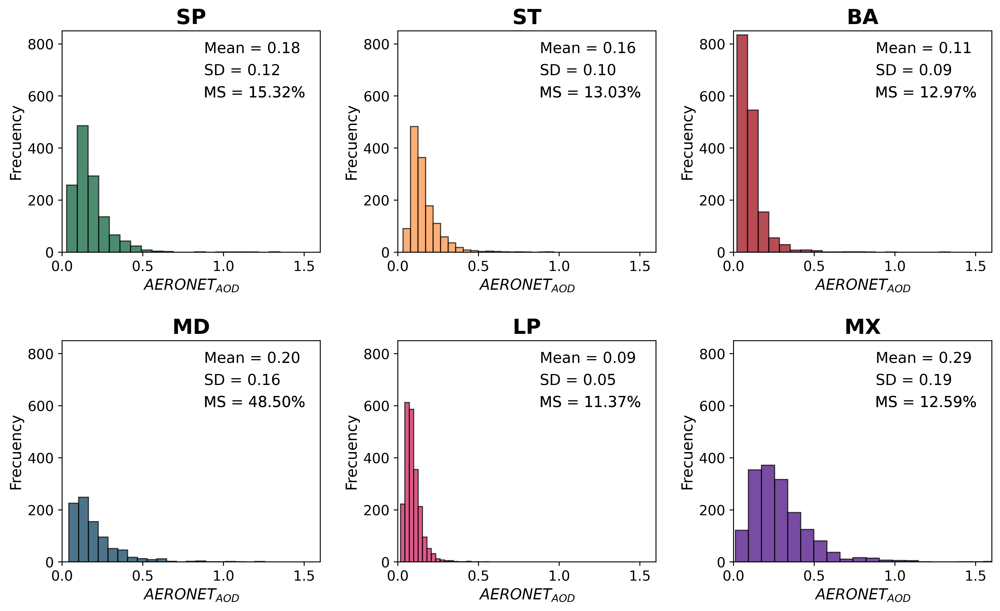

In [6]:
aeronet_histogram (path="D:/Josefina/paper_git/paper_maiac/datasets/V02/aeronet/datasets_interp_s_L02/Latam",date_format='%Y-%m-%d %H:%M:%S',nrows=2,ncols=3,colors = ["#005a32","#fd8d3c","#99000d","#023858","#ce1256","#3f007d","#c994c7"], plot='lala')


<ipython-input-5-c7dfdd40e4a2>:111: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


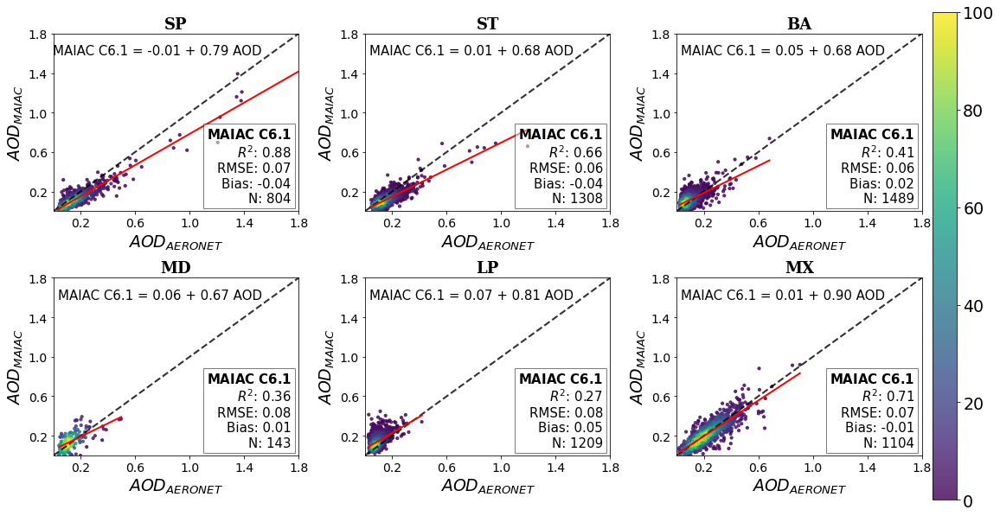

In [5]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy.stats import gaussian_kde
from matplotlib.colors import Normalize

def plot_series_3(resolucion_espaciotemporal, path, date_format, nrows, ncols, color_maiac, plot):
    files = [f for f in os.listdir(path) if f.endswith('.csv')]
    files.sort()
    
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(5*ncols, 4*nrows))
    axes = axes.flatten()
    
    # Crear un objeto Normalize para asegurar que la barra de colores esté entre 0 y 100
    norm = Normalize(vmin=0, vmax=100)

    for i, file in enumerate(files):
        if i >= len(axes):
            break
        
        df = pd.read_csv(os.path.join(path, file))
        df['date'] = pd.to_datetime(df['date'], format=date_format)
        df = df.sort_values(by='date')
        
        x = df["AOD_550_AER_mean"]
        y = df["AOD_550_maiac_mean"]
        
        # Calcular la densidad de puntos
        xy = np.vstack([x, y])
        z = gaussian_kde(xy)(xy)
        
        # Normalizar z para que esté en el rango de 0 a 100
#         z_normalized = np.clip(z, 0, 100)
        z_normalized = (z - z.min()) / (z.max() - z.min()) * 100
        ax = axes[i]
#         sc = ax.scatter(x, y, c=z_normalized, cmap='viridis', edgecolor='k', alpha=0.7, norm=norm)
        sc = ax.scatter(x, y, c=z_normalized, cmap='viridis',  alpha=0.8,  s=10)

        ax.plot([0, 1.8], [0,1.8], color='black', linewidth=2.1, alpha=0.8, linestyle = '--')
       

       
        ax.set_xlim([0, 1.8])
        ax.set_ylim([0, 1.8])
        ax.yaxis.set_ticks(np.arange(0.2, 1.85, 0.4))
        ax.xaxis.set_ticks(np.arange(0.2, 1.85, 0.4))
        ax.tick_params(axis='both', which='major', labelsize=14)
        ax.set_title(file[2:4],fontsize=18,fontdict={'family': 'serif', 
            'color' : 'Black',
            'weight': 'bold',
             'size': 24}) # ax.set_title(file)
        # Ajuste de regresión lineal
        slope, intercept = np.polyfit(x, y, 1)
#         sns.regplot(x=x, y=y, scatter=False, ax=ax, color='red', line_kws={'linewidth': 2})
        sns.regplot(x=x, y=y, scatter=False, ax=ax, color='red', line_kws={'linewidth': 2}, ci=None)

        # Mostrar pendiente y ordenada al origen
#         ax.text(0.5, 1.2, f'MAIC C6.1 = {intercept:.2f} + {slope:.2f} AOD', 
#                 fontsize=13, color='black', bbox=dict(facecolor='white', alpha=0.5), ha='right')

        n = len(x)
        r_squared = (np.corrcoef(x, y)[0, 1])* (np.corrcoef(x, y)[0, 1])
#         rmse = np.sqrt(np.mean((y - (slope * x + intercept))**2))
#         rmse = (np.mean((y - (slope * x + intercept))**2))
        rmse = mean_squared_error(y, x, squared = False)
        bias = round(( sum(y - x)/n),2)
        # Mostrar métricas estadísticas
#         ax.text(1.5, 0.1, f'MAIAC C6.1\n$R^{2}$: {r_squared:.2f}\nRMSE: {rmse:.2f}\nBias: {bias:.2f}\nN: {n:.0f}', 
#                 fontsize=13, color='black', bbox=dict(facecolor='white', alpha=0.5), ha='right')
#         ax.text(1.0, 0.15, 'MAIA C 6.1', fontsize=14, color='black', 
#                 bbox=dict(facecolor='white', alpha=0.5), ha='right', fontweight='bold')
#         ax.text(1.5, 0.1, f'$R^{2}$: {r_squared:.2f}\nRMSE: {rmse:.2f}\nBias: {bias:.2f}\nN: {n:.0f}', 
#                 fontsize=13, color='black', ha='right')

#         ax.text(1.0, 0.15, 'MAIA C 6.1', fontsize=14, color='black', ha='right', fontweight='bold')
        ax.annotate(f'MAIAC C6.1 = {intercept:.2f} + {slope:.2f} AOD',
            xy=(0.85, 0.88), xycoords='axes fraction',
            fontsize=15, color='black', ha='right')
        # Calcular métricas estadísticas
        ax.annotate(r'$\mathbf{MAIAC\ C6.1}$' + f'\n$R^{2}$: {r_squared:.2f}\nRMSE: {rmse:.2f}\nBias: {bias:.2f}\nN: {n:.0f}',
                    xy=(0.97, 0.05), xycoords='axes fraction', #(0.38, 0.53)
                    fontsize=15, color='black', bbox=dict(facecolor='white', alpha=0.5), ha='right')

        
        # Agregar la barra de color
        #cbar = fig.colorbar(sc, ax=ax)
#         cbar.set_label('Density')
#        ax.set_xlabel(r'$AOD_{AERONET}$',size=18)
#        ax.set_ylabel(r'$AOD_{MAIAC}$',size=18)


        ax.set_xlabel(r'$AOD_{AERONET}$',size=19)

        
        ax.set_ylabel(r'$AOD_{MAIAC}$',size=19)

        
        plt.subplots_adjust(left=0.08,#0.125,# Mueve los subplots más a la izquierda
                            bottom=0.01,#0.1, 
                            right=1.05,#0.9,  # Deja espacio para la barra de color
                            top=0.99,#0.9, 
                            wspace=0.01, 
                            hspace=0.01)#0.4)

    # Barra de color común para todos los subgráficos
#     fig.colorbar(sc, ax=axes, orientation='horizontal', fraction=0.02, pad=0.05)
    cbar = fig.colorbar(sc, ax=axes, orientation='vertical', fraction=0.05, pad=0.02)
    cbar.ax.tick_params(labelsize=19)
    plt.tight_layout()
    plt.show()


color_maiac = ["#005a32", "#fd8d3c", "#99000d", "#023858", "#ce1256", "#3f007d"]
resolucion_espaciotemporal = "1KM-60MIN-TOT"
# dire = "D:/Josefina/paper_git/paper_maiac/datasets/V02/processed/merge_AER-MAIAC/Latam_C61/dia/1km/1km60min_copy"
dire = "D:/Josefina/paper_git/paper_maiac/datasets/V03/processed/merge_AER-MAIAC/Latam_C61/dia/1km/60mins"
plot_series_3(resolucion_espaciotemporal=resolucion_espaciotemporal,
                                path=dire, date_format='%d/%m/%Y', nrows=2, ncols=3, 
                                color_maiac=color_maiac, plot='LALAL')

<ipython-input-3-892617b3f9ee>:111: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


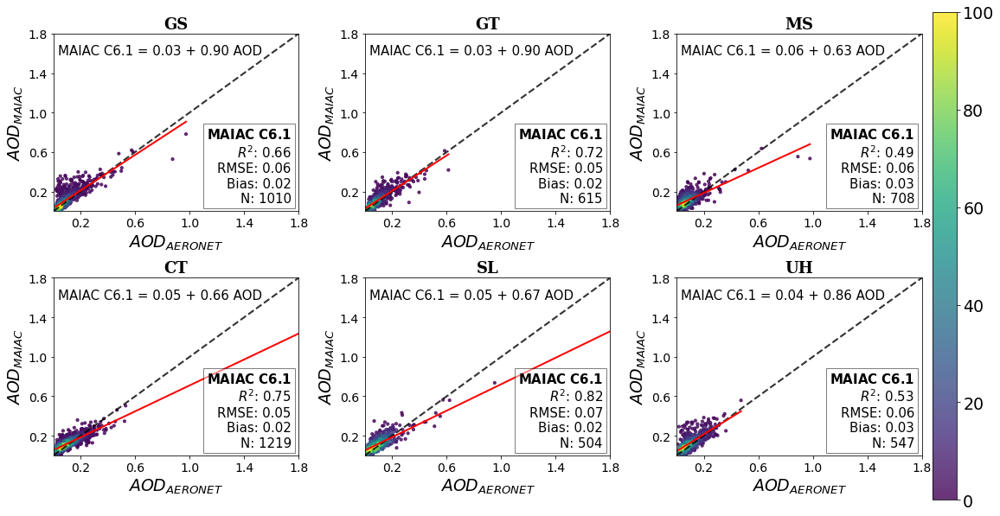

In [4]:
dire = "D:/Josefina/paper_git/paper_maiac/datasets/V02/processed/merge_BUFFER/USA_C61/horario/1km_v2/"

# dire = "D:/Josefina/paper_git/paper_maiac/datasets/V02/processed/merge_AER-MAIAC/Latam_C61/dia/1km/1km60min_copy"
plot_series_3(resolucion_espaciotemporal=resolucion_espaciotemporal,
                                path=dire, date_format='%d/%m/%Y', nrows=2, ncols=3, 
                                color_maiac=color_maiac, plot='LALAL')

In [9]:
# AERONET station time series
def aeronet_plot (path, date_format,nrows,ncols,colors,plot):
    '''
    The function allows plotting the daily averages of each AERONET station.
    The data of each station of interest is contained in a folder in .csv format previously processed.
    This function goes through the folder and takes each of these files to later make the plot of interest.
    Variables:
    - path : path to the folder where the files in .csv format are located
    - date_format: format of the date column of the file of interest. 
    For example: date_format='%Y-%m-%d %H:%M:%S'
    - nrows: number of rows the plot will have
    - ncols: number of columnas the plot will have
    - color palette for each of AERONET's stations For example: 
    colors = ["#005a32","#fd8d3c","#99000d","#023858","#ce1256","#3f007d"])
    '''
    i=0 
    j=0 

    fig, ax = plt.subplots(ncols=ncols,nrows=nrows,  figsize=(12,6),dpi=400)
    #The folder where the files of each station are located is browsed.
    for p,files in enumerate(os.listdir(path)):
        N = len(os.listdir(path))
        data = pd.read_csv(os.path.join(path,files))
        #A column is created with the date called "Timestamp".
        data["Timestamp"] = data["date"].apply(lambda x: datetime.strptime(x,date_format))
        #Becomes the index column
        data.set_index('Timestamp', inplace = True)
        # Daily mean
        data_mean  = data['aod_550'].resample('1D').mean()
        data_mean_period = data_mean ['2015-01-01':'2024-12-31']
        data_mean_period_len =len(data_mean_period.dropna(how='all'))
        # Station Name
        station_name = files [2:4]
        print(files)   
        mean = data_mean_period.mean()

       
        ########################                PLOT                ########################
        # Figure
        ax[i][j].plot(data_mean_period.index, data_mean_period,c=colors[p])
        ax[i][j].text(data_mean_period.index[1],2.4, "Average: " +" "+ str(round(data_mean_period.mean(),2)),  
            ha="left", va="center",fontdict={'family': 'serif', 
            'color' : 'Black',
            'size': 12})
#         print("Cuantas veces mas grande es el maximo que la media ",round(data_mean_period.max()/(data_mean_period.mean()),2))
        # Daily average line
        ax[i][j].axhline(y=mean, color= "black",linewidth=1.5, alpha=0.6, linestyle = '-')
        
        # Daily lenth text
        ax[i][j].text(data_mean_period.index[1],2.10, "sd: " +" "+ str(round(data_mean_period.std(),2)), 
            ha="left", va="center",fontdict={'family': 'serif', 
            'color' : 'Black',
            #'weight': 'bold',
            'size': 12})
#         ax[i][j].text(data_mean_period.index[1],2.0, "n =" +" "+ str(data_mean_period_len),  
#             ha="left", va="center",fontdict={'family': 'serif', 
#             'color' : 'Black',
#             'size': 10})
      
        # Axes names
        #ax[i][j].set_xlabel(r'$AOD_{Date}$',size=10)
#         ax[i][j].set_xlabel(r'Date',size=14)
#         ax[i][j].set_ylabel(r'$AOD_{AERONET}$',size=14)
        
        ax[0][0].set_xlabel(r'',size=10)
        ax[0][1].set_xlabel(r'',size=10)
        ax[0][2].set_xlabel(r'',size=10)
        ax[1][0].set_xlabel(r'Date',size=13)
        ax[1][1].set_xlabel(r'Date',size=13)
        ax[1][2].set_xlabel(r'Date',size=13)
        
        
        ax[0][0].set_ylabel(r'$AOD_{AERONET}$',size=14)
        ax[0][1].set_ylabel(r'',size=18)
        ax[0][2].set_ylabel(r'',size=18)
        ax[1][0].set_ylabel(r'$AOD_{AERONET}$',size=14)
        ax[1][1].set_ylabel(r'',size=18)
        ax[1][2].set_ylabel(r'',size=18)
        
        #Ticks
        ax[i][j].yaxis.set_ticks(np.arange(0.2, 2.65, 0.4))
        ax[i][j].set_ylim(0,2.6)
        
        # Title of each subplot corresponds to the name of the AERONET station.
        ax[i][j].set_title(station_name,fontsize=13,fontdict={'family': 'serif', 
            'color' : 'Black',
            'weight': 'bold',
            'size': 22})
        # Day fotmat
        Format = mdates.DateFormatter('%m-%y')
        ax[i][j].xaxis.set_major_formatter(Format)
        ax[i][j].xaxis.set_major_locator(ticker.AutoLocator())
        ax[i][j].xaxis.set_minor_locator(ticker.AutoMinorLocator())
       
        #ax[i][j].set_xlim('01-2015','12-2022')

        ax[i][j].set_xlim(pd.Timestamp('2014-10-01'), pd.Timestamp('2025-02-28'))

#         ax[2,1].set_visible(False)
        #ax[2,2].set_visible(False)
    
        #2015-2024
        faltate_datos = 3653-data_mean_period_len #2015-2024
        porc_faltante_datos = (faltate_datos/3653)*100
#       faltate_datos = 2922-data_mean_period_len #2015-2024
#       porc_faltante_datos = (faltate_datos/2922)*100

        # Imprimir el resultado en formato f-string
        print(f"num_dias faltantes: {faltate_datos}")
        print(f"% dias faltantes: {porc_faltante_datos:.2f}%")
        # Location of data in each subplot
        print(station_name)
    
        if j == ncols-1:
            i = i+1
            j = 0
        else:
            j = j+1
    ax[0][0].text(data_mean_period.index[1],1.8, "% Missing data: 15.32",  
                    ha="left", va="center",fontdict={'family': 'serif', 
                    'color' : 'Black',
                    'size': 12})
    ax[0][1].text(data_mean_period.index[1],1.8, "% Missing data: 13.03",  
                    ha="left", va="center",fontdict={'family': 'serif', 
                    'color' : 'Black',
                    'size': 12})
    ax[0][2].text(data_mean_period.index[1],1.8, "% Missing data: 12.97",  
                    ha="left", va="center",fontdict={'family': 'serif', 
                    'color' : 'Black',
                    'size': 12})
    ax[1][0].text(data_mean_period.index[1],1.8, "% Missing data: 48.50",  
                    ha="left", va="center",fontdict={'family': 'serif', 
                    'color' : 'Black',
                    'size': 12})
    ax[1][1].text(data_mean_period.index[1],1.8, "% Missing data: 11.37",  
                    ha="left", va="center",fontdict={'family': 'serif', 
                    'color' : 'Black',
                    'size': 12})
    ax[1][2].text(data_mean_period.index[1],1.8, "% Missing data: 12.59",  
                    ha="left", va="center",fontdict={'family': 'serif', 
                    'color' : 'Black',
                    'size': 12})
    ax[0][1].text(data_mean_period.index[1],2.10, "        " , 
    ha="left", va="center",fontdict={'family': 'serif', 
    'color' : 'Black',
    #'weight': 'bold',
    'size': 12})
    ax[0][1].text(data_mean_period.index[1],2.10, "           0 " , 
    ha="left", va="center",fontdict={'family': 'serif', 
    'color' : 'Black',
    #'weight': 'bold',
    'size': 12})
    ax[1][0].text(data_mean_period.index[1],2.4, "                     0",  
    ha="left", va="center",fontdict={'family': 'serif', 
    'color' : 'Black',
    'size': 12})
    plt.subplots_adjust(left=0.01,#0.125,
                    bottom=0.01,#0.1, 
                    right=0.99,#0.9, 
                    top=0.99,#0.9, 
                    wspace=0.2, 
                    hspace=0.25)#0.4)
   # Save the plot to the current path
    if plot == 'save':
        return(plt.savefig("aeronet_plot2.jpg", dpi=500))
    else:
        return(plt.show())

1_SP_2015-2022_interp-s_V03_L2.csv
num_dias faltantes: 1268
% dias faltantes: 43.39%
SP
2_ST_2015-2022_interp-s_V03_L2.csv
num_dias faltantes: 1253
% dias faltantes: 42.88%
ST
3_BA_2015-2022_interp-s_V03_L2.csv
num_dias faltantes: 753
% dias faltantes: 25.77%
BA
4_MD_2015-2022_interp-s_V03_L2.csv
num_dias faltantes: 1935
% dias faltantes: 66.22%
MD
5_LP_2015-2022_interp-s_V03_L2.csv
num_dias faltantes: 112
% dias faltantes: 3.83%
LP
6_MX_2015-2022_interp-s_V03_L2.csv
num_dias faltantes: 662
% dias faltantes: 22.66%
MX


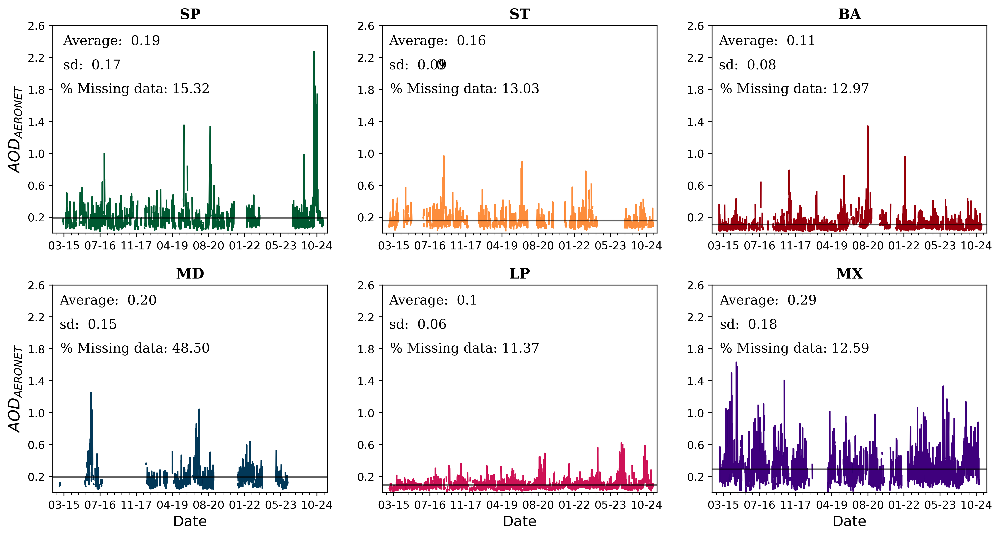

In [10]:
#VERSION 02 MAIAC - AERONET
# Latam cities
# dir_path_latam = "D:/Josefina/paper_git/paper_maiac/datasets/V02/aeronet/datasets_interp_s_L02/Latam"
dir_path_latam = "D:/Josefina/paper_git/paper_maiac/datasets/V03/aeronet/datasets_interp_s_L02/Latam"
date_format_latam = '%d/%m/%Y %H:%M'#'%Y-%m-%d %H:%M:%S'

nrows=2
ncols=3
color = ["#005a32","#fd8d3c","#99000d","#023858","#ce1256","#3f007d","#c994c7"]
plot= 'NO'
aeronet_plot_latam = aeronet_plot(path=dir_path_latam,date_format=date_format_latam,nrows=nrows,ncols=ncols,colors = color, plot=plot)
aeronet_plot_latam


In [42]:
# CALCULO DE FALTANTE DE DATOS
# MD / SL 
48.50-5.78 ==> 42.72 ==> 40.62
# ST/UH /GT
52.98-50.89 ==2.09 ==> 13.03 ==> 10.15/11.62

42.72

In [4]:
# AERONET station time series
def aeronet_plot_USA (path, date_format,nrows,ncols,colors,plot):
    '''
    The function allows plotting the daily averages of each AERONET station.
    The data of each station of interest is contained in a folder in .csv format previously processed.
    This function goes through the folder and takes each of these files to later make the plot of interest.
    Variables:
    - path : path to the folder where the files in .csv format are located
    - date_format: format of the date column of the file of interest. 
    For example: date_format='%Y-%m-%d %H:%M:%S'
    - nrows: number of rows the plot will have
    - ncols: number of columnas the plot will have
    - color palette for each of AERONET's stations For example: 
    colors = ["#005a32","#fd8d3c","#99000d","#023858","#ce1256","#3f007d"])
    '''
    i=0 
    j=0 

    fig, ax = plt.subplots(ncols=ncols,nrows=nrows,  figsize=(12,6),dpi=400)
    #The folder where the files of each station are located is browsed.
    for p,files in enumerate(os.listdir(path)):
        N = len(os.listdir(path))
        data = pd.read_csv(os.path.join(path,files))
        #A column is created with the date called "Timestamp".
        data["Timestamp"] = data["date"].apply(lambda x: datetime.strptime(x,date_format))
        #Becomes the index column
        data.set_index('Timestamp', inplace = True)
        # Daily mean
        data_mean  = data['aod_550'].resample('1D').mean()
        data_mean_period = data_mean ['2015-01-01':'2024-12-31']
        data_mean_period_len =len(data_mean_period.dropna(how='all'))
        # Station Name
        station_name = files [2:4]
        print(files)   
        mean = data_mean_period.mean()

       
        ########################                PLOT                ########################
        # Figure
        ax[i][j].plot(data_mean_period.index, data_mean_period,c=colors[p])
        ax[i][j].text(data_mean_period.index[1],2.4, "Average: " +" "+ str(round(data_mean_period.mean(),2)),  
            ha="left", va="center",fontdict={'family': 'serif', 
            'color' : 'Black',
            'size': 12})
#         print("Cuantas veces mas grande es el maximo que la media ",round(data_mean_period.max()/(data_mean_period.mean()),2))
        # Daily average line
        ax[i][j].axhline(y=mean, color= "black",linewidth=1.5, alpha=0.6, linestyle = '-')
        
        # Daily lenth text
        ax[i][j].text(data_mean_period.index[1],2.10, "sd: " +" "+ str(round(data_mean_period.std(),2)), 
            ha="left", va="center",fontdict={'family': 'serif', 
            'color' : 'Black',
            #'weight': 'bold',
            'size': 12})
#         ax[i][j].text(data_mean_period.index[1],2.0, "n =" +" "+ str(data_mean_period_len),  
#             ha="left", va="center",fontdict={'family': 'serif', 
#             'color' : 'Black',
#             'size': 10})
      
        # Axes names
        #ax[i][j].set_xlabel(r'$AOD_{Date}$',size=10)
#         ax[i][j].set_xlabel(r'Date',size=14)
#         ax[i][j].set_ylabel(r'$AOD_{AERONET}$',size=14)
        
        ax[0][0].set_xlabel(r'',size=10)
        ax[0][1].set_xlabel(r'',size=10)
        ax[0][2].set_xlabel(r'',size=10)
        ax[1][0].set_xlabel(r'Date',size=13)
        ax[1][1].set_xlabel(r'Date',size=13)
        ax[1][2].set_xlabel(r'Date',size=13)
        
        
        ax[0][0].set_ylabel(r'$AOD_{AERONET}$',size=14)
        ax[0][1].set_ylabel(r'',size=18)
        ax[0][2].set_ylabel(r'',size=18)
        ax[1][0].set_ylabel(r'$AOD_{AERONET}$',size=14)
        ax[1][1].set_ylabel(r'',size=18)
        ax[1][2].set_ylabel(r'',size=18)
        
        #Ticks

        
        # Title of each subplot corresponds to the name of the AERONET station.
        ax[i][j].set_title(station_name,fontsize=13,fontdict={'family': 'serif', 
            'color' : 'Black',
            'weight': 'bold',
            'size': 22})
        # Day fotmat
        Format = mdates.DateFormatter('%m-%y')
        ax[i][j].xaxis.set_major_formatter(Format)
        ax[i][j].xaxis.set_major_locator(ticker.AutoLocator())
        ax[i][j].xaxis.set_minor_locator(ticker.AutoMinorLocator())
       
        #ax[i][j].set_xlim('01-2015','12-2022')

        ax[i][j].set_xlim(pd.Timestamp('2014-10-01'), pd.Timestamp('2025-01-28'))

#         ax[2,1].set_visible(False)
        #ax[2,2].set_visible(False)
        faltate_datos = 3653-data_mean_period_len
        porc_faltante_datos = (faltate_datos/2922)*100
        # Imprimir el resultado en formato f-string
        print(f"num_dias faltantes: {faltate_datos}")
        print(f"% dias faltantes: {porc_faltante_datos:.2f}%")
        # Location of data in each subplot
        print(station_name)
        ax[i][j].yaxis.set_ticks(np.arange(0.2, 2.65, 0.4))
        ax[i][j].set_ylim(0,2.6)
    
        if j == ncols-1:
            i = i+1
            j = 0
        else:
            j = j+1
    ax[0][0].text(data_mean_period.index[1],1.8, "% Missing data: 10.63",  #GS
                    ha="left", va="center",fontdict={'family': 'serif', 
                    'color' : 'Black',
                    'size': 12})
    ax[0][1].text(data_mean_period.index[1],1.8, "% Missing data: 12.62",  #GT
                    ha="left", va="center",fontdict={'family': 'serif', 
                    'color' : 'Black',
                    'size': 12})
    ax[0][2].text(data_mean_period.index[1],1.8, "% Missing data: 11.15",  
                    ha="left", va="center",fontdict={'family': 'serif', 
                    'color' : 'Black',
                    'size': 12})
    ax[1][0].text(data_mean_period.index[1],1.8, "% Missing data: 11.95",  #CT 
                    ha="left", va="center",fontdict={'family': 'serif', 
                    'color' : 'Black',
                    'size': 12})
    ax[1][1].text(data_mean_period.index[1],1.8, "% Missing data: 40.62",  #SL
                    ha="left", va="center",fontdict={'family': 'serif', 
                    'color' : 'Black',
                    'size': 12})
    ax[1][2].text(data_mean_period.index[1],1.8, "% Missing data:  11.77",   #UH 
                    ha="left", va="center",fontdict={'family': 'serif', 
                    'color' : 'Black',
                    'size': 12})
    plt.subplots_adjust(left=0.01,#0.125,
                    bottom=0.01,#0.1, 
                    right=0.99,#0.9, 
                    top=0.99,#0.9, 
                    wspace=0.2, 
                    hspace=0.25)#0.4)
    
   # Save the plot to the current path
    if plot == 'save':
        return(plt.savefig("aeronet_plot2.jpg", dpi=500))
    else:
        return(plt.show())

1_GS_2015-2022_interp-s_V02_L2_V03.csv
num_dias faltantes: 1194
% dias faltantes: 40.86%
GS
2_GT_2015-2022_interp-s_V02_L2_V03.csv
num_dias faltantes: 1771
% dias faltantes: 60.61%
GT
3_MS_2015-2022_interp-s_V02_L2_V03.csv
num_dias faltantes: 1478
% dias faltantes: 50.58%
MS
4_CT_2015-2022_interp-s_V02_L2_V03.csv
num_dias faltantes: 1404
% dias faltantes: 48.05%
CT
5_SL_2015-2022_interp-s_V02_L2_V03.csv
num_dias faltantes: 2355
% dias faltantes: 80.60%
SL
6_UH_2015-2022_interp-s_V02_L2_V03.csv
num_dias faltantes: 1776
% dias faltantes: 60.78%
UH


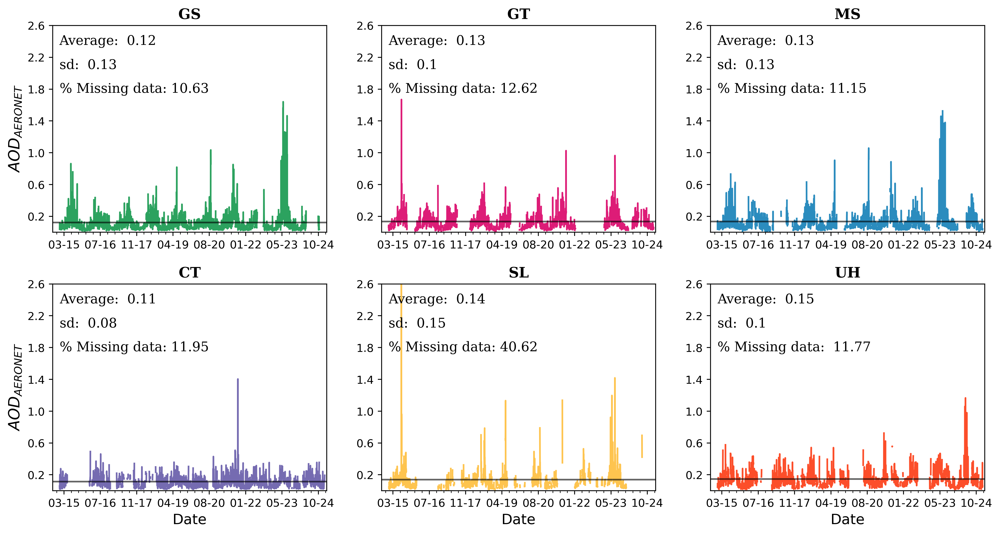

In [5]:
#VERSION 02 MAIAC - AERONET
# Latam cities
dir_path_USA = "D:/Josefina/paper_git/paper_maiac/datasets/V03/aeronet/datasets_interp_s_L02/USA"

# date_format_latam = '%Y-%m-%d %H:%M:%S'
date_format_latam = '%d/%m/%Y %H:%M'
nrows=2
ncols=3
# color = ["#005a32","#fd8d3c","#99000d","#023858","#ce1256","#3f007d","#c994c7"]
# Colores USA
color = ["#2ca25f","#dd1c77","#2b8cbe","#756bb1","#fec44f" ,"#fc4e2a"]
#color = ["#99d8c9","#c994c7" ,"#a6bddb","#bcbddc","#fff7bc", "#feb24c"]
plot= 'NO'
aeronet_USA = aeronet_plot_USA(path=dir_path_USA,date_format=date_format_latam,nrows=nrows,ncols=ncols,colors = color, plot=plot)
aeronet_USA


### REU

In [11]:
def REU_list(DF, Pollutant, Units, Lambda = 1, u_xi = 0.0):
    '''This function allows us to calculate the relative expanded uncertainty
    Variables:
    DF: It is a dataframe with the satellite AOD values (MAIAC and MODIS) and the AERONET reference AOD
    Pollutant: name of the reference pollutant, in our case AERONET
    Units: name of the variables we want to analyze. In our case MAIAC and MODIS
    '''
    
    #NOTE: Sigma_err_x (NILU notation) is the same as u_xi (GDE2010 notation)
    Sigma_err_x = u_xi
    # These are lists where I will save the different results
    list_u = []
    list_reu = []
    list_bias = []
    list_noise = []
    list_reux = []
    list_biasx = []
    list_noisex = []
    list_verificacion = []
  
    # The UNITS are covered, that is, the pollutant to be analyzed. In our case MAIAC and MODIS
    for Unit in Units:
        x = DF[Pollutant] #AERONET
        y = DF[Unit] # Pollutant
        
        #Masking the NaN's
        mask = ~np.isnan(x) & ~np.isnan(y)
        x = x[mask]
        y = y[mask]
        n = len(x)
        
        #Slope & Intercept usando REGRESION LINEAL (LR)
        slope, intercept, r, p, stderr = scipy.stats.linregress(x[mask], y[mask])
        b1 = slope
        b0 = intercept
        
        #Equation error variance for y = b0 + b1*x + v_i

        rss = (y - b0 - b1*x)**2
        RSS = rss.values.sum()
        Sigma_v_sqr = RSS/(n-2)
                
        #Error variance due to the deviation of the 1:1 line
        ec = (b0 + (b1 - 1)*x)**2
        ran = Sigma_v_sqr - Sigma_err_x**2
        
        #Results
        
        U = ((ran + ec)**(1/2))
        
        REU = ((2*100)/y)*U
        
        bias = ((((2*100)/y)**2)*ec)**(1/2)
        
        noise = ((((2*100)/y)**2)*ran)**(1/2)
        
        verificacion = ((bias**2 + noise**2)**(1/2))
        verificacion_u = ((bias**2 + noise**2)**(1/2))/((2*100)/y)
        
        REUx = 2*U*100/x
        
        biasx = ((((2*100)/x)**2)*ec)**(1/2)
        
        noisex = ((((2*100)/x)**2)*ran)**(1/2)
        
        #The results are each placed in a separate list
        list_u.append(U)
        list_reu.append(REU)
        list_bias.append(bias)
        list_noise.append(noise)
        list_verificacion.append(verificacion)
        list_reux.append(REUx)
        list_biasx.append(biasx)
        list_noisex.append(noisex)
    
    # The generated lists are concatenated
    U = pd.concat(list_u, axis=1)
    Col_Names=[]
    for i in Units:
        i = 'U_'+ i
        Col_Names.append(i)
    U.columns = Col_Names
    U.rename_axis("Timestamp", axis='index', inplace=True)
    
    REU = pd.concat(list_reu, axis=1)
    Col_Names=[]
    for i in Units:
        i = 'REU_'+ i
        Col_Names.append(i)
    REU.columns = Col_Names
    REU.rename_axis("Timestamp", axis='index', inplace=True)
    
    bias = pd.concat(list_bias, axis=1)
    Col_Names=[]
    for i in Units:
        i = 'b_'+ i
        Col_Names.append(i)
    bias.columns = Col_Names
    bias.rename_axis("Timestamp", axis='index', inplace=True)
    
    noise = pd.concat(list_noise, axis=1)
    Col_Names=[]
    for i in Units:
        i = 'n_'+ i
        Col_Names.append(i)
    noise.columns = Col_Names
    noise.rename_axis("Timestamp", axis='index', inplace=True)
    
    verificacion = pd.concat(list_verificacion, axis =1 )
    Col_Names=[]
    for i in Units:
        i = 'verificacion_'+ i
        Col_Names.append(i)
    verificacion.columns = Col_Names
    verificacion.rename_axis("Timestamp", axis='index', inplace=True)
    
    REUx = pd.concat(list_reux, axis=1)
    Col_Names=[]
    for i in Units:
        i = 'REUx_'+ i
        Col_Names.append(i)
    REUx.columns = Col_Names
    REUx.rename_axis("Timestamp", axis='index', inplace=True)
    
    biasx = pd.concat(list_biasx, axis=1)
    Col_Names=[]
    for i in Units:
        i = 'bx_'+ i
        Col_Names.append(i)
    biasx.columns = Col_Names
    biasx.rename_axis("Timestamp", axis='index', inplace=True)
    
    noisex = pd.concat(list_noisex, axis=1)
    Col_Names=[]
    for i in Units:
        i = 'nx_'+ i
        Col_Names.append(i)
    noisex.columns = Col_Names
    noisex.rename_axis("Timestamp", axis='index', inplace=True)
    
   
    REUyx = pd.concat((DF[Pollutant], U, REU, bias, noise, REUx, biasx, noisex,verificacion), axis=1)#, 

    
    return REUyx
# REU PLOT
def REU_plot(path, date_format,nrows,ncols,color_maiac,plot,resolucion_espaciotemporal):
    '''
    This function allows plotting the previously calculated REU. 
    The data of each station of interest is contained in a folder in .csv format previously processed.
    This function goes through the folder and takes each of these files to later make the plot of interest.

    Variables:
    - path : path to the folder where the files in .csv format are located
    - date_format: format of the date column of the file of interest. 
    For example: date_format='%Y-%m-%d %H:%M:%S'
    - nrows: number of rows the plot will have
    - ncols: number of columnas the plot will have
    - color palette for each  for stations MAIAC-MODIS For example: 
    color_modis = ["#74c476","#fed976","#fb6a4a", "#74a9cf","#df65b0","#807dba"]
    color_maiac = ["#005a32","#fd8d3c","#99000d","#023858","#ce1256","#3f007d"]
    '''
    i=0 
    j=0 
    edge_color_maiac = ["#004529", "#feb24c","#67000d","#081d58","#67001f","#4d004b"]
    edge_color_modis = ["#41ab5d","#feb24c","#cb181d","#045a8d","#ce1256","#810f7c"]
    listas_medias = [0.19,0.16,0.11,0.2,0.1,0.29]
    sp_media = 0.19
    st_media = 0.16
    ba_media = 0.11
    md_media = 0.2
    lp_media = 0.1
    mx_media = 0.29
    

        
    fig, ax = plt.subplots(ncols=ncols,nrows=nrows,  figsize=(14,6),dpi=500)
    #The folder where the files of each station are located is browsed.
    #fig.suptitle(resolucion_espaciotemporal, fontsize=16, fontweight='bold')
    for p,files in enumerate(os.listdir(path)):
        N = len(os.listdir(path))
        data = pd.read_csv(os.path.join(path,files))
        #A column is created with the date called "Timestamp".
        #data["Timestamp"] = data["Date_MODIS"].apply(lambda x: datetime.strptime(x,date_format))
        data["Timestamp"] = data["date"].apply(lambda x: datetime.strptime(x,date_format))
        #Becomes the index column
        data.set_index('Timestamp', inplace = True)
        data_mean_period_len =len(data.dropna(how='all'))
        

        df_REUxy = REU_list(DF = data, Pollutant = 'AOD_550_AER_mean', 
        Units = ["AOD_550_maiac_mean"], 
        #Units = ["AOD_550_maiac"], 
        Lambda = 1, u_xi = 0.0)
        # Station Name
        station_name = files [2:4]
        ########################                VARIABLES                ########################
        
        
        x = df_REUxy["AOD_550_AER_mean"]
        #y_maiac = df_REUxy["REUx_AOD_550_maiac"]
        y_maiac = df_REUxy["REUx_AOD_550_maiac_mean"]
        n = len(x)
#         min_maiac = round(min(df_REUxy["REUx_AOD_550_maiac"]),2)
#         max_maiac = round(max(df_REUxy["REUx_AOD_550_maiac"]),2)
        min_maiac = round(min(df_REUxy["REUx_AOD_550_maiac_mean"]),2)
        max_maiac = round(max(df_REUxy["REUx_AOD_550_maiac_mean"]),2)

        ########################                PLOT                ########################


        x_intersec = listas_medias[p] #0.18
    # Encontrar el índice más cercano a x=0.19
        idx = (x - x_intersec).abs().idxmin()
        y_intersec = y_maiac.loc[idx]

        ax[i][j].hlines(y=y_intersec, xmin=0, xmax=1.2, color='black', linewidth=1.5, linestyle=':', alpha=0.8)
        ax[i][j].text(0.5, y_intersec + 5, f"REU = {y_intersec:.0f}%", color='black', fontsize=12)


        # Figure
        #Scatter plot REU vs Ref
        ax[i][j].scatter(x, y_maiac, s=10, color=color_maiac[p], alpha=0.5, linewidth=1) # Color
        ax[i][j].grid(color = 'grey', linestyle = '--', linewidth = 0.2)
        #ax[i][j].hlines(y=0.19, xmin=0, xmax=1.2, color='red', linewidth=1.2, alpha=0.8, linestyle=':')

       # The line with the minimum value of MIAC and MODIS is added
#         ax[i][j].hlines(y=min_maiac , xmin=0, xmax=1.2, color='black', linewidth=1, alpha=0.8, linestyle = '--')
        
        ax[0][0].vlines(x= sp_media, ymin=0, ymax=300, color=color_maiac[0], linewidth=1, alpha=0.8, linestyle = '-')
        ax[0][1].vlines(x= st_media, ymin=0, ymax=300, color=color_maiac[1], linewidth=1, alpha=0.8, linestyle = '-')
        ax[0][2].vlines(x= ba_media, ymin=0, ymax=300, color=color_maiac[2], linewidth=1, alpha=0.8, linestyle = '-')
        ax[1][0].vlines(x= md_media, ymin=0, ymax=300, color=color_maiac[3], linewidth=1, alpha=0.8, linestyle = '-')
        ax[1][1].vlines(x= lp_media, ymin=0, ymax=300, color=color_maiac[4], linewidth=1, alpha=0.8, linestyle = '-')
        ax[1][2].vlines(x= mx_media, ymin=0, ymax=300, color=color_maiac[5], linewidth=1, alpha=0.8, linestyle = '-')
        ax[0][0].text(sp_media-0.05, 180, "AER mean = 0.18", rotation=90, va='center',size=12)
        ax[0][1].text(st_media-0.05, 180, "AER mean = 0.16", rotation=90, va='center',size=12)
        ax[0][2].text(ba_media-0.05, 180, "AER mean = 0.11", rotation=90, va='center',size=12)
        ax[1][0].text(md_media-0.05, 180, "AER mean = 0.20", rotation=90, va='center',size=12)
        ax[1][1].text(lp_media-0.05, 150, "AER mean = 0.08", rotation=90, va='center',size=12)
        ax[1][2].text(mx_media-0.05, 180, "AER mean = 0.29", rotation=90, va='center',size=12)
#     sp_media = 0.18
#     st_media = 0.16
#     ba_media = 0.11
#     md_media = 0.2
#     lp_media = 0.08
#     mx_media = 0.29
#         ax[0][0].vlines(x= gs_media, ymin=0, ymax=300, color=color_maiac[0], linewidth=1, alpha=0.8, linestyle = '-')
#         ax[0][1].vlines(x= gt_media, ymin=0, ymax=300, color=color_maiac[1], linewidth=1, alpha=0.8, linestyle = '-')
#         ax[0][2].vlines(x= ms_media, ymin=0, ymax=300, color=color_maiac[2], linewidth=1, alpha=0.8, linestyle = '-')
#         ax[1][0].vlines(x= ct_media, ymin=0, ymax=300, color=color_maiac[3], linewidth=1, alpha=0.8, linestyle = '-')
#         ax[1][1].vlines(x= sl_media, ymin=0, ymax=300, color=color_maiac[4], linewidth=1, alpha=0.8, linestyle = '-')
#         ax[1][2].vlines(x= uh_media, ymin=0, ymax=300, color=color_maiac[5], linewidth=1, alpha=0.8, linestyle = '-')
#         ax[0][0].text(gs_media-0.05, 150, "AER mean", rotation=90, va='center',size=9)
#         ax[0][1].text(gt_media-0.05, 150, "AER mean", rotation=90, va='center',size=9)
#         ax[0][2].text(ms_media-0.05, 150, "AER mean", rotation=90, va='center',size=9)
#         ax[1][0].text(ct_media-0.05, 150, "AER mean", rotation=90, va='center',size=9)
#         ax[1][1].text(sl_media-0.05, 150, "AER mean", rotation=90, va='center',size=9)
#         ax[1][2].text(uh_media-0.05, 150, "AER mean", rotation=90, va='center',size=9)
        
#         ax[i][j].text(0.8, min_maiac+5,(f'$REU = {min_maiac}$'),
#                       ha="left", va="center",fontdict={'family': 'serif', 
#                      'color' : 'Black',
#                      'weight': 'bold',
#                      'size': 9})

        # Title of each subplot corresponds toY the name of the AERONET station.
        ax[i][j].set_title(station_name,fontsize=15,fontdict={'family': 'serif', 
            'color' : 'Black',
            'weight': 'bold',
            'size': 20})
        # X axis limit
        ax[i][j].set_xlim(0,1.2) 
        # Y axis limit
        ax[i][j].set_ylim(0,300)
        
#         ax[i][j].set_yticks(range(0, 301, 20))
        # Axes names
        ax[i][j].set_xlabel(r'$AOD_{AERONET}$',size=10)
        ax[i][j].set_ylabel(r'REU $AOD_{Satellite}$',size=10)
        # Configuration of subplots
        plt.subplots_adjust(left=0.125,bottom=0.1, 
                    right=0.9, 
                    top=0.9, 
                    wspace=0.2, 
                    hspace=0.4)
        # Tittle legend
        tittle_legend = ["MAIAC"]
        ax[i][j].legend(frameon = False, markerfirst = False, fontsize = 10)
        ax[i][j].grid(False)
        # Location of data in each subplot
        if j == ncols-1:
            i = i+1
            j = 0
        else:
            j = j+1
    
       # Save the plot to the current path
    if plot == 'save':
        return(plt.savefig("REU_plot.jpg", dpi=500))
    else:
        return(plt.show())
    
# dir = "D:/Josefina/paper_git/paper_maiac/datasets/V02/processed/merge_AER-MAIAC/Latam_C61/dia/1km/1km60min_copy"
dir = "D:/Josefina/paper_git/paper_maiac/datasets/V03/processed/merge_AER-MAIAC/Latam_C61/dia/1km/60mins"
resolucion_espaciotemporal = "1KM-60MIN-TOT"
REU_plot(path=dir,date_format='%d/%m/%Y',nrows=2,ncols=3,color_maiac = ["#005a32","#fd8d3c","#99000d","#023858","#ce1256","#3f007d"],plot = 'LALAL',resolucion_espaciotemporal=resolucion_espaciotemporal)


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


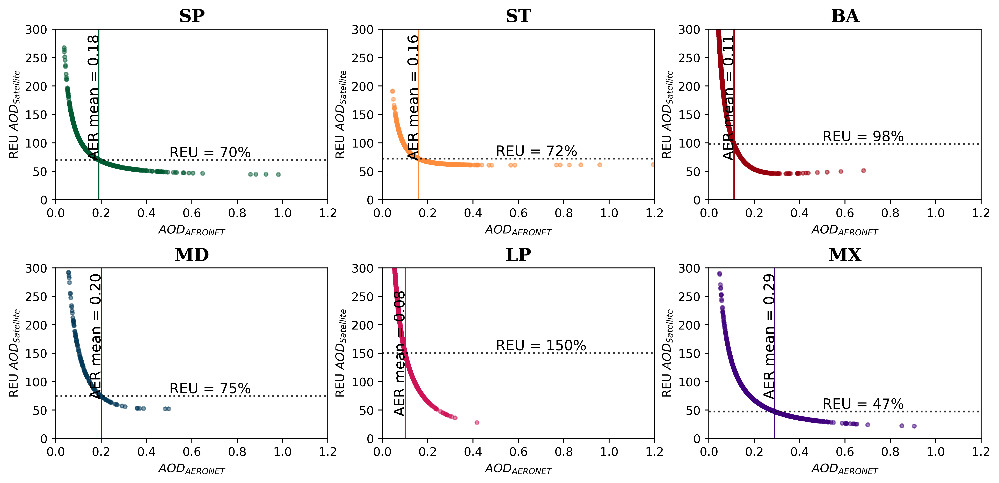

In [12]:
# dir = "D:/Josefina/paper_git/paper_maiac/datasets/V02/processed/merge_AER-MAIAC/Latam_C61/dia/1km/1km60min_copy"
dir = "D:/Josefina/paper_git/paper_maiac/datasets/V03/processed/merge_AER-MAIAC/Latam_C61/dia/1km/60mins"
resolucion_espaciotemporal = "1KM-60MIN-TOT"
REU_plot(path=dir,date_format='%d/%m/%Y',nrows=2,ncols=3,color_maiac = ["#005a32","#fd8d3c","#99000d","#023858","#ce1256","#3f007d"],plot = 'LALAL',resolucion_espaciotemporal=resolucion_espaciotemporal)


In [7]:
dir_latam ="D:/Josefina/paper_git/paper_maiac/datasets/V02/processed/merge_C60C61/Latam/1-SP-1km60min-C60-C61-AER_MEAN.csv"
data = pd.read_csv(dir_latam)
df_REUxy = REU_list(DF=data,Lambda = 1, u_xi = 0.0)

df_REUxy
df_REUxy.to_csv("D:/Josefina/paper_git/paper_maiac/datasets/V02/processed/merge_C60C61/REUx/1-SP-1km60min-C60-C61-AER_MEAN-REU.csv", index=False)

## REU MODIS VS MAIAC

In [15]:
def REU_list(DF,Lambda = 1, u_xi = 0.0):

    #DF = data
    Lambda = 1
    u_xi = 0.0
    Sigma_err_x = u_xi
    # These are lists where I will save the different results
    list_u_1 = []
    list_reu_1 = []
    list_bias_1 = []
    list_noise_1 = []
    list_reux_1 = []
    list_biasx_1 = []
    list_noisex_1 = []
    ##
    list_u_3 = []
    list_reu_3 = []
    list_bias_3 = []
    list_noise_3 = []
    list_reux_3 = []
    list_biasx_3 = []
    list_noisex_3 = []
    list_verificacion_3 = []

    x_1 = DF['AOD_modis_AER'] #AERONET
    y_1 = DF["AOD_modis"] # Pollutant
    ##
    x_3 = DF['AOD_maiac_AER'] #AERONET
    y_3 = DF["AOD_maiac"] # Pollutant
    ##    
    
    
    #Masking the NaN's
    mask_1 = ~np.isnan(x_1) & ~np.isnan(y_1)
    x_1 = x_1[mask_1]
    y_1 = y_1[mask_1]
    n_1 = len(x_1)
    ##
    mask_3 = ~np.isnan(x_3) & ~np.isnan(y_3)
    x_3 = x_3[mask_3]
    y_3 = y_3[mask_3]
    n_3 = len(x_3)
    ##
    #Slope & Intercept usando REGRESION LINEAL (LR)
    slope_1, intercept_1, r_1, p_1, stderr_1 = scipy.stats.linregress(x_1[mask_1], y_1[mask_1])
    b1_1 = slope_1
    b0_1 = intercept_1
    #Slope & Intercept usando REGRESION LINEAL (LR)
    slope_3, intercept_3, r_3, p_3, stderr_3 = scipy.stats.linregress(x_3[mask_3], y_3[mask_3])
    b1_3 = slope_3
    b0_3 = intercept_3
    #Equation error variance for y = b0 + b1*x + v_i
    rss_1 = (y_1 - b0_1 - b1_1*x_1)**2
    RSS_1 = rss_1.values.sum()
    Sigma_v_sqr_1 = RSS_1/(n_1-2)
    #Equation error variance for y = b0 + b1*x + v_i
    rss_3 = (y_3 - b0_3 - b1_3*x_3)**2
    RSS_3 = rss_3.values.sum()
    Sigma_v_sqr_3 = RSS_3/(n_3-2)

    #Error variance due to the deviation of the 1:1 line
    ec_1 = (b0_1 + (b1_1 - 1)*x_1)**2
    ran_1 = Sigma_v_sqr_1 - Sigma_err_x**2
    #Error variance due to the deviation of the 1:1 line
    ec_3 = (b0_3 + (b1_3 - 1)*x_3)**2
    ran_3 = Sigma_v_sqr_3 - Sigma_err_x**2
    #Error variance due to the deviation of the 1:1 line

    #Results
    U_1 = ((ran_1  + ec_1 )**(1/2))
    REU_1  = ((2*100)/y_1 )*U_1 
    bias_1  = ((((2*100)/y_1 )**2)*ec_1 )**(1/2)
    noise_1  = ((((2*100)/y_1 )**2)*ran_1 )**(1/2)
    verificacion_1  = ((bias_1 **2 + noise_1 **2)**(1/2))
    verificacion_u_1  = ((bias_1 **2 + noise_1 **2)**(1/2))/((2*100)/y_1 )
    REUx_1  = 2*U_1 *100/x_1 
    biasx_1  = ((((2*100)/x_1 )**2)*ec_1 )**(1/2)
    noisex_1  = ((((2*100)/x_1 )**2)*ran_1 )**(1/2)
    #Results
    U_3 = ((ran_3  + ec_3)**(1/2))
    REU_3  = ((2*100)/y_3)*U_3 
    bias_3  = ((((2*100)/y_3)**2)*ec_3)**(1/2)
    noise_3  = ((((2*100)/y_3)**2)*ran_3)**(1/2)
    verificacion_3  = ((bias_3 **2 + noise_3 **2)**(1/2))
    verificacion_u_3  = ((bias_3 **2 + noise_3 **2)**(1/2))/((2*100)/y_3)
    REUx_3  = 2*U_3 *100/x_3
    biasx_3  = ((((2*100)/x_3 )**2)*ec_3 )**(1/2)
    noisex_3  = ((((2*100)/x_3 )**2)*ran_3 )**(1/2)


    #The results are each placed in a separate list
    list_u_1.append(U_1)
    list_reu_1.append(REU_1)
    list_bias_1.append(bias_1)
    list_noise_1.append(noise_1)
    #list_verificacion_1.append(verificacion_1)
    list_reux_1.append(REUx_1)
    list_biasx_1.append(biasx_1)
    list_noisex_1.append(noisex_1)
    #The results are each placed in a separate list
    list_u_3.append(U_3)
    list_reu_3.append(REU_3)
    list_bias_3.append(bias_3)
    list_noise_3.append(noise_3)
    list_verificacion_3.append(verificacion_3)
    list_reux_3.append(REUx_3)
    list_biasx_3.append(biasx_3)
    list_noisex_3.append(noisex_3)


    # The generated lists are concatenated
    U_1 = pd.concat(list_u_1, axis=1)
    REU_1 = pd.concat(list_reu_1, axis=1)
    REUx_1 = pd.concat(list_reux_1, axis=1)

    REU_3 = pd.concat(list_reu_3, axis=1)
    REUx_3 = pd.concat(list_reux_3, axis=1)
    # Realizar el merge de las tres columnas en un solo DataFrame
    
    
    result = pd.concat([DF['AOD_modis_AER'], REUx_1,DF['AOD_maiac_AER'], REUx_3], axis=1)
    # Cambiar los nombres de las columnas
    result.columns = ["AOD_modis_AER", 'REUx_modis',"AOD_maiac_AER", 'REUx_maiac']

    # # Mostrar el resultado
    # result.tail(10)
    df_REUxy = result
    # df_REUxy.columns
    return df_REUxy
#

67.57 79.97
74.51 193.02
97.85 415.49
76.86 101.33
166.93 251.51
53.9 128.0


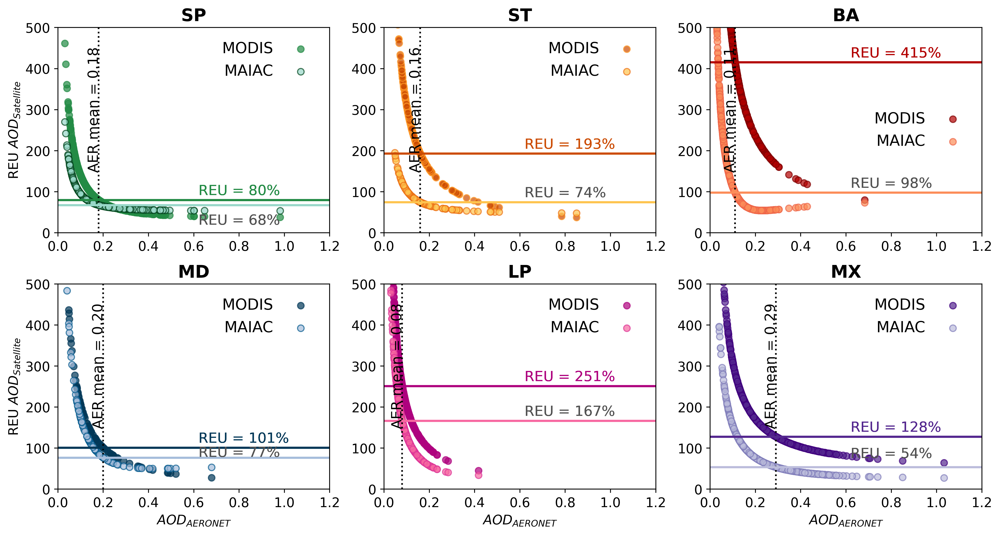

In [16]:
def REU_plot(path, date_format, nrows, ncols, plot, resolucion_espaciotemporal, 
             color_maiac_60, edge_color_maiac_60, color_maiac_61, edge_color_maiac_61,
             x_vert=0.18):
    
    import matplotlib.pyplot as plt
    import pandas as pd
    import numpy as np
    import os

    # Definir las medias específicas para cada estación
    station_media = {
        'sp': 0.18,
        'st': 0.16,
        'ba': 0.11,
        'md': 0.2,
        'lp': 0.08,
        'mx': 0.29
    }

#     fig, ax = plt.subplots(ncols=ncols, nrows=nrows, figsize=(16, 10), dpi=300)
    fig, ax = plt.subplots(ncols=ncols,nrows=nrows,  figsize=(12,6),dpi=400)
    fig.suptitle(resolucion_espaciotemporal, fontsize=22, fontweight='bold')

    for p, files in enumerate(os.listdir(path)):
        data = pd.read_csv(os.path.join(path, files))
        station_name = files[2:4]

        # Obtener la media correspondiente para la estación actual
        station_key = station_name.lower()
        x_vert = station_media.get(station_key, 0.18)  # Default a 0.18 si no se encuentra la estación

        df_REUxy = REU_list(DF=data, Lambda=1, u_xi=0.0)

        x_modis = df_REUxy["AOD_modis_AER"]
        y_modis = df_REUxy["REUx_modis"]
        x_maiac = df_REUxy["AOD_maiac_AER"]
        y_maiac = df_REUxy["REUx_maiac"]

        # Filtrar NaNs
        mask_modis = ~np.isnan(x_modis) & ~np.isnan(y_modis)
        mask_maiac = ~np.isnan(x_maiac) & ~np.isnan(y_maiac)

        x_modis = x_modis[mask_modis]
        y_modis = y_modis[mask_modis]
        x_maiac = x_maiac[mask_maiac]
        y_maiac = y_maiac[mask_maiac]

        # Encontrar valores de REUx donde x = x_vert
        idx_closest_modis = (np.abs(x_modis - x_vert)).idxmin()
        y_horiz_modis = y_modis.loc[idx_closest_modis]

        idx_closest_maiac = (np.abs(x_maiac - x_vert)).idxmin()
        y_horiz_maiac = y_maiac.loc[idx_closest_maiac]

        row = p // ncols
        col = p % ncols

        ax[row, col].scatter(x_modis, y_modis, color=color_maiac_60[p],
                             edgecolor=edge_color_maiac_60[p], alpha=0.7, label='MODIS')
        ax[row, col].scatter(x_maiac, y_maiac, color=color_maiac_61[p],
                             edgecolor=edge_color_maiac_61[p], alpha=0.7, label='MAIAC')

        # Líneas de referencia para las estaciones
        ax[row, col].axvline(x=x_vert, color='k', linestyle=':', lw=1.5)
        
        # Añadir línea vertical y texto para cada estación según su media
        #ax[row, col].vlines(x=x_vert, ymin=0, ymax=300, color=color_maiac_61[p], linewidth=1, alpha=0.8, linestyle='-')
        ax[row, col].text(x_vert-0.05, 300, f"AER mean = {x_vert:.2f}", rotation=90, va='center', size=13)

        ax[row, col].axhline(y=y_horiz_modis, color=color_maiac_60[p],  lw=2)#linestyle=':',
        ax[row, col].axhline(y=y_horiz_maiac, color=color_maiac_61[p], lw=2)#linestyle='-.'
        print(round(y_horiz_maiac,2),round(y_horiz_modis,2))
        ax[0, 0].text(x=0.62, y=79.97 + 5,s=f"REU = 80%", color=color_maiac_60[0],fontsize=13, verticalalignment='bottom')
        ax[0, 1].text(x=0.62, y=193.02 + 5,s=f"REU = 193%", color=color_maiac_60[1],fontsize=13, verticalalignment='bottom')
        ax[0, 2].text(x=0.62, y=415.49 + 5,s=f"REU = 415%", color=color_maiac_60[2],fontsize=13, verticalalignment='bottom')
        ax[1, 0].text(x=0.62, y=101.33 + 5,s=f"REU = 101%", color=color_maiac_60[3],fontsize=13, verticalalignment='bottom')
        ax[1, 1].text(x=0.62, y=251.51 + 5,s=f"REU = 251%", color=color_maiac_60[4],fontsize=13, verticalalignment='bottom')
        ax[1, 2].text(x=0.62, y=128.00 + 5,s=f"REU = 128%", color=color_maiac_60[5],fontsize=13, verticalalignment='bottom')

        
        #color_maiac_61[1]
        ax[0, 0].text(x=0.62, y=7.57 + 5, s=f"REU = 68%", color="#525252",fontsize=13, verticalalignment='bottom')
        ax[0, 1].text(x=0.62, y=74.51 + 5, s=f"REU = 74%", color="#525252",fontsize=13, verticalalignment='bottom')
        ax[0, 2].text(x=0.62, y=97.84+ 5, s=f"REU = 98%", color="#525252",fontsize=13, verticalalignment='bottom')
        ax[1, 0].text(x=0.62, y=66.86 + 5, s=f"REU = 77%", color="#525252",fontsize=13, verticalalignment='bottom')
        ax[1, 1].text(x=0.62, y=166.93 + 5, s=f"REU = 167%", color="#525252",fontsize=13, verticalalignment='bottom')
        ax[1, 2].text(x=0.62, y=63.90  + 5, s=f"REU = 54%", color="#525252",fontsize=13, verticalalignment='bottom')
  
        # Mostrar los valores de los cortes sin convertir a porcentaje
#         ax[row, col].text(x=0.5, y=y_horiz_modis + 5,
#                           s=f"REUx = {y_horiz_modis:.2f}%", color=color_maiac_60[p],
#                           fontsize=14, verticalalignment='bottom')

#         ax[row, col].text(x=0.5, y=y_horiz_maiac + 5,
#                           s=f"REUx ={y_horiz_maiac:.2f}%", color=color_maiac_61[p],
#                           fontsize=14, verticalalignment='bottom')
        
# 67.57 79.97
# 74.51 193.02
# 97.84 415.49
# 76.86 101.33
# 166.93 251.51
# 53.90 128.00
                
                # Formato del gráfico
        ax[row, col].set_xlim(0, 1.2)
        ax[row, col].set_ylim(0, 500)
        ax[row, col].set_title(f'{station_name}', fontsize=16, fontweight='bold')
        ax[row, col].tick_params(axis='both', labelsize=12)
        ax[row, col].grid(False)
        ax[row, col].legend(frameon=False, markerfirst=False, fontsize=14)
        ax[0, 0].set_ylabel(r'REU $AOD_{Satellite}$',size=12)
        ax[0, 1].set_ylabel(r'',size=14)
        ax[0, 2].set_ylabel(r'',size=14)
        ax[1, 0].set_ylabel(r'REU $AOD_{Satellite}$',size=12)
        ax[1, 1].set_ylabel(r'',size=14)
        ax[1, 2].set_ylabel(r'',size=14)
        
        ax[0, 0].set_xlabel(r'',size=14)
        ax[0, 1].set_xlabel(r'',size=14)
        ax[0, 1].set_xlabel(r'',size=14)
        ax[1, 0].set_xlabel(r'$AOD_{AERONET}$',size=12)
        ax[1, 1].set_xlabel(r'$AOD_{AERONET}$',size=12)
        ax[1, 2].set_xlabel(r'$AOD_{AERONET}$',size=12)
#         ax[row, col].set_ylabel(r'REU $AOD_{Satellite}$',size=10)
        # Mostrar leyenda solo en (0, 0)
#         if row == 0 and col == 0:
#             ax[row, col].legend(fontsize=11, loc='upper right')

        # Etiquetas de ejes
#         if col == 0:
#             ax[row, col].set_ylabel('REUx (%)', fontsize=13)
#         if row == nrows - 1:
#             ax[row, col].set_xlabel('AOD AERONET', fontsize=13)


#     ax[0, 0].text(x=0.5, y=67.57 - 5,
#                       s=f"REUx = 67.57%", color=color_maiac_61[0],
#                       fontsize=14, verticalalignment='bottom')
#     ax[0, 0].text(x=0.5, y=67.57 + 5,
#                       s=f"       ", color=color_maiac_61[0],
#                       fontsize=14, verticalalignment='bottom')
        plt.subplots_adjust(left=0.01,#0.125,
                            bottom=0.01,#0.1, 
                            right=0.99,#0.9, 
                            top=0.99,#0.9, 
                            wspace=0.2, 
                            hspace=0.25)#0.4)
    plt.show()



#"REUx 30min - Dia - C61 - Latam"
date_format='%Y-%m-%d'
nrows=2
ncols=3
plot ="no"
edge_color_maiac_60 =["#238b45","#fe9929","#7f0000","#023858","#ae017e","#3f007d"]#######
color_maiac_60 = ["#238b45","#cc4c02","#b30000","#023858","#ae017e","#54278f"]#########"

edge_color_maiac_61 = ["#00441b","#ec7014","#ef6548","#045a8d","#dd3497","#807dba"]
color_maiac_61 = ["#99d8c9","#fec44f","#fc8d59", "#a6bddb","#f768a1","#bcbddc"]

dir_path_latam ="D:/Josefina/paper_git/paper_maiac/datasets/V02/processed/merge_AER-MAIAC-MODIS/Latam_C61"
resolucion_espaciotemporal_30 = "  "
prueba_reu_plot = REU_plot(path=dir_path_latam,resolucion_espaciotemporal=resolucion_espaciotemporal_30, date_format=date_format,nrows=nrows,ncols=ncols,plot=plot,color_maiac_60=color_maiac_60, edge_color_maiac_60=edge_color_maiac_60,color_maiac_61=color_maiac_61, edge_color_maiac_61=edge_color_maiac_61)
prueba_reu_plot

### REU MAIAC C6.1 VS 6.0

68.67 86.2
74.93 97.54
87.87 79.45
79.04 70.27
170.03 120.55
47.05 55.3


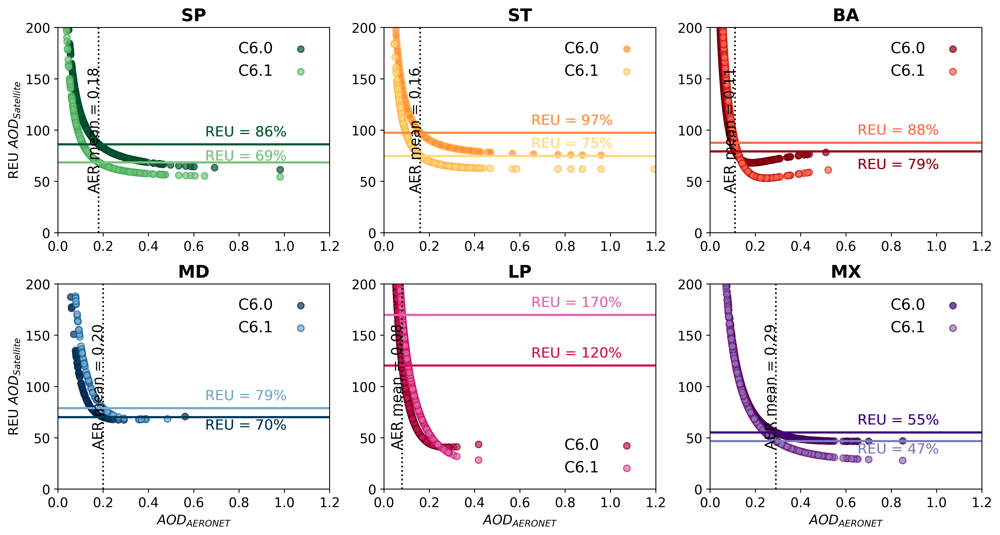

In [14]:
def REU_list(DF, Lambda=1, u_xi=0.0):
    # Initializing the error and results lists
    list_u_1 = []
    list_reu_1 = []
    list_bias_1 = []
    list_noise_1 = []
    list_reux_1 = []
    list_biasx_1 = []
    list_noisex_1 = []
    ## for C6.1
    list_u_3 = []
    list_reu_3 = []
    list_bias_3 = []
    list_noise_3 = []
    list_reux_3 = []
    list_biasx_3 = []
    list_noisex_3 = []

    # AOD and pollutant data for C6.0 and C6.1
    x_1 = DF['AOD_550_AER_mean_60']  # AERONET C6.0
    y_1 = DF["AOD_550_maiac_mean_60"]  # Pollutant C6.0
    x_3 = DF['AOD_550_AER_mean_61']  # AERONET C6.1
    y_3 = DF["AOD_550_maiac_mean_61"]  # Pollutant C6.1

    # Masking NaNs
    mask_1 = ~np.isnan(x_1) & ~np.isnan(y_1)
    x_1 = x_1[mask_1]
    y_1 = y_1[mask_1]
    n_1 = len(x_1)

    mask_3 = ~np.isnan(x_3) & ~np.isnan(y_3)
    x_3 = x_3[mask_3]
    y_3 = y_3[mask_3]
    n_3 = len(x_3)

    # Linear regression
    slope_1, intercept_1, r_1, p_1, stderr_1 = scipy.stats.linregress(x_1, y_1)
    slope_3, intercept_3, r_3, p_3, stderr_3 = scipy.stats.linregress(x_3, y_3)

    # Error variance calculation
    rss_1 = (y_1 - intercept_1 - slope_1 * x_1) ** 2
    RSS_1 = rss_1.values.sum()
    Sigma_v_sqr_1 = RSS_1 / (n_1 - 2)
    
    rss_3 = (y_3 - intercept_3 - slope_3 * x_3) ** 2
    RSS_3 = rss_3.values.sum()
    Sigma_v_sqr_3 = RSS_3 / (n_3 - 2)

    # Error due to the deviation of the 1:1 line
    ec_1 = (intercept_1 + (slope_1 - 1) * x_1) ** 2
    ran_1 = Sigma_v_sqr_1 - u_xi ** 2

    ec_3 = (intercept_3 + (slope_3 - 1) * x_3) ** 2
    ran_3 = Sigma_v_sqr_3 - u_xi ** 2

    # Results for C6.0 and C6.1
    U_1 = np.sqrt(ran_1 + ec_1)
    REU_1 = (2 * 100 / y_1) * U_1
    bias_1 = np.sqrt(((2 * 100 / y_1) ** 2) * ec_1)
    noise_1 = np.sqrt(((2 * 100 / y_1) ** 2) * ran_1)
    
    U_3 = np.sqrt(ran_3 + ec_3)
    REU_3 = (2 * 100 / y_3) * U_3
    bias_3 = np.sqrt(((2 * 100 / y_3) ** 2) * ec_3)
    noise_3 = np.sqrt(((2 * 100 / y_3) ** 2) * ran_3)

    # Store results in lists
    list_u_1.append(U_1)
    list_reu_1.append(REU_1)
    list_bias_1.append(bias_1)
    list_noise_1.append(noise_1)
    list_reux_1.append(2 * U_1 * 100 / x_1)
    list_biasx_1.append(np.sqrt(((2 * 100 / x_1) ** 2) * ec_1))
    list_noisex_1.append(np.sqrt(((2 * 100 / x_1) ** 2) * ran_1))
    
    list_u_3.append(U_3)
    list_reu_3.append(REU_3)
    list_bias_3.append(bias_3)
    list_noise_3.append(noise_3)
    list_reux_3.append(2 * U_3 * 100 / x_3)
    list_biasx_3.append(np.sqrt(((2 * 100 / x_3) ** 2) * ec_3))
    list_noisex_3.append(np.sqrt(((2 * 100 / x_3) ** 2) * ran_3))

    # Concatenate the results
    REU_1 = pd.concat(list_reu_1, axis=1)
    REUx_1 = pd.concat(list_reux_1, axis=1)
    REU_3 = pd.concat(list_reu_3, axis=1)
    REUx_3 = pd.concat(list_reux_3, axis=1)

    # Combine the data into a final DataFrame
    result = pd.concat([DF['AOD_550_AER_mean_60'], REUx_1, DF['AOD_550_AER_mean_61'], REUx_3], axis=1)
    result.columns = ["AOD_550_AER_mean_60", 'REUx_60', "AOD_550_AER_mean_61", 'REUx_61']

    return result
def REU_plot(path, date_format, nrows, ncols, plot, resolucion_espaciotemporal, 
             color_maiac_60, edge_color_maiac_60, color_maiac_61, edge_color_maiac_61,
             x_vert=0.18):
    
    import matplotlib.pyplot as plt
    import pandas as pd
    import numpy as np
    import os

    # Definir las medias específicas para cada estación
    station_media = {
        'sp': 0.18,
        'st': 0.16,
        'ba': 0.11,
        'md': 0.2,
        'lp': 0.08,
        'mx': 0.29
    }

#     fig, ax = plt.subplots(ncols=ncols, nrows=nrows, figsize=(16, 10), dpi=300)
    fig, ax = plt.subplots(ncols=ncols,nrows=nrows,  figsize=(12,6),dpi=400)
    fig.suptitle(resolucion_espaciotemporal, fontsize=22, fontweight='bold')

    for p, files in enumerate(os.listdir(path)):
        data = pd.read_csv(os.path.join(path, files))
        station_name = files[2:4]

        # Obtener la media correspondiente para la estación actual
        station_key = station_name.lower()
        x_vert = station_media.get(station_key, 0.18)  # Default a 0.18 si no se encuentra la estación

        df_REUxy = REU_list(DF=data, Lambda=1, u_xi=0.0)
#   result.columns = ["AOD_550_AER_mean_60", 'REUx_60', "AOD_550_AER_mean_61", 'REUx_61']
#modis ==> 60
#maiac ==> 61
        x_modis = df_REUxy["AOD_550_AER_mean_60"]
        y_modis = df_REUxy["REUx_60"]
        x_maiac = df_REUxy["AOD_550_AER_mean_61"]
        y_maiac = df_REUxy["REUx_61"]

        # Filtrar NaNs
        mask_modis = ~np.isnan(x_modis) & ~np.isnan(y_modis)
        mask_maiac = ~np.isnan(x_maiac) & ~np.isnan(y_maiac)

        x_modis = x_modis[mask_modis]
        y_modis = y_modis[mask_modis]
        x_maiac = x_maiac[mask_maiac]
        y_maiac = y_maiac[mask_maiac]

        # Encontrar valores de REUx donde x = x_vert
        idx_closest_modis = (np.abs(x_modis - x_vert)).idxmin()
        y_horiz_modis = y_modis.loc[idx_closest_modis]

        idx_closest_maiac = (np.abs(x_maiac - x_vert)).idxmin()
        y_horiz_maiac = y_maiac.loc[idx_closest_maiac]

        row = p // ncols
        col = p % ncols

        ax[row, col].scatter(x_modis, y_modis, color=color_maiac_60[p],
                             edgecolor=edge_color_maiac_60[p], alpha=0.7, label='C6.0')
        ax[row, col].scatter(x_maiac, y_maiac, color=color_maiac_61[p],
                             edgecolor=edge_color_maiac_61[p], alpha=0.7, label='C6.1')

        # Líneas de referencia para las estaciones
        ax[row, col].axvline(x=x_vert, color='k', linestyle=':', lw=1.5)
        
        # Añadir línea vertical y texto para cada estación según su media
        #ax[row, col].vlines(x=x_vert, ymin=0, ymax=300, color=color_maiac_61[p], linewidth=1, alpha=0.8, linestyle='-')
        ax[row, col].text(x_vert-0.05, 100, f"AER mean = {x_vert:.2f}", rotation=90, va='center', size=13)

        ax[row, col].axhline(y=y_horiz_modis, color=color_maiac_60[p],  lw=2)#linestyle=':',
        ax[row, col].axhline(y=y_horiz_maiac, color=color_maiac_61[p], lw=2)#linestyle='-.'
        print(round(y_horiz_maiac,2),round(y_horiz_modis,2))
        # c6.1 vs 6.0
        # 68.67 86.2
        # 74.93 97.54
        # 87.87 79.45
        # 79.04 70.27
        # 170.03 120.55
        # 47.05 55.3
        ax[0, 0].text(x=0.65, y=62.67 + 5,s=f"REU = 69%", color=color_maiac_61[0],fontsize=13, verticalalignment='bottom')
        ax[0, 1].text(x=0.65, y=74.93 + 5,s=f"REU = 75%", color=color_maiac_61[1],fontsize=13, verticalalignment='bottom')
        ax[0, 2].text(x=0.65, y=87.87+ 5,s=f"REU = 88%", color=color_maiac_61[2],fontsize=13, verticalalignment='bottom')
        ax[1, 0].text(x=0.65, y=79.04 + 5,s=f"REU = 79%", color=color_maiac_61[3],fontsize=13, verticalalignment='bottom')
        ax[1, 1].text(x=0.65, y=170.03 + 5,s=f"REU = 170%", color=color_maiac_61[4],fontsize=13, verticalalignment='bottom')
        ax[1, 2].text(x=0.65, y=27.05 + 5,s=f"REU = 47%", color=color_maiac_61[5],fontsize=13, verticalalignment='bottom')

        
        #color_maiac_61[1]
        ax[0, 0].text(x=0.65, y=86.2 + 5, s=f"REU = 86%", color=color_maiac_60[0],fontsize=13, verticalalignment='bottom')
        ax[0, 1].text(x=0.65, y=97.54 + 5, s=f"REU = 97%", color=color_maiac_60[1],fontsize=13, verticalalignment='bottom')
        ax[0, 2].text(x=0.65, y=54.45+ 5, s=f"REU = 79%", color=color_maiac_60[2],fontsize=13, verticalalignment='bottom')
        ax[1, 0].text(x=0.65, y=50.27 + 5, s=f"REU = 70%", color=color_maiac_60[3],fontsize=13, verticalalignment='bottom')
        ax[1, 1].text(x=0.65, y=120.55 + 5, s=f"REU = 120%", color=color_maiac_60[4],fontsize=13, verticalalignment='bottom')
        ax[1, 2].text(x=0.65, y=55.3  + 5, s=f"REU = 55%", color=color_maiac_60[5],fontsize=13, verticalalignment='bottom')
  

#         ax[row, col].text(x=0.5, y=y_horiz_modis + 5,
#                           s=f"REUx = {y_horiz_modis:.2f}%", color=color_maiac_60[p],
#                           fontsize=14, verticalalignment='bottom')

#         ax[row, col].text(x=0.5, y=y_horiz_maiac + 5,
#                           s=f"REUx ={y_horiz_maiac:.2f}%", color=color_maiac_61[p],
#                           fontsize=14, verticalalignment='bottom')
        

                # Formato del gráfico
        ax[row, col].set_xlim(0, 1.2)
        ax[row, col].set_ylim(0, 200)
        ax[row, col].set_title(f'{station_name}', fontsize=16, fontweight='bold')
        ax[row, col].tick_params(axis='both', labelsize=12)
        ax[row, col].grid(False)
        ax[row, col].legend(frameon=False, markerfirst=False, fontsize=14)
        ax[0, 0].set_ylabel(r'REU $AOD_{Satellite}$',size=12)
        ax[0, 1].set_ylabel(r'',size=14)
        ax[0, 2].set_ylabel(r'',size=14)
        ax[1, 0].set_ylabel(r'REU $AOD_{Satellite}$',size=12)
        ax[1, 1].set_ylabel(r'',size=14)
        ax[1, 2].set_ylabel(r'',size=14)
        
        ax[0, 0].set_xlabel(r'',size=14)
        ax[0, 1].set_xlabel(r'',size=14)
        ax[0, 1].set_xlabel(r'',size=14)
        ax[1, 0].set_xlabel(r'$AOD_{AERONET}$',size=12)
        ax[1, 1].set_xlabel(r'$AOD_{AERONET}$',size=12)
        ax[1, 2].set_xlabel(r'$AOD_{AERONET}$',size=12)
#         ax[row, col].set_ylabel(r'REU $AOD_{Satellite}$',size=10)
        # Mostrar leyenda solo en (0, 0)
#         if row == 0 and col == 0:
#             ax[row, col].legend(fontsize=11, loc='upper right')

        # Etiquetas de ejes
#         if col == 0:
#             ax[row, col].set_ylabel('REUx (%)', fontsize=13)
#         if row == nrows - 1:
#             ax[row, col].set_xlabel('AOD AERONET', fontsize=13)


#     ax[0, 0].text(x=0.5, y=67.57 - 5,
#                       s=f"REUx = 67.57%", color=color_maiac_61[0],
#                       fontsize=14, verticalalignment='bottom')
#     ax[0, 0].text(x=0.5, y=67.57 + 5,
#                       s=f"       ", color=color_maiac_61[0],
#                       fontsize=14, verticalalignment='bottom')
        plt.subplots_adjust(left=0.01,#0.125,
                            bottom=0.01,#0.1, 
                            right=0.99,#0.9, 
                            top=0.99,#0.9, 
                            wspace=0.2, 
                            hspace=0.25)#0.4)
    plt.show()


#"REUx 30min - Dia - C61 - Latam"
date_format='%Y-%m-%d'
nrows=2
ncols=3
plot ="no"
color_maiac_61 = ["#74c476","#fed976","#fb6a4a", "#74a9cf","#df65b0","#807dba"]
color_maiac_60 = ["#005a32","#fd8d3c","#99000d","#023858","#ce1256","#3f007d"] # CHILE "#fd8d3c"
edge_color_maiac_60 = ["#004529", "#feb24c","#67000d","#081d58","#67001f","#4d004b"]
edge_color_maiac_61 = ["#41ab5d","#feb24c","#cb181d","#045a8d","#ce1256","#810f7c"]

dir_path_latam ="D:/Josefina/paper_git/paper_maiac/datasets/V02/processed/merge_C60C61/Latam"
resolucion_espaciotemporal_30 = "  "
prueba_reu_plot = REU_plot(path=dir_path_latam,resolucion_espaciotemporal=resolucion_espaciotemporal_30, date_format=date_format,nrows=nrows,ncols=ncols,plot=plot,color_maiac_60=color_maiac_60, edge_color_maiac_60=edge_color_maiac_60,color_maiac_61=color_maiac_61, edge_color_maiac_61=edge_color_maiac_61)
prueba_reu_plot

#### MODIFICACION PLOT DE SERIE TEMPORAL USA

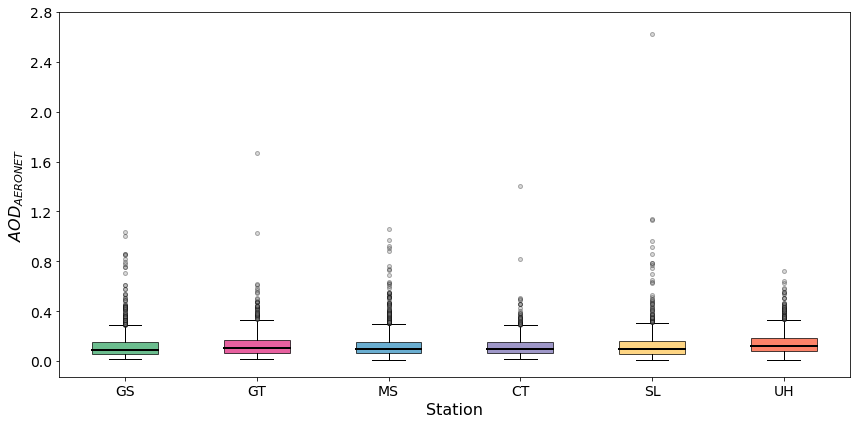

In [102]:
import os
import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime

dir_path_USA = "D:/Josefina/paper_git/paper_maiac/datasets/V02/aeronet/datasets_interp_s_L02/USA"
date_format_latam = '%d/%m/%Y %H:%M'
path = dir_path_USA
date_format = date_format_latam

# Diccionario para guardar los datos por ciudad
ciudades_data = {}

for file in os.listdir(path):
    if file.endswith('.csv'):
        data = pd.read_csv(os.path.join(path, file))

        # Procesar fecha
        data["Timestamp"] = pd.to_datetime(data["date"], format=date_format)
        data.set_index("Timestamp", inplace=True)

        # Resampleo diario
        data_mean = data['aod_550'].resample('1D').mean()
        data_mean_period = data_mean['2015-01-01':'2022-12-31']

        # Extraer estación del nombre del archivo (ej: "_gs_", "_gt_")
        parts = file.lower().split("_")
        estacion = None
        for part in parts:
            if part in ["gs", "gt", "ms", "ct", "sl", "uh"]:
                estacion = part.upper()
                break

        if estacion:
            if estacion not in ciudades_data:
                ciudades_data[estacion] = []
            ciudades_data[estacion].extend(data_mean_period.dropna().tolist())

# Estaciones y colores definidos
labels = ["GS", "GT", "MS", "CT", "SL", "UH"]
colores = ["#2ca25f", "#dd1c77", "#2b8cbe", "#756bb1", "#fec44f", "#fc4e2a"]

# Filtrar etiquetas que sí están en el diccionario
labels_filtrados = [ciudad for ciudad in labels if ciudad in ciudades_data]
colores_filtrados = [colores[i] for i, ciudad in enumerate(labels) if ciudad in ciudades_data]

# Datos para el boxplot
data_box = [ciudades_data[ciudad] for ciudad in labels_filtrados]

# Crear el boxplot con propiedades de outliers personalizadas
plt.figure(figsize=(12, 6))
flierprops = dict(marker='o', markerfacecolor='gray', markersize=4, linestyle='none', alpha=0.3)
box = plt.boxplot(data_box, labels=labels_filtrados, patch_artist=True, flierprops=flierprops)

# Aplicar colores a las cajas
for patch, color in zip(box['boxes'], colores_filtrados):
    patch.set_facecolor(color)
    patch.set_alpha(0.7)
    patch.set_edgecolor("black")

# Colores a las líneas de la mediana
for median in box['medians']:
    median.set_color('black')
    median.set_linewidth(2)
plt.xticks(fontsize=14)
plt.yticks(np.arange(0, 3.1, 0.4), fontsize=14)
plt.xlabel("Station", size=16)
plt.ylabel(r'$AOD_{AERONET}$', size=16)
plt.grid(False)
plt.tight_layout()
plt.show()


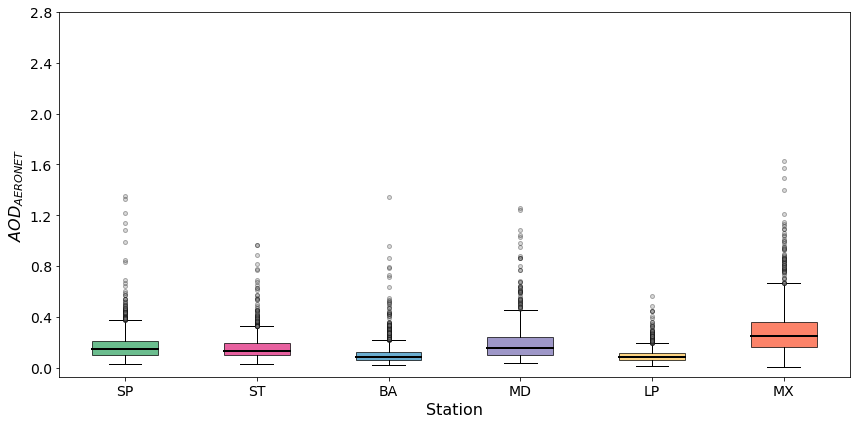

In [18]:
import os
import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime

dir_path_USA = "D:/Josefina/paper_git/paper_maiac/datasets/V03/aeronet/datasets_interp_s_L02/Latam"
# date_format_latam = '%Y-%m-%d %H:%M'#:%S
date_format_latam = '%d/%m/%Y %H:%M'#:%S
path = dir_path_USA
date_format = date_format_latam

# Diccionario para guardar los datos por ciudad
ciudades_data = {}

for file in os.listdir(path):
    if file.endswith('.csv'):
        data = pd.read_csv(os.path.join(path, file))

        # Procesar fecha
        data["Timestamp"] = pd.to_datetime(data["date"], format=date_format)
        data.set_index("Timestamp", inplace=True)

        # Resampleo diario
        data_mean = data['aod_550'].resample('1D').mean()
        data_mean_period = data_mean['2015-01-01':'2022-12-31']

        # Extraer estación del nombre del archivo (ej: "_gs_", "_gt_")
        parts = file.lower().split("_")
        estacion = None
        for part in parts:
#             if part in ["gs", "gt", "ms", "ct", "sl", "uh"]:
              if part in ["sp", "st", "ba", "md", "lp", "mx"]:
                estacion = part.upper()
                break

        if estacion:
            if estacion not in ciudades_data:
                ciudades_data[estacion] = []
            ciudades_data[estacion].extend(data_mean_period.dropna().tolist())

# Estaciones y colores definidos
labels = ["SP", "ST", "BA", "MD", "LP", "MX"]
colores = ["#2ca25f", "#dd1c77", "#2b8cbe", "#756bb1", "#fec44f", "#fc4e2a"]

# Filtrar etiquetas que sí están en el diccionario
labels_filtrados = [ciudad for ciudad in labels if ciudad in ciudades_data]
colores_filtrados = [colores[i] for i, ciudad in enumerate(labels) if ciudad in ciudades_data]

# Datos para el boxplot
data_box = [ciudades_data[ciudad] for ciudad in labels_filtrados]

# Crear el boxplot con propiedades de outliers personalizadas
plt.figure(figsize=(12, 6))
flierprops = dict(marker='o', markerfacecolor='gray', markersize=4, linestyle='none', alpha=0.3)
box = plt.boxplot(data_box, labels=labels_filtrados, patch_artist=True, flierprops=flierprops)

# Aplicar colores a las cajas
for patch, color in zip(box['boxes'], colores_filtrados):
    patch.set_facecolor(color)
    patch.set_alpha(0.7)
    patch.set_edgecolor("black")

# Colores a las líneas de la mediana
for median in box['medians']:
    median.set_color('black')
    median.set_linewidth(2)
plt.xticks(fontsize=14)
plt.yticks(np.arange(0, 3.1, 0.4), fontsize=14)
plt.xlabel("Station", size=16)
plt.ylabel(r'$AOD_{AERONET}$', size=16)
plt.grid(False)
plt.tight_layout()
plt.show()


0.1692083314989659
0.09274596203086799
0.08436053427082663
0.15122995864594488
0.06212967887208986
0.18438450129096076


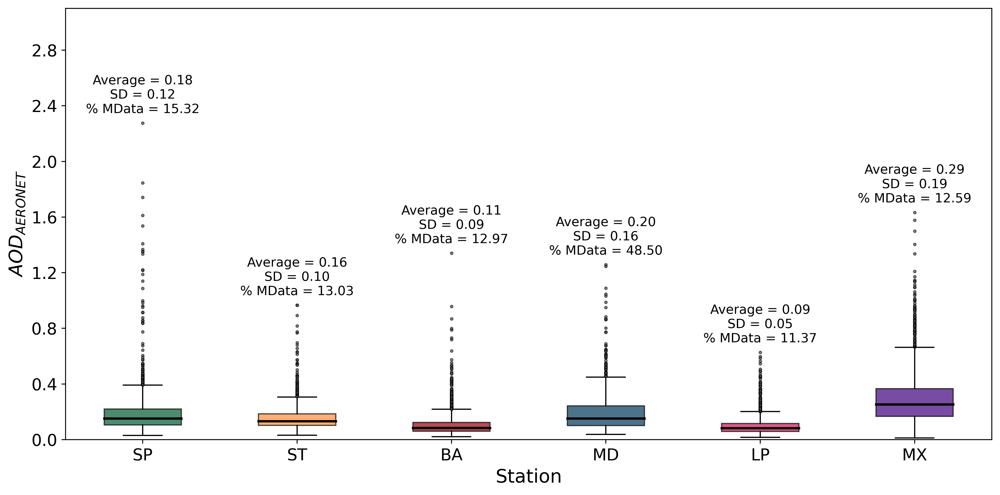

In [21]:
import os 
import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime
import numpy as np

dir_path_USA = "D:/Josefina/paper_git/paper_maiac/datasets/V03/aeronet/datasets_interp_s_L02/Latam"
# date_format_latam = '%Y-%m-%d %H:%M:%S'
date_format_latam = '%d/%m/%Y %H:%M'#:%S
path = dir_path_USA
date_format = date_format_latam

# Diccionario para guardar los datos por ciudad
ciudades_data = {}

for file in os.listdir(path):
    if file.endswith('.csv'):
        data = pd.read_csv(os.path.join(path, file))

        # Procesar fecha
        data["Timestamp"] = pd.to_datetime(data["date"], format=date_format)
        data.set_index("Timestamp", inplace=True)

        # Resampleo diario
                # Resampleo diario
        data_mean = data['aod_550_mod'].resample('1D').mean()
        data_mean_period = data_mean['2015-01-01':'2024-12-31']
        #print(np.mean(data_mean_period))
        print(np.std(data_mean_period))

        # Extraer estación del nombre del archivo
        parts = file.lower().split("_")
        estacion = None
        for part in parts:
            if part in ["sp", "st", "ba", "md", "lp", "mx"]:
                estacion = part.upper()
                break

        if estacion:
            if estacion not in ciudades_data:
                ciudades_data[estacion] = []
            ciudades_data[estacion].extend(data_mean_period.dropna().tolist())

# Estaciones y colores definidos
labels = ["SP", "ST", "BA", "MD", "LP", "MX"]
# colores = ["#2ca25f", "#dd1c77", "#2b8cbe", "#756bb1", "#fec44f", "#fc4e2a"]
colores = ["#005a32","#fd8d3c","#99000d","#023858","#ce1256","#3f007d"]
# Filtrar etiquetas que sí están en el diccionario
labels_filtrados = [ciudad for ciudad in labels if ciudad in ciudades_data]
colores_filtrados = [colores[i] for i, ciudad in enumerate(labels) if ciudad in ciudades_data]

# Datos para el boxplot
data_box = [ciudades_data[ciudad] for ciudad in labels_filtrados]

# Crear el boxplot con propiedades de outliers personalizadas
plt.figure(figsize=(12,6),dpi=400)
flierprops = dict(marker='o', markerfacecolor='gray', markersize=2, linestyle='none', alpha=0.6)
box = plt.boxplot(data_box, labels=labels_filtrados, patch_artist=True, flierprops=flierprops)

# Aplicar colores a las cajas
for patch, color in zip(box['boxes'], colores_filtrados):
    patch.set_facecolor(color)
    patch.set_alpha(0.7)
    patch.set_edgecolor("black")

# Colores a las líneas de la mediana
for median in box['medians']:
    median.set_color('black')
    median.set_linewidth(2)

# Texto personalizado con estadísticas en una posición más alta, ajustada a la altura máxima de cada boxplot
textos = [
    "Average = 0.18\nSD = 0.12\n% MData = 15.32",
    "Average = 0.16\nSD = 0.10\n% MData = 13.03",
    "Average = 0.11\nSD = 0.09\n% MData = 12.97",
    "Average = 0.20\nSD = 0.16\n% MData = 48.50",
    "Average = 0.09\nSD = 0.05\n% MData = 11.37",
    "Average = 0.29\nSD = 0.19\n% MData = 12.59"
]

# Ubicación dinámica del texto según el valor máximo de cada boxplot
for i, text in enumerate(textos[:len(labels_filtrados)]):
    max_y = max(ciudades_data[labels_filtrados[i]])  # Valor máximo en cada boxplot
    y_position = max_y + 0.2  # Colocamos el texto 0.2 por encima del máximo
    plt.text(i + 1, y_position, text, ha='center', va='center', fontsize=11, color="black")

# Ajustes para el gráfico
plt.xticks(fontsize=14)
plt.yticks(np.arange(0, 3.1, 0.4), fontsize=14)
plt.xlabel("Station", size=16)
plt.ylabel(r'$AOD_{AERONET}$', size=16)
plt.grid(False)

# Cambiar el límite inferior del eje Y a 0 para que el gráfico comience en 0
plt.ylim(0, 3.1)

plt.tight_layout()
plt.show()





0.12542156545446584
0.10110942593409451
0.1344772666310658
0.07734780187075058
0.14652406003015575
0.10488493491290415


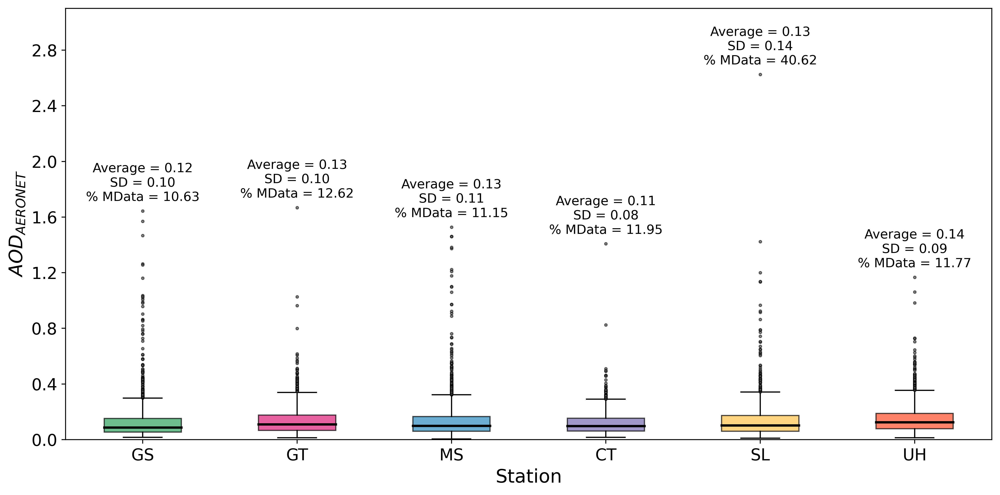

In [12]:
import os
import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime
import numpy as np

dir_path_USA = "D:/Josefina/paper_git/paper_maiac/datasets/V03/aeronet/datasets_interp_s_L02/USA"
date_format_latam = '%d/%m/%Y %H:%M'
path = dir_path_USA
date_format = date_format_latam

# Diccionario para guardar los datos por ciudad
ciudades_data = {}

for file in os.listdir(path):
    if file.endswith('.csv'):
        data = pd.read_csv(os.path.join(path, file))

        # Procesar fecha
        data["Timestamp"] = pd.to_datetime(data["date"], format=date_format)
        data.set_index("Timestamp", inplace=True)

        # Resampleo diario
        data_mean = data['aod_550_mod'].resample('1D').mean()
        data_mean_period = data_mean['2015-01-01':'2024-12-31']
#         print(np.mean(data_mean_period))
        print(np.std(data_mean_period))

        # Extraer estación del nombre del archivo
        parts = file.lower().split("_")
        estacion = None
        for part in parts:
            if part in ["gs", "gt", "ms", "ct", "sl", "uh"]:
                estacion = part.upper()
                break

        if estacion:
            if estacion not in ciudades_data:
                ciudades_data[estacion] = []
            ciudades_data[estacion].extend(data_mean_period.dropna().tolist())

# Estaciones y colores definidos
labels = ["GS", "GT", "MS", "CT", "SL", "UH"]
colores = ["#2ca25f", "#dd1c77", "#2b8cbe", "#756bb1", "#fec44f", "#fc4e2a"]

# Filtrar etiquetas que sí están en el diccionario
labels_filtrados = [ciudad for ciudad in labels if ciudad in ciudades_data]
colores_filtrados = [colores[i] for i, ciudad in enumerate(labels) if ciudad in ciudades_data]

# Datos para el boxplot
data_box = [ciudades_data[ciudad] for ciudad in labels_filtrados]

# Crear el boxplot con propiedades de outliers personalizadas
plt.figure(figsize=(12,6),dpi=400)
flierprops = dict(marker='o', markerfacecolor='gray', markersize=2, linestyle='none', alpha=0.6)
box = plt.boxplot(data_box, labels=labels_filtrados, patch_artist=True, flierprops=flierprops)

# Aplicar colores a las cajas
for patch, color in zip(box['boxes'], colores_filtrados):
    patch.set_facecolor(color)
    patch.set_alpha(0.7)
    patch.set_edgecolor("black")

# Colores a las líneas de la mediana
for median in box['medians']:
    median.set_color('black')
    median.set_linewidth(2)

# Texto personalizado con estadísticas en una posición más alta, ajustada a la altura máxima de cada boxplot
textos = [
    "Average = 0.12\nSD = 0.10\n% MData = 10.63",
    "Average = 0.13\nSD = 0.10\n% MData = 12.62",
    "Average = 0.13\nSD = 0.11\n% MData = 11.15",
    "Average = 0.11\nSD = 0.08\n% MData = 11.95",
    "Average = 0.13\nSD = 0.14\n% MData = 40.62",
    "Average = 0.14\nSD = 0.09\n% MData = 11.77"
]

# Ubicación dinámica del texto según el valor máximo de cada boxplot
for i, text in enumerate(textos[:len(labels_filtrados)]):
    max_y = max(ciudades_data[labels_filtrados[i]])  # Valor máximo en cada boxplot
    y_position = max_y + 0.2  # Colocamos el texto 0.2 por encima del máximo
    plt.text(i + 1, y_position, text, ha='center', va='center', fontsize=11, color="black")

# Ajustes para el gráfico
plt.xticks(fontsize=14)
plt.yticks(np.arange(0, 3.1, 0.4), fontsize=14)
plt.xlabel("Station", size=16)
plt.ylabel(r'$AOD_{AERONET}$', size=16)
plt.grid(False)

# Cambiar el límite inferior del eje Y a 0 para que el gráfico comience en 0
plt.ylim(0, 3.1)

plt.tight_layout()
plt.show()


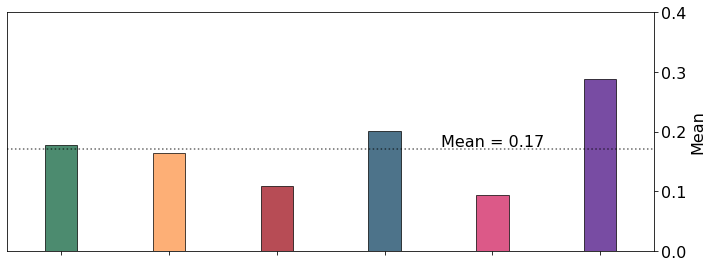

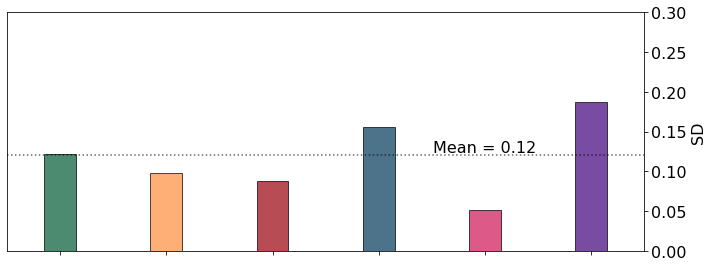

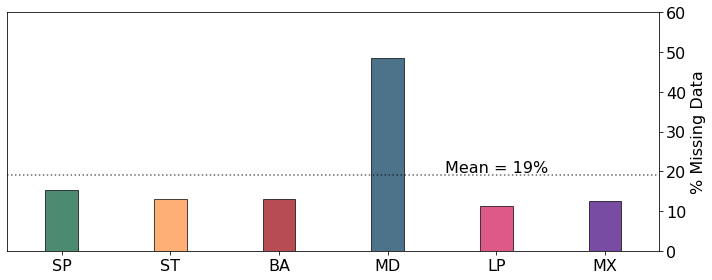

In [5]:
import os 
import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime
import numpy as np

# Ruta y formato de fecha
dir_path_USA = "D:/Josefina/paper_git/paper_maiac/datasets/V02/aeronet/datasets_interp_s_L02/Latam"
date_format_latam = '%Y-%m-%d %H:%M:%S'
path = dir_path_USA
date_format = date_format_latam

# Diccionario de datos por estación
ciudades_data = {}
missing_percentage = {}

# Período de análisis
start_date = '2015-01-01'
end_date = '2022-12-31'
total_days = pd.date_range(start=start_date, end=end_date, freq='D')

for file in os.listdir(path):
    if file.endswith('.csv'):
        data = pd.read_csv(os.path.join(path, file))
        data["Timestamp"] = pd.to_datetime(data["date"], format=date_format)
        data.set_index("Timestamp", inplace=True)
        
        data_mean = data['aod_550'].resample('1D').mean()
        data_mean_period = data_mean[start_date:end_date]

        parts = file.lower().split("_")
        estacion = next((part.upper() for part in parts if part in ["sp", "st", "ba", "md", "lp", "mx"]), None)

        if estacion:
            if estacion not in ciudades_data:
                ciudades_data[estacion] = []
            ciudades_data[estacion].extend(data_mean_period.dropna().tolist())

            # Calcular % de datos faltantes
            missing_count = total_days.shape[0] - data_mean_period.dropna().shape[0]
            missing_percentage[estacion] = 100 * missing_count / total_days.shape[0]

# Estaciones y colores
labels = ["SP", "ST", "BA", "MD", "LP", "MX"]
colores = ["#005a32", "#fd8d3c", "#99000d", "#023858", "#ce1256", "#3f007d"]
labels_filtrados = [ciudad for ciudad in labels if ciudad in ciudades_data]
colores_filtrados = [colores[i] for i, ciudad in enumerate(labels) if ciudad in ciudades_data]

# Calcular estadísticos
mean_vals = [np.mean(ciudades_data[ciudad]) for ciudad in labels_filtrados]
std_vals = [np.std(ciudades_data[ciudad]) for ciudad in labels_filtrados]
# missing_vals = [missing_percentage[ciudad] for ciudad in labels_filtrados]
missing_vals = [15.32,13.03,12.97,48.50,11.37,12.59]
labels_filtrados_blanco = [" ","","","", "",""]
# Gráfico único: Media
fig, ax = plt.subplots(figsize=(10, 4))

x = np.arange(len(labels_filtrados))

# Barra de medias (ajustando el ancho de la barra)
ax.bar(x, mean_vals, color=colores_filtrados, edgecolor='black', alpha=0.7, width=0.3)  # Ancho de barra más angosto
ax.axhline(y=0.17, color="black", linewidth=1.5, alpha=0.6, linestyle=':')
ax.text(len(x)-2, 0.17, 'Mean = 0.17', ha='center', va='bottom', fontsize=16)
ax.set_ylabel("Mean", fontsize=16)
ax.set_ylim(0, 0.40)  # max(mean_vals) * 1.3

# Etiquetas en el eje X
ax.set_xticks(x)
ax.set_xticklabels(labels_filtrados_blanco, fontsize=16)  # Aumento del tamaño de letra de los ticks en el eje X

# Eje Y a la derecha
ax.yaxis.tick_right()
ax.yaxis.set_label_position("right")

# Estética
ax.tick_params(axis='y', labelsize=16)
ax.grid(False)
ax.set_xlim(-0.5, len(labels_filtrados) - 0.5)

plt.tight_layout()
plt.show()

###############

# Gráfico único: Desviación estándar
fig, ax = plt.subplots(figsize=(10, 4))

# Barra de medias (ajustando el ancho de la barra)
ax.bar(x, std_vals, color=colores_filtrados, edgecolor='black', alpha=0.7, width=0.3)  # Ancho de barra más angosto
ax.axhline(y=0.12, color="black", linewidth=1.5, alpha=0.6, linestyle=':')
ax.text(len(x)-2, 0.12, 'Mean = 0.12', ha='center', va='bottom', fontsize=16)
ax.set_ylabel("SD", fontsize=16)
ax.set_ylim(0, 0.30)  # max(mean_vals) * 1.3

# Etiquetas en el eje X
ax.set_xticks(x)
# ax.set_xticklabels(labels_filtrados, fontsize=14)  # Aumento del tamaño de letra de los ticks en el eje X
ax.set_xticklabels(labels_filtrados_blanco, fontsize=16)  # Aumento del tamaño de letra de los ticks en el eje X
# Eje Y a la derecha
ax.yaxis.tick_right()
ax.yaxis.set_label_position("right")

# Estética
ax.tick_params(axis='y', labelsize=16)
ax.grid(False)
ax.set_xlim(-0.5, len(labels_filtrados) - 0.5)

plt.tight_layout()
plt.show()

###############

# Gráfico único: Porcentaje de datos faltantes
fig, ax = plt.subplots(figsize=(10, 4))

# Barra de medias (ajustando el ancho de la barra)
ax.bar(x, missing_vals, color=colores_filtrados, edgecolor='black', alpha=0.7, width=0.3)  # Ancho de barra más angosto
ax.axhline(y=19, color="black", linewidth=1.5, alpha=0.6, linestyle=':')
ax.text(len(x)-2, 19, 'Mean = 19%', ha='center', va='bottom', fontsize=16)
ax.set_ylabel("% Missing Data", fontsize=16)
ax.set_ylim(0, 60)  # max(mean_vals) * 1.3

# Etiquetas en el eje X
ax.set_xticks(x)
ax.set_xticklabels(labels_filtrados, fontsize=16)  # Aumento del tamaño de letra de los ticks en el eje X

# Eje Y a la derecha
ax.yaxis.tick_right()
ax.yaxis.set_label_position("right")

# Estética
ax.tick_params(axis='y', labelsize=16)
ax.grid(False)
ax.set_xlim(-0.5, len(labels_filtrados) - 0.5)

plt.tight_layout()
plt.show()


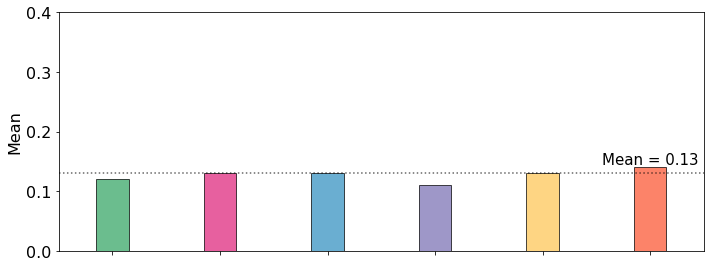

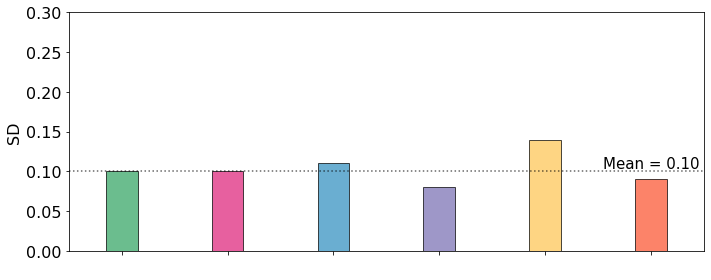

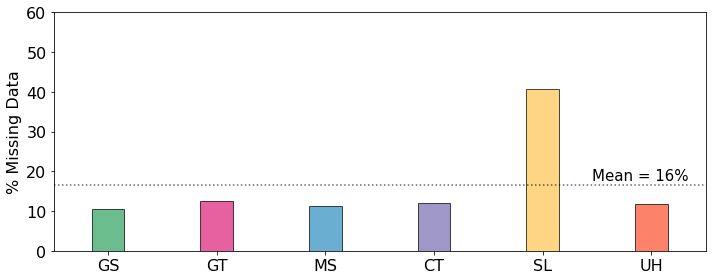

In [2]:
import os 
import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime
import numpy as np

# Estaciones y colores
labels = ["GS", "GT", "MS", "CT", "SL", "UH"]
colores = ["#2ca25f", "#dd1c77", "#2b8cbe", "#756bb1", "#fec44f", "#fc4e2a"]
x = np.arange(len(labels))
labels_filtrados_blanco = [" ","","","", "",""]
# Valores para cada métrica
average_values = [0.12, 0.13, 0.13, 0.11, 0.13, 0.14]
std_values = [0.1, 0.1, 0.11, 0.08, 0.14, 0.09]
missing_values = [10.63, 12.62, 11.15, 11.95, 40.62, 11.77]

# Gráfico único: Media
fig, ax = plt.subplots(figsize=(10, 4))

x = np.arange(len(labels))

# Barra de medias (ajustando el ancho de barra)
ax.bar(x, average_values, color=colores, edgecolor='black', alpha=0.7, width=0.3)  # Ancho de barra más angosto
ax.axhline(y=0.13, color="black", linewidth=1.5, alpha=0.6, linestyle=':')
ax.text(len(x)-1, 0.14, 'Mean = 0.13', ha='center', va='bottom', fontsize=15)
ax.set_ylabel("Mean", fontsize=16)
ax.set_ylim(0, 0.40)  # max(mean_vals) * 1.3)

# Etiquetas en el eje X (aumentando el tamaño de letra)
ax.set_xticks(x)
ax.set_xticklabels(labels_filtrados_blanco, fontsize=16)  # Aumento del tamaño de letra de los ticks en el eje X

# Eje Y a la izquierda (por defecto)
# ax.yaxis.tick_right()  # Elimina esta línea para que el eje Y esté en el lado izquierdo

# Estética
ax.tick_params(axis='y', labelsize=16)
ax.grid(False)
ax.set_xlim(-0.5, len(labels) - 0.5)

plt.tight_layout()
plt.show()

###############

# Gráfico único: SD (desviación estándar)
fig, ax = plt.subplots(figsize=(10, 4))

# Barra de medias (ajustando el ancho de barra)
ax.bar(x, std_values, color=colores, edgecolor='black', alpha=0.7, width=0.3)  # Ancho de barra más angosto
ax.axhline(y=0.10, color="black", linewidth=1.5, alpha=0.6, linestyle=':')
ax.text(len(x)-1, 0.10, 'Mean = 0.10', ha='center', va='bottom', fontsize=15)
ax.set_ylabel("SD", fontsize=16)
ax.set_ylim(0, 0.30)  # max(mean_vals) * 1.3)

# Etiquetas en el eje X (aumentando el tamaño de letra)
ax.set_xticks(x)
ax.set_xticklabels(labels_filtrados_blanco, fontsize=16)  # Aumento del tamaño de letra de los ticks en el eje X

# Eje Y a la izquierda
# ax.yaxis.tick_right()  # Elimina esta línea

# Estética
ax.tick_params(axis='y', labelsize=16)
ax.grid(False)
ax.set_xlim(-0.5, len(labels) - 0.5)

plt.tight_layout()
plt.show()

###############

# Gráfico único: % Missing Data
fig, ax = plt.subplots(figsize=(10, 4))

# Barra de medias (ajustando el ancho de barra)
ax.bar(x, missing_values, color=colores, edgecolor='black', alpha=0.7, width=0.3)  # Ancho de barra más angosto
ax.axhline(y=16.46, color="black", linewidth=1.5, alpha=0.6, linestyle=':')
ax.text(len(x)-1.1, 17, 'Mean = 16%', ha='center', va='bottom', fontsize=15)
ax.set_ylabel("% Missing Data", fontsize=16)
ax.set_ylim(0, 60)  # max(mean_vals) * 1.3)

# Etiquetas en el eje X (aumentando el tamaño de letra)
ax.set_xticks(x)
ax.set_xticklabels(labels, fontsize=16)  # Aumento del tamaño de letra de los ticks en el eje X

# Eje Y a la izquierda
# ax.yaxis.tick_right()  # Elimina esta línea

# Estética
ax.tick_params(axis='y', labelsize=16)
ax.grid(False)
ax.set_xlim(-0.5, len(labels) - 0.5)

plt.tight_layout()
plt.show()



### reu latam vs EEUU


In [9]:
def REU_list(DF, Pollutant, Units, Lambda = 1, u_xi = 0.0):
    '''This function allows us to calculate the relative expanded uncertainty
    Variables:
    DF: It is a dataframe with the satellite AOD values (MAIAC and MODIS) and the AERONET reference AOD
    Pollutant: name of the reference pollutant, in our case AERONET
    Units: name of the variables we want to analyze. In our case MAIAC and MODIS
    '''
    
    #NOTE: Sigma_err_x (NILU notation) is the same as u_xi (GDE2010 notation)
    Sigma_err_x = u_xi
    # These are lists where I will save the different results
    list_u = []
    list_reu = []
    list_bias = []
    list_noise = []
    list_reux = []
    list_biasx = []
    list_noisex = []
    list_verificacion = []
  
    # The UNITS are covered, that is, the pollutant to be analyzed. In our case MAIAC and MODIS
    for Unit in Units:
        x = DF[Pollutant] #AERONET
        y = DF[Unit] # Pollutant
        
        #Masking the NaN's
        mask = ~np.isnan(x) & ~np.isnan(y)
        x = x[mask]
        y = y[mask]
        n = len(x)
        
        #Slope & Intercept usando REGRESION LINEAL (LR)
        slope, intercept, r, p, stderr = scipy.stats.linregress(x[mask], y[mask])
        b1 = slope
        b0 = intercept
        
        #Equation error variance for y = b0 + b1*x + v_i

        rss = (y - b0 - b1*x)**2
        RSS = rss.values.sum()
        Sigma_v_sqr = RSS/(n-2)
                
        #Error variance due to the deviation of the 1:1 line
        ec = (b0 + (b1 - 1)*x)**2
        ran = Sigma_v_sqr - Sigma_err_x**2
        
        #Results
        
        U = ((ran + ec)**(1/2))
        
        REU = ((2*100)/y)*U
        
        bias = ((((2*100)/y)**2)*ec)**(1/2)
        
        noise = ((((2*100)/y)**2)*ran)**(1/2)
        
        verificacion = ((bias**2 + noise**2)**(1/2))
        verificacion_u = ((bias**2 + noise**2)**(1/2))/((2*100)/y)
        
        REUx = 2*U*100/x
        
        biasx = ((((2*100)/x)**2)*ec)**(1/2)
        
        noisex = ((((2*100)/x)**2)*ran)**(1/2)
        
        #The results are each placed in a separate list
        list_u.append(U)
        list_reu.append(REU)
        list_bias.append(bias)
        list_noise.append(noise)
        list_verificacion.append(verificacion)
        list_reux.append(REUx)
        list_biasx.append(biasx)
        list_noisex.append(noisex)
    
    # The generated lists are concatenated
    U = pd.concat(list_u, axis=1)
    Col_Names=[]
    for i in Units:
        i = 'U_'+ i
        Col_Names.append(i)
    U.columns = Col_Names
    U.rename_axis("Timestamp", axis='index', inplace=True)
    
    REU = pd.concat(list_reu, axis=1)
    Col_Names=[]
    for i in Units:
        i = 'REU_'+ i
        Col_Names.append(i)
    REU.columns = Col_Names
    REU.rename_axis("Timestamp", axis='index', inplace=True)
    
    bias = pd.concat(list_bias, axis=1)
    Col_Names=[]
    for i in Units:
        i = 'b_'+ i
        Col_Names.append(i)
    bias.columns = Col_Names
    bias.rename_axis("Timestamp", axis='index', inplace=True)
    
    noise = pd.concat(list_noise, axis=1)
    Col_Names=[]
    for i in Units:
        i = 'n_'+ i
        Col_Names.append(i)
    noise.columns = Col_Names
    noise.rename_axis("Timestamp", axis='index', inplace=True)
    
    verificacion = pd.concat(list_verificacion, axis =1 )
    Col_Names=[]
    for i in Units:
        i = 'verificacion_'+ i
        Col_Names.append(i)
    verificacion.columns = Col_Names
    verificacion.rename_axis("Timestamp", axis='index', inplace=True)
    
    REUx = pd.concat(list_reux, axis=1)
    Col_Names=[]
    for i in Units:
        i = 'REUx_'+ i
        Col_Names.append(i)
    REUx.columns = Col_Names
    REUx.rename_axis("Timestamp", axis='index', inplace=True)
    
    biasx = pd.concat(list_biasx, axis=1)
    Col_Names=[]
    for i in Units:
        i = 'bx_'+ i
        Col_Names.append(i)
    biasx.columns = Col_Names
    biasx.rename_axis("Timestamp", axis='index', inplace=True)
    
    noisex = pd.concat(list_noisex, axis=1)
    Col_Names=[]
    for i in Units:
        i = 'nx_'+ i
        Col_Names.append(i)
    noisex.columns = Col_Names
    noisex.rename_axis("Timestamp", axis='index', inplace=True)
    
   
    REUyx = pd.concat((DF[Pollutant], U, REU, bias, noise, REUx, biasx, noisex,verificacion), axis=1)#, 

    
    return REUyx


In [160]:
path = "D:/Josefina/paper_git/paper_maiac/datasets/V02/processed/merge_AER-MAIAC/USA_C61/dia/1km/1km60min_copy"
resolucion_espaciotemporal = "1KM-60MIN-TOT"
# def REU_list(DF, Pollutant, Units, Lambda = 1, u_xi = 0.0):
for p,files in enumerate(os.listdir(path)):
        N = len(os.listdir(path))
        data = pd.read_csv(os.path.join(path,files))
        #A column is created with the date called "Timestamp".
        #data["Timestamp"] = data["Date_MODIS"].apply(lambda x: datetime.strptime(x,date_format))
        #data["Timestamp"] = data["date"].apply(lambda x: datetime.strptime(x,date_format))
        #Becomes the index column
        #data.set_index('Timestamp', inplace = True)
        data_mean_period_len =len(data.dropna(how='all'))
        print(files)
        

        df_REUxy = REU_list(DF = data, Pollutant = 'AOD_550_AER_mean', 
        Units = ["AOD_550_maiac_mean"], 
        #Units = ["AOD_550_maiac"], 
        Lambda = 1, u_xi = 0.0)
        station_name = files [2:4]
        ID = files [0:1]
        df_REUxy['station'] = station_name
        df_REUxy['ID'] = ID
        file_name = f"0{ID}_{station_name}_REU.csv"
        full_path = os.path.join("D:/Josefina/paper_git/paper_maiac/datasets/V02/processed/final/REU/USA", file_name)
   
        df_REUxy.to_csv(full_path, index=False)

1_GS-1km-MAIAC-60-AER_MEAN_c61.csv
2_GT-1km-MAIAC-60-AER_MEAN_c61.csv
3_MS-1km-MAIAC-60-AER_MEAN_c61.csv
4_CT-1km-MAIAC-60-AER_MEAN_c61.csv
5_SL-1km-MAIAC-60-AER_MEAN_c61.csv
6_UH-1km-MAIAC-60-AER_MEAN_c61.csv


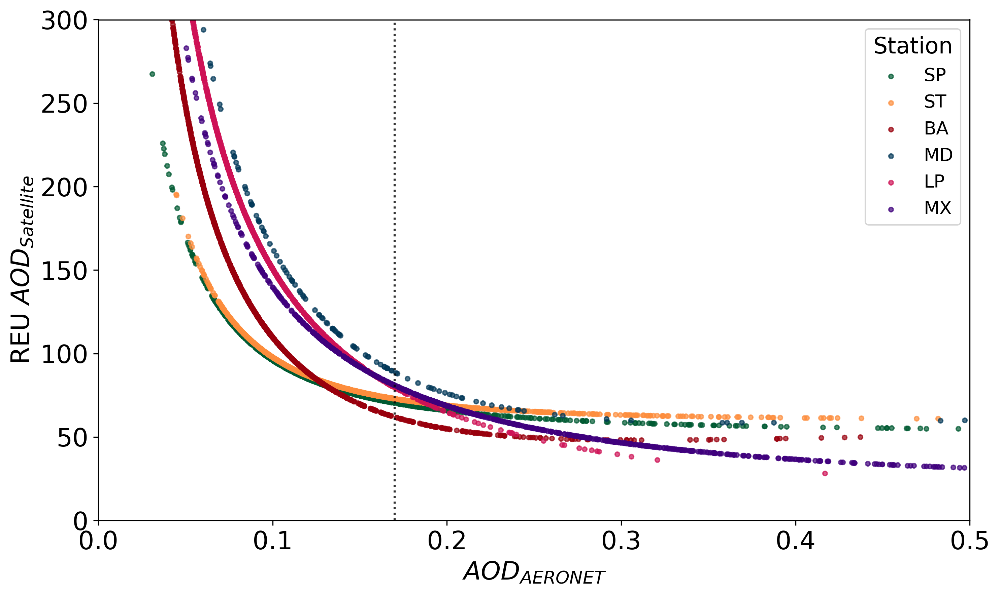

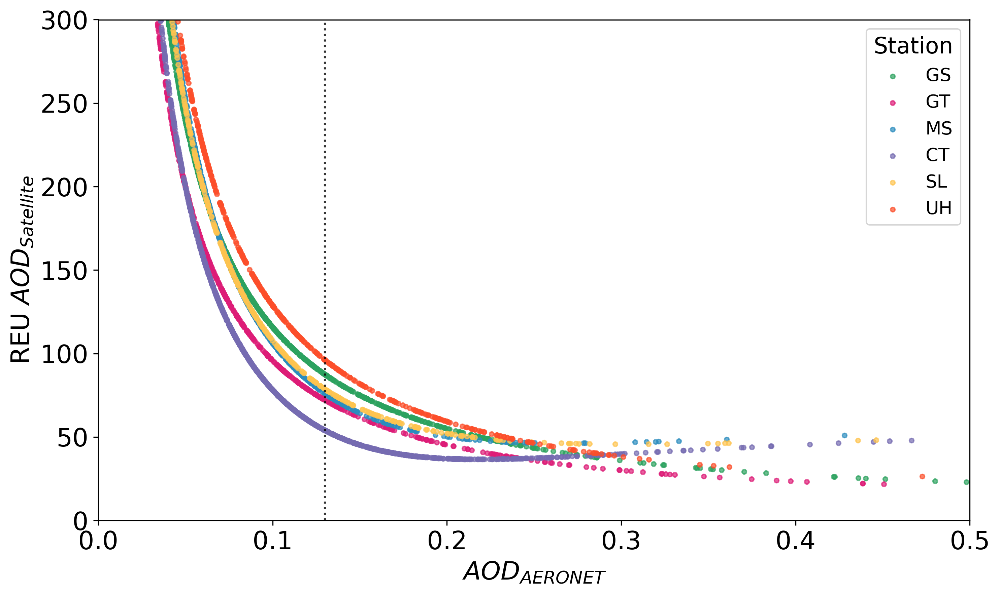

In [10]:
def REU_plot_unico(path, date_format, color_maiac, resolucion_espaciotemporal):
    '''
    Esta función genera un solo gráfico con todos los puntos REU vs Referencia
    para todas las estaciones.

    - path: carpeta con los CSVs
    - date_format: formato de fecha en la columna 'date'
    - color_maiac: lista de colores para diferenciar las estaciones
    '''
    plt.figure(figsize=(10, 6), dpi=300)
    listas_medias = [0.18,0.16,0.11,0.2,0.08,0.29]
    all_labels = []

    for p, files in enumerate(os.listdir(path)):
        data = pd.read_csv(os.path.join(path, files))
        data["Timestamp"] = data["date"].apply(lambda x: datetime.strptime(x, date_format))
        data.set_index('Timestamp', inplace=True)

        df_REUxy = REU_list(
            DF=data,
            Pollutant='AOD_550_AER_mean',
            Units=["AOD_550_maiac_mean"],
            Lambda=1,
            u_xi=0.0
        )

        x = df_REUxy["AOD_550_AER_mean"]
        y = df_REUxy["REUx_AOD_550_maiac_mean"]
        station_name = files[2:4]  # o poné el nombre como desees

        # Agregar scatter para esta estación
        plt.scatter(x, y, s=10, color=color_maiac[p], label=station_name, alpha=0.7)

        # Línea horizontal indicando REU en valor medio
#         x_intersec = listas_medias[p]
#         idx = (x - x_intersec).abs().idxmin()
#         y_intersec = y.loc[idx]
#         plt.hlines(y=y_intersec, xmin=0, xmax=1.2, color=color_maiac[p], linestyle='--', alpha=0.5)
    plt.vlines(x=0.17, ymin=0, ymax=300, color='black', linewidth=1.5, linestyle=':', alpha=0.8)
    plt.xlabel(r'$AOD_{AERONET}$',size=18)
    plt.ylabel(r'REU $AOD_{Satellite}$',size=18)
#     plt.title(resolucion_espaciotemporal, fontsize=14, fontweight='bold')
    plt.xlim(0, 0.5)
    plt.xticks(np.arange(0, 0.57, 0.1)) 
    plt.ylim(0, 300)
    plt.grid(False)
    plt.tick_params(axis='both', labelsize=18)
#     plt.legend(fontsize=30)
#     plt.legend(title="Station", loc='upper right', bbox_to_anchor=(1.15, 1))
    plt.legend(title="Station", loc='upper right', bbox_to_anchor=(1,1), fontsize=13, title_fontsize=16) # Cambia bbox_to_anchor según necesites
    plt.tight_layout()
    plt.show()

    
dir = "D:/Josefina/paper_git/paper_maiac/datasets/V02/processed/merge_AER-MAIAC/Latam_C61/dia/1km/1km60min_copy"
resolucion_espaciotemporal = "1KM-60MIN-TOT"
REU_plot_unico(path=dir,date_format='%d/%m/%Y',color_maiac = ["#005a32","#fd8d3c","#99000d","#023858","#ce1256","#3f007d"],resolucion_espaciotemporal=resolucion_espaciotemporal)



def REU_plot_unico(path, date_format, color_maiac, resolucion_espaciotemporal):
    '''
    Esta función genera un solo gráfico con todos los puntos REU vs Referencia
    para todas las estaciones.

    - path: carpeta con los CSVs
    - date_format: formato de fecha en la columna 'date'
    - color_maiac: lista de colores para diferenciar las estaciones
    '''
    plt.figure(figsize=(10, 6), dpi=300)
    listas_medias = [0.18,0.16,0.11,0.2,0.08,0.29]
    all_labels = []

    for p, files in enumerate(os.listdir(path)):
        data = pd.read_csv(os.path.join(path, files))
        data["Timestamp"] = data["date"].apply(lambda x: datetime.strptime(x, date_format))
        data.set_index('Timestamp', inplace=True)

        df_REUxy = REU_list(
            DF=data,
            Pollutant='AOD_550_AER_mean',
            Units=["AOD_550_maiac_mean"],
            Lambda=1,
            u_xi=0.0
        )

        x = df_REUxy["AOD_550_AER_mean"]
        y = df_REUxy["REUx_AOD_550_maiac_mean"]
        station_name = files[2:4]  # o poné el nombre como desees

        # Agregar scatter para esta estación
        plt.scatter(x, y, s=10, color=color_maiac[p], label=station_name, alpha=0.7)

        # Línea horizontal indicando REU en valor medio
#         x_intersec = listas_medias[p]
#         idx = (x - x_intersec).abs().idxmin()
#         y_intersec = y.loc[idx]
#         plt.hlines(y=y_intersec, xmin=0, xmax=1.2, color=color_maiac[p], linestyle='--', alpha=0.5)
    plt.vlines(x=0.13, ymin=0, ymax=300, color='black', linewidth=1.5, linestyle=':', alpha=0.8)

    plt.xlabel(r'$AOD_{AERONET}$',size=18)
    plt.ylabel(r'REU $AOD_{Satellite}$',size=18)
#     plt.title(resolucion_espaciotemporal, fontsize=14, fontweight='bold')
    plt.xlim(0, 0.5)
    plt.xticks(np.arange(0, 0.57, 0.1)) 
    plt.ylim(0, 300)
    plt.grid(False)
    plt.tick_params(axis='both', labelsize=18)
#     plt.legend(fontsize=30)
#     plt.legend(title="Station", loc='upper right', bbox_to_anchor=(1.15, 1))
    plt.legend(title="Station", loc='upper right', bbox_to_anchor=(1,1), fontsize=13, title_fontsize=16) # Cambia bbox_to_anchor según necesites
    plt.tight_layout()
    plt.show()

dir = "D:/Josefina/paper_git/paper_maiac/datasets/V02/processed/merge_AER-MAIAC/USA_C61/dia/1km/1km60min_copy"
resolucion_espaciotemporal = "1KM-60MIN-TOT"
REU_plot_unico(path=dir,date_format='%Y-%m-%d',color_maiac =["#2ca25f", "#dd1c77", "#2b8cbe", "#756bb1", "#fec44f", "#fc4e2a"],resolucion_espaciotemporal=resolucion_espaciotemporal)



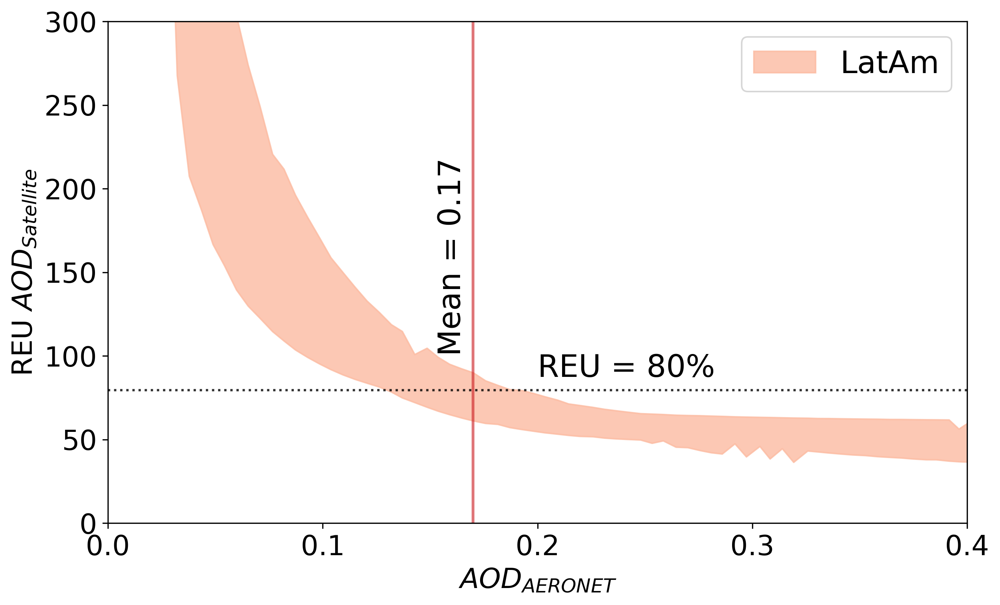

Intersección en x=0.17: y_min = 61.14, y_max = 89.93


In [4]:
df = data = pd.read_csv("D:/Josefina/paper_git/paper_maiac/datasets/V02/processed/final/REU/Latam/REU_TOT_Latam.csv")
#df = data = pd.read_csv("D:/Josefina/paper_git/paper_maiac/datasets/V02/processed/final/REU/USA/REU_TOT_USA_subt.csv")

import pandas as pd
import matplotlib.pyplot as plt
import numpy as np


x_intersec = 0.17#0.13#0.17#listas_medias[p] #0.18
    # Encontrar el índice más cercano a x=0.19
idx = (df["AOD_550_AER_mean"] - x_intersec).abs().idxmin()
y_intersec = df['REUx_AOD_550_maiac_mean'].loc[idx]

        


# Supongamos que tu DataFrame se llama df y ya contiene las columnas:
# 'AOD_550_AER_mean' y 'REUx_AOD_550_maiac_mean'

# Definir número de bins
num_bins =240

# Crear los bins
df['bin'] = pd.cut(df['AOD_550_AER_mean'], bins=num_bins)

# Calcular estadísticas por bin
df_bin_stats = df.groupby('bin').agg({
    'AOD_550_AER_mean': 'mean',
    'REUx_AOD_550_maiac_mean': ['mean', 'min', 'max']
}).dropna()

# Aplanar columnas
df_bin_stats.columns = ['x_mean', 'y_mean', 'y_min', 'y_max']
df_bin_stats = df_bin_stats.reset_index(drop=True)

# Plot
plt.figure(figsize=(10, 6), dpi=300)
# plt.plot(df_bin_stats['x_mean'], df_bin_stats['y_mean'], color='crimson', label='Curva suavizada (bin promedio)', linewidth=2)
plt.fill_between(df_bin_stats['x_mean'], df_bin_stats['y_min'], df_bin_stats['y_max'], 
               color="#fcbba1", alpha=0.8, label="LatAm")#'lightcoral'
#                  color='#9ecae1', alpha=0.8, label="EE.UU.")
# plt.axvline(x=0.13, color='#08306b', linewidth=1.8, alpha=0.6, linestyle='-')
# plt.text(0.12, 100, 'Mean = 0.13', ha='center', rotation=90, va='bottom', fontsize=20)

plt.axvline(x=0.17, color='#cb181d', linewidth=1.8, alpha=0.6, linestyle='-')
plt.text(0.16, 100, 'Mean = 0.17', ha='center', rotation=90, va='bottom', fontsize=20)

# plt.axvline(x=0.1, color='black', linewidth=2.5, alpha=0.6, linestyle='-')
plt.hlines(y=y_intersec, xmin=0, xmax=3.2, color='black', linewidth=1.5, linestyle=':', alpha=0.8)
plt.text(0.2, y_intersec + 8, f"REU = {y_intersec:.0f}%", color='black', fontsize=20)


plt.tick_params(axis='both', labelsize=18)
#  ax[0, 0].set_ylabel(r'REU $AOD_{Satellite}$',size=12)    ax[1, 0].set_xlabel(r'$AOD_{AERONET}$',size=12)
plt.xlabel(r'$AOD_{AERONET}$',size=18)
plt.ylabel(r'REU $AOD_{Satellite}$',size=18)
# plt.title(resolucion_espaciotemporal, fontsize=14, fontweight='bold')
plt.xlim(0, 0.4)
plt.xticks(np.arange(0, 0.47, 0.1)) 
plt.ylim(0, 300)
plt.grid(False)#, linestyle="--", alpha=0.3)
plt.legend(fontsize=20)
# plt.tight_layout()
plt.show()

from scipy.interpolate import interp1d

# Crear funciones de interpolación para y_min y y_max en función de x
interp_y_min = interp1d(df_bin_stats['x_mean'], df_bin_stats['y_min'], bounds_error=False)
interp_y_max = interp1d(df_bin_stats['x_mean'], df_bin_stats['y_max'], bounds_error=False)

# Evaluar en x = 0.13
y_min_intersec = float(interp_y_min(x_intersec))
y_max_intersec = float(interp_y_max(x_intersec))

print(f"Intersección en x=0.17: y_min = {y_min_intersec:.2f}, y_max = {y_max_intersec:.2f}")



### MODIS VS MAIAC

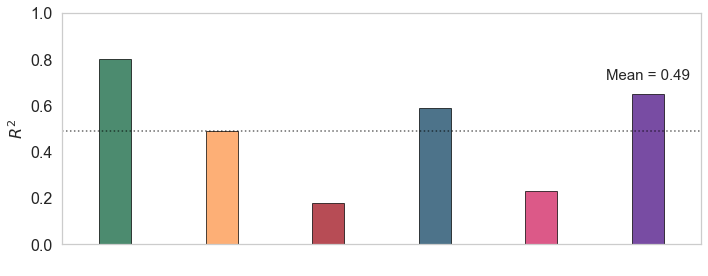

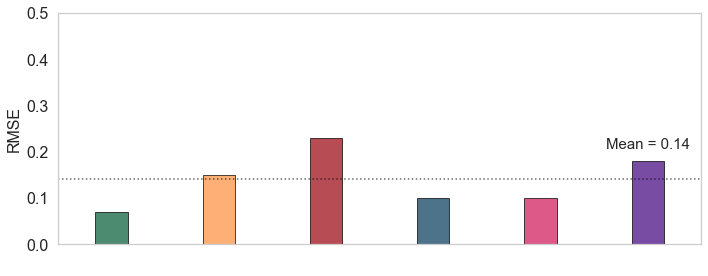

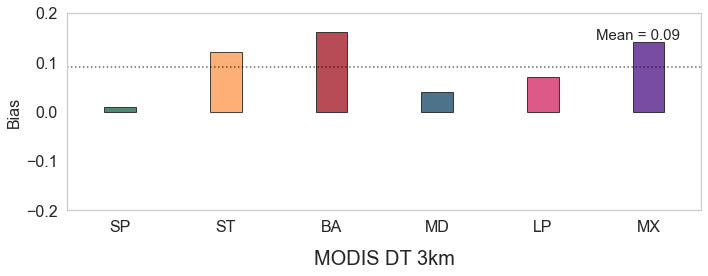

In [234]:
import os 
import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime
import numpy as np

# Estaciones y colores
labels = ["SP", "ST", "BA", "MD", "LP", "MX"]
# colores = ["#2ca25f", "#dd1c77", "#2b8cbe", "#756bb1", "#fec44f", "#fc4e2a"]
colores = ["#005a32","#fd8d3c","#99000d","#023858","#ce1256","#3f007d"]
x = np.arange(len(labels))
labels_filtrados_blanco = [" ","","","", "",""]
# Valores para cada métrica
R2_MODIS = [0.8,0.49,0.18,0.59,0.23,0.65]
RMSE_MODIS= [0.07,0.15,0.23,0.1,0.1,0.18]
BIAS_MODIS= [0.01,0.12,0.16,0.04,0.07, 0.14]

R2_MAIAC = [0.81,0.75,0.35, 0.5, 0.25, 0.67]
RMSE_MAIAC= [0.07, 0.06, 0.06, 0.09, 0.07,0.08]
BIAS_MAIAC= [-0.04, 0.04, 0.02, 0.01, 0.03, -0.01]



# Gráfico único: Media
fig, ax = plt.subplots(figsize=(10, 4))

x = np.arange(len(labels))

# Barra de medias (ajustando el ancho de barra)
ax.bar(x, R2_MODIS, color=colores, edgecolor='black', alpha=0.7, width=0.3)  # Ancho de barra más angosto
ax.axhline(y=0.49, color="black", linewidth=1.5, alpha=0.6, linestyle=':')
ax.text(len(x)-1, 0.7, 'Mean = 0.49', ha='center', va='bottom', fontsize=15)
ax.set_ylabel(r'$R^{2}$', fontsize=16)
ax.set_ylim(0, 1)  # max(mean_vals) * 1.3)

# Etiquetas en el eje X (aumentando el tamaño de letra)
ax.set_xticks(x)
ax.set_xticklabels(labels_filtrados_blanco, fontsize=16)  # Aumento del tamaño de letra de los ticks en el eje X

# Eje Y a la izquierda (por defecto)
# ax.yaxis.tick_right()  # Elimina esta línea para que el eje Y esté en el lado izquierdo

# Estética
ax.tick_params(axis='y', labelsize=16)
ax.grid(False)
ax.set_xlim(-0.5, len(labels) - 0.5)

plt.tight_layout()
plt.show()

###############

# Gráfico único: SD (desviación estándar)
fig, ax = plt.subplots(figsize=(10, 4))

# Barra de medias (ajustando el ancho de barra)
ax.bar(x, RMSE_MODIS, color=colores, edgecolor='black', alpha=0.7, width=0.3)  # Ancho de barra más angosto
ax.axhline(y=0.14, color="black", linewidth=1.5, alpha=0.6, linestyle=':')
ax.text(len(x)-1, 0.2, 'Mean = 0.14', ha='center', va='bottom', fontsize=15)
ax.set_ylabel("RMSE", fontsize=16)
ax.set_ylim(0, 0.50)  # max(mean_vals) * 1.3)

# Etiquetas en el eje X (aumentando el tamaño de letra)
ax.set_xticks(x)
ax.set_xticklabels(labels_filtrados_blanco, fontsize=16)  # Aumento del tamaño de letra de los ticks en el eje X

# Eje Y a la izquierda
# ax.yaxis.tick_right()  # Elimina esta línea

# Estética
ax.tick_params(axis='y', labelsize=16)
ax.grid(False)
ax.set_xlim(-0.5, len(labels) - 0.5)

plt.tight_layout()
plt.show()

###############

# Gráfico único: % Missing Data
fig, ax = plt.subplots(figsize=(10, 4))

# Barra de medias (ajustando el ancho de barra)
ax.bar(x, BIAS_MODIS, color=colores, edgecolor='black', alpha=0.7, width=0.3)  # Ancho de barra más angosto
ax.axhline(y=0.09, color="black", linewidth=1.5, alpha=0.6, linestyle=':')
ax.text(len(x)-1.1, 0.14, 'Mean = 0.09', ha='center', va='bottom', fontsize=15)
ax.set_ylabel("Bias", fontsize=16)
ax.set_ylim(-0.2, 0.2)  # max(mean_vals) * 1.3)
ax.set_xlabel("MODIS DT 3km", fontsize=20, labelpad=15)
# Etiquetas en el eje X (aumentando el tamaño de letra)
ax.set_xticks(x)
ax.set_xticklabels(labels, fontsize=16)  # Aumento del tamaño de letra de los ticks en el eje X

# Eje Y a la izquierda
# ax.yaxis.tick_right()  # Elimina esta línea

# Estética
ax.tick_params(axis='y', labelsize=16)
ax.grid(False)
ax.set_xlim(-0.5, len(labels) - 0.5)

plt.tight_layout()
plt.show()



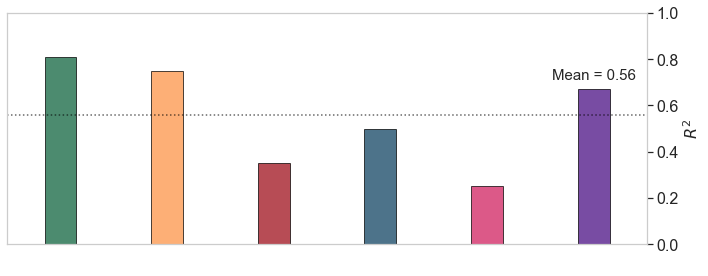

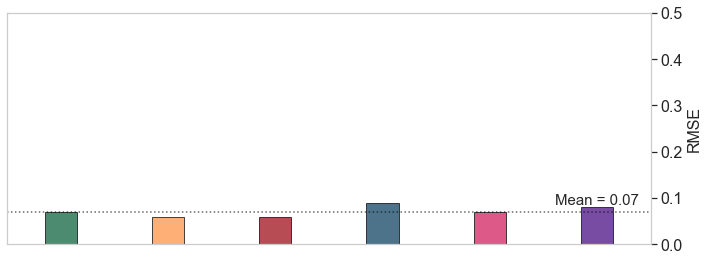

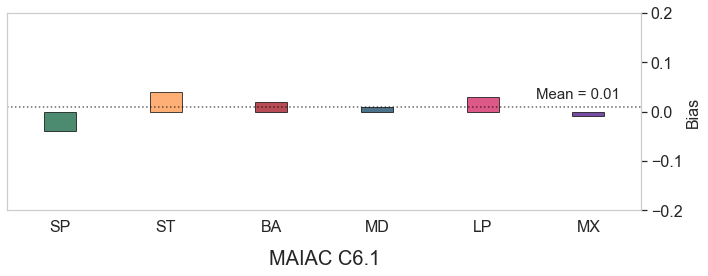

In [233]:
import numpy as np
import matplotlib.pyplot as plt

# Estaciones y colores
labels = ["SP", "ST", "BA", "MD", "LP", "MX"]
colores = ["#005a32", "#fd8d3c", "#99000d", "#023858", "#ce1256", "#3f007d"]
x = np.arange(len(labels))
labels_filtrados_blanco = [" ", " ", " ", " ", " ", " "]

# Valores para cada métrica
R2_MAIAC = [0.81,0.75,0.35, 0.5, 0.25, 0.67]
RMSE_MAIAC= [0.07, 0.06, 0.06, 0.09, 0.07,0.08]
BIAS_MAIAC= [-0.04, 0.04, 0.02, 0.01, 0.03, -0.01]


# --- Gráfico R² ---
fig, ax = plt.subplots(figsize=(10, 4))
ax.bar(x, R2_MAIAC, color=colores, edgecolor='black', alpha=0.7, width=0.3)
ax.axhline(y=0.56, color="black", linewidth=1.5, alpha=0.6, linestyle=':')
ax.text(len(x)-1, 0.7, 'Mean = 0.56', ha='center', va='bottom', fontsize=15)
ax.set_ylabel(r'$R^{2}$', fontsize=16)
ax.set_ylim(0, 1)
ax.set_xticks(x)
ax.set_xticklabels(labels_filtrados_blanco, fontsize=16)

# Eje Y a la derecha
ax.yaxis.tick_right()
ax.yaxis.set_label_position("right")

ax.tick_params(axis='y', labelsize=16)
ax.grid(False)
ax.set_xlim(-0.5, len(labels) - 0.5)
plt.tight_layout()
plt.show()


# --- Gráfico RMSE ---
fig, ax = plt.subplots(figsize=(10, 4))
ax.bar(x, RMSE_MAIAC, color=colores, edgecolor='black', alpha=0.7, width=0.3)
ax.axhline(y=0.07, color="black", linewidth=1.5, alpha=0.6, linestyle=':')
ax.text(len(x)-1, 0.08, 'Mean = 0.07', ha='center', va='bottom', fontsize=15)
ax.set_ylabel("RMSE", fontsize=16)
ax.set_ylim(0, 0.50)
ax.set_xticks(x)
ax.set_xticklabels(labels_filtrados_blanco, fontsize=16)

# Eje Y a la derecha
ax.yaxis.tick_right()
ax.yaxis.set_label_position("right")

ax.tick_params(axis='y', labelsize=16)
ax.grid(False)
ax.set_xlim(-0.5, len(labels) - 0.5)
plt.tight_layout()
plt.show()


# --- Gráfico Bias ---
fig, ax = plt.subplots(figsize=(10, 4))
ax.bar(x, BIAS_MAIAC, color=colores, edgecolor='black', alpha=0.7, width=0.3)
ax.axhline(y=0.01, color="black", linewidth=1.5, alpha=0.6, linestyle=':')
ax.text(len(x)-1.1, 0.02, 'Mean = 0.01', ha='center', va='bottom', fontsize=15)
ax.set_ylabel("Bias", fontsize=16)
ax.set_ylim(-0.2, 0.2)
ax.set_xticks(x)
ax.set_xticklabels(labels, fontsize=16)
ax.set_xlabel("MAIAC C6.1", fontsize=20, labelpad=15)
# Eje Y a la derecha
ax.yaxis.tick_right()
ax.yaxis.set_label_position("right")

ax.tick_params(axis='y', labelsize=16)
ax.grid(False)
ax.set_xlim(-0.5, len(labels) - 0.5)
plt.tight_layout()
plt.show()


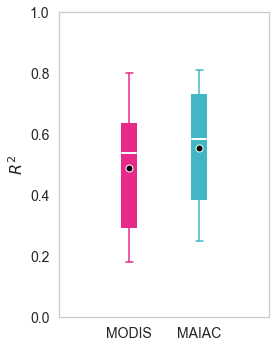

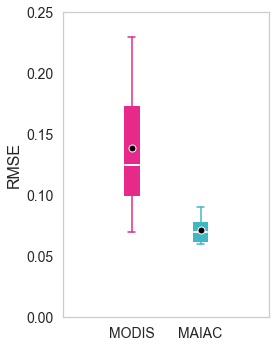

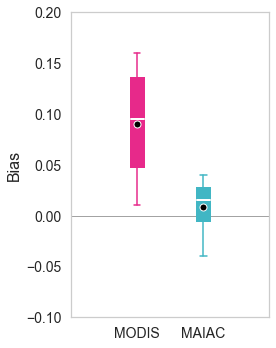

In [268]:
# Valores para cada métrica
R2_MODIS = [0.8,0.49,0.18,0.59,0.23,0.65]
R2_MAIAC = [0.81,0.75,0.35, 0.5, 0.25, 0.67]

RMSE_MODIS= [0.07,0.15,0.23,0.1,0.1,0.18]
RMSE_MAIAC= [0.07, 0.06, 0.06, 0.09, 0.07,0.08]

BIAS_MODIS= [0.01,0.12,0.16,0.04,0.07, 0.14]
BIAS_MAIAC= [-0.04, 0.04, 0.02, 0.01, 0.03, -0.01]



# Crear gráfico
fig, ax = plt.subplots(figsize=(4, 5))

# Crear boxplot con posiciones más cercanas
box = ax.boxplot([R2_MODIS, R2_MAIAC],
                 patch_artist=True,
                 positions=[1, 1.5],  # más cerca entre sí
                 widths=0.1,
                 showmeans=True,
                 meanprops=dict(marker='o', 
                                markerfacecolor='black', 
                                markeredgecolor='white', 
                                markersize=7))

# Colores
colores = ['#e7298a', '#41b6c4']

# Aplicar estilo
for i, color in enumerate(colores):
    box['boxes'][i].set(facecolor=color, edgecolor=color, linewidth=2)
    box['medians'][i].set(color='white', linewidth=2)
    box['whiskers'][i*2].set(color=color, linewidth=1.5)
    box['whiskers'][i*2+1].set(color=color, linewidth=1.5)
    box['caps'][i*2].set(color=color, linewidth=1.5)
    box['caps'][i*2+1].set(color=color, linewidth=1.5)

# Etiquetas personalizadas en X para cada boxplot
ax.set_xticks([1, 1.5])  # Posiciones de los boxplots
ax.set_xticklabels(['MODIS', 'MAIAC'], fontsize=16)  # Nombres de los boxplots

# Estética
ax.set_ylabel(r"$R^{2}$", fontsize=16)
ax.set_ylim(0, 1)
ax.tick_params(axis='both', labelsize=14)
ax.grid(False)
plt.tight_layout()
plt.show()
##############################################
# Crear gráfico rmse
fig, ax = plt.subplots(figsize=(4, 5))

# Crear boxplot con posiciones más cercanas
box = ax.boxplot([RMSE_MODIS, RMSE_MAIAC],
                 patch_artist=True,
                 positions=[1, 1.5],  # más cerca entre sí
                 widths=0.1,
                 showmeans=True,
                 meanprops=dict(marker='o', 
                                markerfacecolor='black', 
                                markeredgecolor='white', 
                                markersize=7))

# Colores
colores = ['#e7298a', '#41b6c4']

# Aplicar estilo
for i, color in enumerate(colores):
    box['boxes'][i].set(facecolor=color, edgecolor=color, linewidth=2)
    box['medians'][i].set(color='white', linewidth=2)
    box['whiskers'][i*2].set(color=color, linewidth=1.5)
    box['whiskers'][i*2+1].set(color=color, linewidth=1.5)
    box['caps'][i*2].set(color=color, linewidth=1.5)
    box['caps'][i*2+1].set(color=color, linewidth=1.5)

# Etiquetas personalizadas en X para cada boxplot
ax.set_xticks([1, 1.5])  # Posiciones de los boxplots
ax.set_xticklabels(['MODIS', 'MAIAC'], fontsize=16)  # Nombres de los boxplots

# Estética
ax.set_ylabel(r"RMSE", fontsize=16)
ax.set_ylim(0, 0.25)
ax.tick_params(axis='both', labelsize=14)
ax.grid(False)
plt.tight_layout()
plt.show()

##############################################
# Crear gráfico rmse
fig, ax = plt.subplots(figsize=(4, 5))
ax.axhline(y=0.0, color="black", linewidth=0.6, alpha=0.6, linestyle='-')
# Crear boxplot con posiciones más cercanas
box = ax.boxplot([BIAS_MODIS, BIAS_MAIAC],
                 patch_artist=True,
                 positions=[1, 1.5],  # más cerca entre sí
                 widths=0.1,
                 showmeans=True,
                 meanprops=dict(marker='o', 
                                markerfacecolor='black', 
                                markeredgecolor='white', 
                                markersize=7))

# Colores
colores = ['#e7298a', '#41b6c4']

# Aplicar estilo
for i, color in enumerate(colores):
    box['boxes'][i].set(facecolor=color, edgecolor=color, linewidth=2)
    box['medians'][i].set(color='white', linewidth=2)
    box['whiskers'][i*2].set(color=color, linewidth=1.5)
    box['whiskers'][i*2+1].set(color=color, linewidth=1.5)
    box['caps'][i*2].set(color=color, linewidth=1.5)
    box['caps'][i*2+1].set(color=color, linewidth=1.5)

# Etiquetas personalizadas en X para cada boxplot
ax.set_xticks([1, 1.5])  # Posiciones de los boxplots
ax.set_xticklabels(['MODIS', 'MAIAC'], fontsize=16)  # Nombres de los boxplots

# Estética
ax.set_ylabel(r"Bias", fontsize=16)
ax.set_ylim(-0.1, 0.2)
ax.tick_params(axis='both', labelsize=14)
ax.grid(False)
plt.tight_layout()
plt.show()


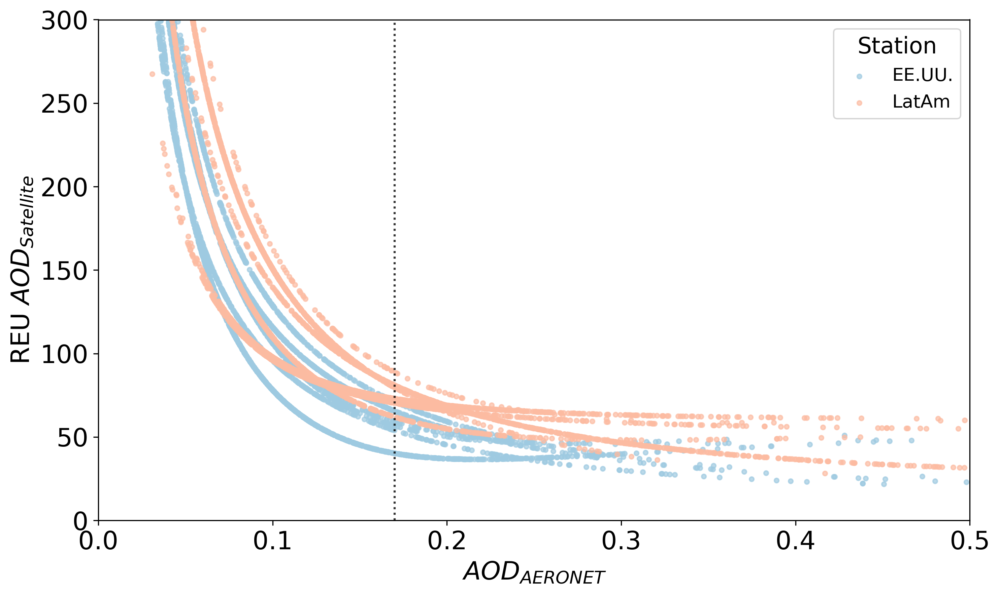

In [15]:
df2 = data = pd.read_csv("D:/Josefina/paper_git/paper_maiac/datasets/V02/processed/final/REU/Latam/REU_TOT_Latam_subt.csv")
df = data = pd.read_csv("D:/Josefina/paper_git/paper_maiac/datasets/V02/processed/final/REU/USA/REU_TOT_USA.csv")

plt.figure(figsize=(10, 6), dpi=300)
x = df["AOD_550_AER_mean"]
y = df["REUx_AOD_550_maiac_mean"]
plt.scatter(x, y, s=10, color='#9ecae1', label="EE.UU.", alpha=0.7)

x2 = df2["AOD_550_AER_mean"]
y2 = df2["REUx_AOD_550_maiac_mean"]
plt.scatter(x2, y2, s=10, color="#fcbba1", label="LatAm", alpha=0.7)

plt.vlines(x=0.17, ymin=0, ymax=300, color='black', linewidth=1.5, linestyle=':', alpha=0.8)

plt.xlabel(r'$AOD_{AERONET}$',size=18)
plt.ylabel(r'REU $AOD_{Satellite}$',size=18)
plt.xlim(0, 0.5)
plt.xticks(np.arange(0, 0.57, 0.1)) 
plt.ylim(0, 300)
plt.grid(False)
plt.tick_params(axis='both', labelsize=18)
plt.legend(title="Station", loc='upper right', bbox_to_anchor=(1,1), fontsize=13, title_fontsize=16) # Cambia bbox_to_anchor según necesites
plt.tight_layout()
plt.show()


## TESIS SERIE TEMPORAL 2015-2024

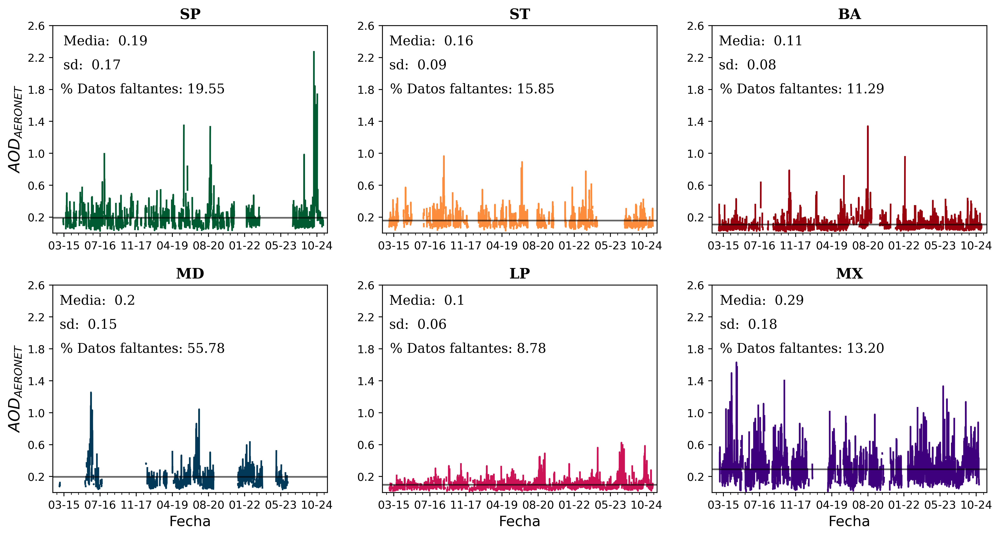

In [18]:
def aeronet_plot (path, date_format,nrows,ncols,colors,plot):
    '''
    The function allows plotting the daily averages of each AERONET station.
    The data of each station of interest is contained in a folder in .csv format previously processed.
    This function goes through the folder and takes each of these files to later make the plot of interest.
    Variables:
    - path : path to the folder where the files in .csv format are located
    - date_format: format of the date column of the file of interest. 
    For example: date_format='%Y-%m-%d %H:%M:%S'
    - nrows: number of rows the plot will have
    - ncols: number of columnas the plot will have
    - color palette for each of AERONET's stations For example: 
    colors = ["#005a32","#fd8d3c","#99000d","#023858","#ce1256","#3f007d"])
    '''
    i=0 
    j=0 

    fig, ax = plt.subplots(ncols=ncols,nrows=nrows,  figsize=(12,6),dpi=400)
    #The folder where the files of each station are located is browsed.
    for p,files in enumerate(os.listdir(path)):
        N = len(os.listdir(path))
        data = pd.read_csv(os.path.join(path,files))
        #A column is created with the date called "Timestamp".
        data["Timestamp"] = data["date"].apply(lambda x: datetime.strptime(x,date_format))
        #Becomes the index column
        data.set_index('Timestamp', inplace = True)
        # Daily mean
        data_mean  = data['aod_550'].resample('1D').mean()
        data_mean_period = data_mean ['2015-01-01':'2024-12-31']
        data_mean_period_len =len(data_mean_period.dropna(how='all'))
        # Station Name
        station_name = files [2:4]
          
        mean = data_mean_period.mean()
      
       
        ########################                PLOT                ########################
        # Figure
        ax[i][j].plot(data_mean_period.index, data_mean_period,c=colors[p])
        ax[i][j].text(data_mean_period.index[1],2.4, "Media: " +" "+ str(round(data_mean_period.mean(),2)),  
            ha="left", va="center",fontdict={'family': 'serif', 
            'color' : 'Black',
            'size': 12})
#         print("Cuantas veces mas grande es el maximo que la media ",round(data_mean_period.max()/(data_mean_period.mean()),2))
        # Daily average line
        ax[i][j].axhline(y=mean, color= "black",linewidth=1.5, alpha=0.6, linestyle = '-')
        
        # Daily lenth text
        ax[i][j].text(data_mean_period.index[1],2.10, "sd: " +" "+ str(round(data_mean_period.std(),2)), 
            ha="left", va="center",fontdict={'family': 'serif', 
            'color' : 'Black',
            #'weight': 'bold',
            'size': 12})
#         ax[i][j].text(data_mean_period.index[1],2.0, "n =" +" "+ str(data_mean_period_len),  
#             ha="left", va="center",fontdict={'family': 'serif', 
#             'color' : 'Black',
#             'size': 10})
      
        # Axes names
        #ax[i][j].set_xlabel(r'$AOD_{Date}$',size=10)
#         ax[i][j].set_xlabel(r'Date',size=14)
#         ax[i][j].set_ylabel(r'$AOD_{AERONET}$',size=14)
        
        ax[0][0].set_xlabel(r'',size=10)
        ax[0][1].set_xlabel(r'',size=10)
        ax[0][2].set_xlabel(r'',size=10)
        ax[1][0].set_xlabel(r'Fecha',size=13)
        ax[1][1].set_xlabel(r'Fecha',size=13)
        ax[1][2].set_xlabel(r'Fecha',size=13)
        
        
        ax[0][0].set_ylabel(r'$AOD_{AERONET}$',size=14)
        ax[0][1].set_ylabel(r'',size=18)
        ax[0][2].set_ylabel(r'',size=18)
        ax[1][0].set_ylabel(r'$AOD_{AERONET}$',size=14)
        ax[1][1].set_ylabel(r'',size=18)
        ax[1][2].set_ylabel(r'',size=18)
        
        #Ticks
        ax[i][j].yaxis.set_ticks(np.arange(0.2, 2.65, 0.4))
        ax[i][j].set_ylim(0,2.6)
        
        # Title of each subplot corresponds to the name of the AERONET station.
        ax[i][j].set_title(station_name,fontsize=13,fontdict={'family': 'serif', 
            'color' : 'Black',
            'weight': 'bold',
            'size': 22})
        # Day fotmat
        Format = mdates.DateFormatter('%m-%y')
        ax[i][j].xaxis.set_major_formatter(Format)
        ax[i][j].xaxis.set_major_locator(ticker.AutoLocator())
        ax[i][j].xaxis.set_minor_locator(ticker.AutoMinorLocator())
       
        #ax[i][j].set_xlim('01-2015','12-2022')

        ax[i][j].set_xlim(pd.Timestamp('2014-10-01'), pd.Timestamp('2025-02-28'))

#         ax[2,1].set_visible(False)
        #ax[2,2].set_visible(False)
    
        #2015-2024
        faltate_datos = 3653-data_mean_period_len #2015-2024
        porc_faltante_datos = (faltate_datos/3653)*100


        # Imprimir el resultado en formato f-string
#         print(f"num_dias faltantes: {faltate_datos}")
#         print(f"% dias faltantes: {porc_faltante_datos:.2f}%")
#         # Location of data in each subplot
#         print(station_name)
    
        if j == ncols-1:
            i = i+1
            j = 0
        else:
            j = j+1
    ax[0][0].text(data_mean_period.index[1],1.8, "% Datos faltantes: 19.55",  
                    ha="left", va="center",fontdict={'family': 'serif', 
                    'color' : 'Black',
                    'size': 12})
    ax[0][1].text(data_mean_period.index[1],1.8, "% Datos faltantes: 15.85",  
                    ha="left", va="center",fontdict={'family': 'serif', 
                    'color' : 'Black',
                    'size': 12})
    ax[0][2].text(data_mean_period.index[1],1.8, "% Datos faltantes: 11.29",  
                    ha="left", va="center",fontdict={'family': 'serif', 
                    'color' : 'Black',
                    'size': 12})
    ax[1][0].text(data_mean_period.index[1],1.8, "% Datos faltantes: 55.78",  
                    ha="left", va="center",fontdict={'family': 'serif', 
                    'color' : 'Black',
                    'size': 12})
    ax[1][1].text(data_mean_period.index[1],1.8, "% Datos faltantes: 8.78",  
                    ha="left", va="center",fontdict={'family': 'serif', 
                    'color' : 'Black',
                    'size': 12})
    ax[1][2].text(data_mean_period.index[1],1.8, "% Datos faltantes: 13.20",  
                    ha="left", va="center",fontdict={'family': 'serif', 
                    'color' : 'Black',
                    'size': 12})
#     ax[0][1].text(data_mean_period.index[1],2.10, "        " , 
#     ha="left", va="center",fontdict={'family': 'serif', 
#     'color' : 'Black',
#     #'weight': 'bold',
#     'size': 12})
#     ax[0][1].text(data_mean_period.index[1],2.10, "           0 " , 
#     ha="left", va="center",fontdict={'family': 'serif', 
#     'color' : 'Black',
#     #'weight': 'bold',
#     'size': 12})
#     ax[1][0].text(data_mean_period.index[1],2.4, "                     0",  
#     ha="left", va="center",fontdict={'family': 'serif', 
#     'color' : 'Black',
#     'size': 12})
    plt.subplots_adjust(left=0.01,#0.125,
                    bottom=0.01,#0.1, 
                    right=0.99,#0.9, 
                    top=0.99,#0.9, 
                    wspace=0.2, 
                    hspace=0.25)#0.4)
   # Save the plot to the current path
    if plot == 'save':
        return(plt.savefig("aeronet_plot2.jpg", dpi=500))
    else:
        return(plt.show())
    
#VERSION 02 MAIAC - AERONET
# Latam cities
# dir_path_latam = "D:/Josefina/paper_git/paper_maiac/datasets/V02/aeronet/datasets_interp_s_L02/Latam"
dir_path_latam = "D:/Josefina/paper_git/paper_maiac/datasets/V03/aeronet/datasets_interp_s_L02/Latam"
date_format_latam = '%d/%m/%Y %H:%M'#'%Y-%m-%d %H:%M:%S'

nrows=2
ncols=3
color = ["#005a32","#fd8d3c","#99000d","#023858","#ce1256","#3f007d","#c994c7"]
plot= 'NO'
aeronet_plot_latam = aeronet_plot(path=dir_path_latam,date_format=date_format_latam,nrows=nrows,ncols=ncols,colors = color, plot=plot)
aeronet_plot_latam


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


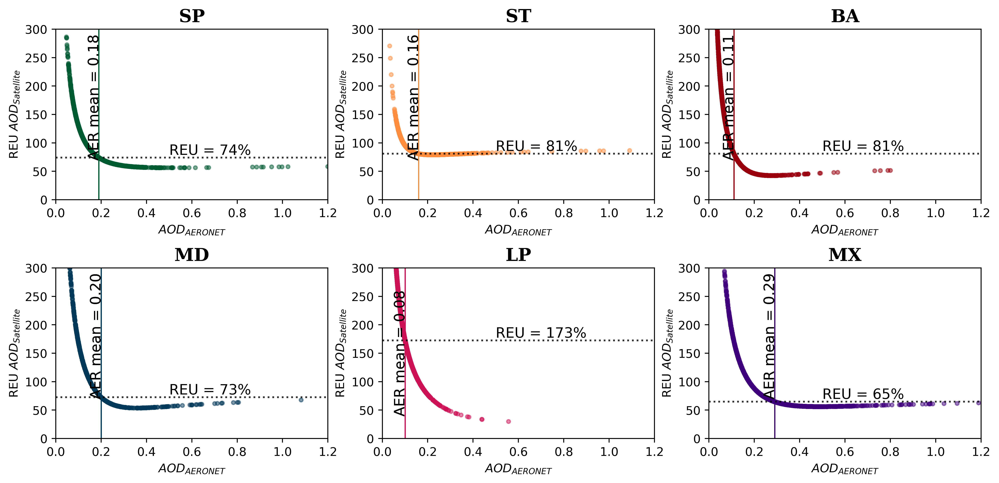

In [36]:
# dir = "D:/Josefina/paper_git/paper_maiac/datasets/V02/processed/merge_AER-MAIAC/Latam_C61/dia/1km/1km60min_copy"
dir = "D:/Josefina/paper_git/paper_maiac/datasets/V03/processed/merge_AER-MAIAC/Latam_C61/dia/25km/120mins"
resolucion_espaciotemporal = "1KM-60MIN-TOT"
REU_plot(path=dir,date_format='%Y-%m-%d',nrows=2,ncols=3,color_maiac = ["#005a32","#fd8d3c","#99000d","#023858","#ce1256","#3f007d"],plot = 'LALAL',resolucion_espaciotemporal=resolucion_espaciotemporal)


In [41]:
# METRICAS 2015-2024 V03
mean_latam = [0.1917712052347237,0.15838700428798888,0.10770034466035062,0.19696905759027927,0.0975611106811475,0.2914256785647766]
sd_latam=[0.1692083314989659, 0.09274596203086799,0.08436053427082663,0.15122995864594488,0.06212967887208986,0.18438450129096076]
missing_values_latam = [20,16,11,46,9,13]


mean_usa = [0.12255158881318577,0.1344364823898369,0.13521084413098566,0.11521390643756446,0.1394124457141544,0.14801749754987586]
sd_usa = [0.12542156545446584,0.10110942593409451,0.1344772666310658,0.07734780187075058,0.14652406003015575,0.10488493491290415]
# missing_values_usa = [20,16,11,46,9,13]
missing_values_usa = [10.63, 12.62, 11.15, 11.95, 40.62, 11.77]



# Valores para cada métrica
R2_latam = [0.88,0.66,0.41,0.36,0.27,0.71]
R2_usa = [0.78783,0.71674,0.73487, 0.70568, 0.82207, 0.54475]

RMSE_latam = [0.07,0.06,0.06,0.08,0.08 ,0.07]
RMSE_usa = [0.05849,0.05387, 0.06522, 0.04971, 0.08288,0.0635]

BIAS_latam = [-0.04378, -0.03588, 0.01919, 0.01096, 0.05, -0.00778]
BIAS_usa = [0.0189, 0.01681, 0.02546, 0.01634, 0.00824, 0.02912]



print(np.mean(BIAS_latam))
print(np.mean(BIAS_usa))
# print(np.min(sd_latam))
# print(np.min(sd_usa))
# print(np.max(sd_latam))
# print(np.max(sd_usa))

-0.0012150000000000015
0.019145


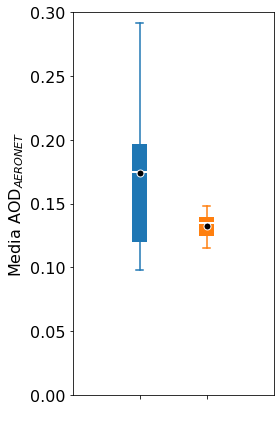

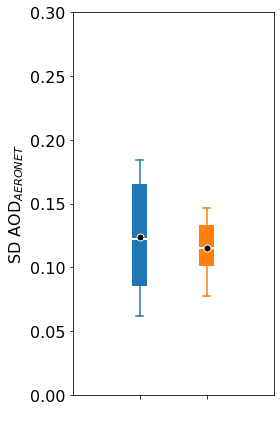

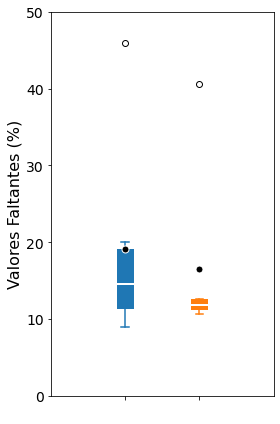

In [28]:


# Crear gráfico
fig, ax = plt.subplots(figsize=(4, 6))

# Crear boxplot con posiciones más cercanas
box = ax.boxplot([mean_latam, mean_usa],
                 patch_artist=True,
                 positions=[1, 1.5],  # más cerca entre sí
                 widths=0.1,
                 showmeans=True,
                 meanprops=dict(marker='o', 
                                markerfacecolor='black', 
                                markeredgecolor='white', 
                                markersize=7))

# Colores
# colores = ['#e7298a', '#41b6c4']
colores = ['#1f77b4', '#ff7f0e']

# Aplicar estilo
for i, color in enumerate(colores):
    box['boxes'][i].set(facecolor=color, edgecolor=color, linewidth=2)
    box['medians'][i].set(color='white', linewidth=2)
    box['whiskers'][i*2].set(color=color, linewidth=1.5)
    box['whiskers'][i*2+1].set(color=color, linewidth=1.5)
    box['caps'][i*2].set(color=color, linewidth=1.5)
    box['caps'][i*2+1].set(color=color, linewidth=1.5)

# Etiquetas personalizadas en X para cada boxplot
ax.set_xticks([1, 1.5])  # Posiciones de los boxplots
# ax.set_xticklabels(['AmericaLat', 'EE.UU'], fontsize=20)  # Nombres de los boxplots
ax.set_xticklabels([' ', ' '], fontsize=20)  # Nombres de los boxplots
# Estética
ax.set_ylabel(r"Media AOD$_{AERONET}$", fontsize=16)
ax.set_ylim(0, 0.3)
ax.tick_params(axis='both', labelsize=16)
ax.grid(False)
plt.tight_layout()
plt.show()
##############################################
# Crear gráfico rmse
fig, ax = plt.subplots(figsize=(4, 6))

# Crear boxplot con posiciones más cercanas
box = ax.boxplot([sd_latam, sd_usa],
                 patch_artist=True,
                 positions=[1, 1.5],  # más cerca entre sí
                 widths=0.1,
                 showmeans=True,
                 meanprops=dict(marker='o', 
                                markerfacecolor='black', 
                                markeredgecolor='white', 
                                markersize=7))

# Colores
# colores = ['#e7298a', '#41b6c4']
colores = ['#1f77b4', '#ff7f0e']
# Aplicar estilo
for i, color in enumerate(colores):
    box['boxes'][i].set(facecolor=color, edgecolor=color, linewidth=2)
    box['medians'][i].set(color='white', linewidth=2)
    box['whiskers'][i*2].set(color=color, linewidth=1.5)
    box['whiskers'][i*2+1].set(color=color, linewidth=1.5)
    box['caps'][i*2].set(color=color, linewidth=1.5)
    box['caps'][i*2+1].set(color=color, linewidth=1.5)

# Etiquetas personalizadas en X para cada boxplot
ax.set_xticks([1, 1.5])  # Posiciones de los boxplots
# ax.set_xticklabels(['America Latina', 'EE.UU'], fontsize=20)  # Nombres de los boxplots
ax.set_xticklabels([' ', ' '], fontsize=20)  # Nombres de los boxplots

# Estética
ax.set_ylabel(r"SD AOD$_{AERONET}$", fontsize=16)
# ax.set_ylim(0, 0.10)
ax.set_ylim(0, 0.3)
ax.tick_params(axis='both', labelsize=16)
ax.grid(False)
plt.tight_layout()
plt.show()



##############################################
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(4, 6))
ax.axhline(y=0.0, color="black", linewidth=0.6, alpha=0.6, linestyle='-')

box = ax.boxplot([missing_values_latam, missing_values_usa],
                 patch_artist=True,
                 positions=[1, 1.5],
                 widths=0.1,
                 showmeans=True,
                 meanprops=dict(marker='o', 
                                markerfacecolor='black', 
                                markeredgecolor='white', 
                                markersize=7))

colores = ['#1f77b4', '#ff7f0e']

for i, color in enumerate(colores):
    box['boxes'][i].set(facecolor=color, edgecolor=color, linewidth=2)
    box['medians'][i].set(color='white', linewidth=2)
    box['whiskers'][i*2].set(color=color, linewidth=1.5)
    box['whiskers'][i*2+1].set(color=color, linewidth=1.5)
    box['caps'][i*2].set(color=color, linewidth=1.5)
    box['caps'][i*2+1].set(color=color, linewidth=1.5)

# Cambiar color y opacidad de los outliers
for flier in box['fliers']:
    flier.set(marker='o', color='black', alpha=1)

ax.set_xticks([1, 1.5])
# ax.set_xticklabels(['America n/Latina', 'EE.UU'], fontsize=20)  # Nombres de los boxplots
ax.set_xticklabels([' ', ' '], fontsize=20)  # Nombres de los boxplots
ax.set_ylabel(r"Valores Faltantes (%)", fontsize=16)
ax.set_ylim(0, 50)
ax.tick_params(axis='both', labelsize=14)
ax.grid(False)
plt.tight_layout()
plt.show()


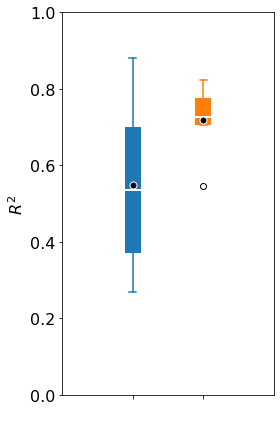

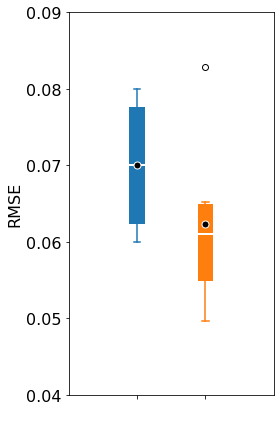

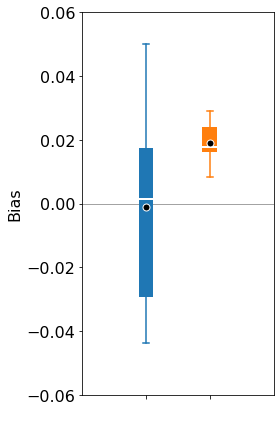

In [34]:
# Crear gráfico
fig, ax = plt.subplots(figsize=(4, 6))

# Crear boxplot con posiciones más cercanas
box = ax.boxplot([R2_latam, R2_usa],
                 patch_artist=True,
                 positions=[1, 1.5],  # más cerca entre sí
                 widths=0.1,
                 showmeans=True,
                 meanprops=dict(marker='o', 
                                markerfacecolor='black', 
                                markeredgecolor='white', 
                                markersize=7))

# Colores
# colores = ['#e7298a', '#41b6c4']
colores = ['#1f77b4', '#ff7f0e']

# Aplicar estilo
for i, color in enumerate(colores):
    box['boxes'][i].set(facecolor=color, edgecolor=color, linewidth=2)
    box['medians'][i].set(color='white', linewidth=2)
    box['whiskers'][i*2].set(color=color, linewidth=1.5)
    box['whiskers'][i*2+1].set(color=color, linewidth=1.5)
    box['caps'][i*2].set(color=color, linewidth=1.5)
    box['caps'][i*2+1].set(color=color, linewidth=1.5)

# Etiquetas personalizadas en X para cada boxplot
ax.set_xticks([1, 1.5])  # Posiciones de los boxplots
# ax.set_xticklabels(['AmericaLat', 'EE.UU'], fontsize=20)  # Nombres de los boxplots
ax.set_xticklabels([' ', ' '], fontsize=20)  # Nombres de los boxplots
# Estética
ax.set_ylabel(r"$R^{2}$", fontsize=16)
ax.set_ylim(0, 1)
ax.tick_params(axis='both', labelsize=16)
ax.grid(False)
plt.tight_layout()
plt.show()
##############################################
# Crear gráfico rmse
fig, ax = plt.subplots(figsize=(4, 6))

# Crear boxplot con posiciones más cercanas
box = ax.boxplot([RMSE_latam, RMSE_usa],
                 patch_artist=True,
                 positions=[1, 1.5],  # más cerca entre sí
                 widths=0.1,
                 showmeans=True,
                 meanprops=dict(marker='o', 
                                markerfacecolor='black', 
                                markeredgecolor='white', 
                                markersize=7))

# Colores
# colores = ['#e7298a', '#41b6c4']
colores = ['#1f77b4', '#ff7f0e']
# Aplicar estilo
for i, color in enumerate(colores):
    box['boxes'][i].set(facecolor=color, edgecolor=color, linewidth=2)
    box['medians'][i].set(color='white', linewidth=2)
    box['whiskers'][i*2].set(color=color, linewidth=1.5)
    box['whiskers'][i*2+1].set(color=color, linewidth=1.5)
    box['caps'][i*2].set(color=color, linewidth=1.5)
    box['caps'][i*2+1].set(color=color, linewidth=1.5)

# Etiquetas personalizadas en X para cada boxplot
ax.set_xticks([1, 1.5])  # Posiciones de los boxplots
# ax.set_xticklabels(['America Latina', 'EE.UU'], fontsize=20)  # Nombres de los boxplots
ax.set_xticklabels([' ', ' '], fontsize=20)  # Nombres de los boxplots

# Estética
ax.set_ylabel(r"RMSE", fontsize=16)
# ax.set_ylim(0, 0.10)
ax.set_ylim(0.04, 0.09)
ax.tick_params(axis='both', labelsize=16)
ax.grid(False)
plt.tight_layout()
plt.show()

##############################################
# Crear gráfico rmse
fig, ax = plt.subplots(figsize=(4, 6))
ax.axhline(y=0.0, color="black", linewidth=0.6, alpha=0.6, linestyle='-')
# Crear boxplot con posiciones más cercanas
box = ax.boxplot([BIAS_latam, BIAS_usa],
                 patch_artist=True,
                 positions=[1, 1.5],  # más cerca entre sí
                 widths=0.1,
                 showmeans=True,
                 meanprops=dict(marker='o', 
                                markerfacecolor='black', 
                                markeredgecolor='white', 
                                markersize=7))

# Colores
# colores = ['#e7298a', '#41b6c4']
colores = ['#1f77b4', '#ff7f0e']
# Aplicar estilo
for i, color in enumerate(colores):
    box['boxes'][i].set(facecolor=color, edgecolor=color, linewidth=2)
    box['medians'][i].set(color='white', linewidth=2)
    box['whiskers'][i*2].set(color=color, linewidth=1.5)
    box['whiskers'][i*2+1].set(color=color, linewidth=1.5)
    box['caps'][i*2].set(color=color, linewidth=1.5)
    box['caps'][i*2+1].set(color=color, linewidth=1.5)

# Etiquetas personalizadas en X para cada boxplot
ax.set_xticks([1, 1.5])  # Posiciones de los boxplots
ax.set_xticklabels([' ', ' '], fontsize=20)  # Nombres de los boxplots

# Estética
ax.set_ylabel(r"Bias", fontsize=16)
ax.set_ylim(-0.06, 0.06)
ax.tick_params(axis='both', labelsize=16)
ax.grid(False)
plt.tight_layout()
plt.show()



